In [1]:
# step 0: imports
import sys
sys.path.insert(0, r"C:\Users\kwill\Keenan_UCB-O365\OneDrive_UCB-O365\GitHub_Repos\xraylarch") #Path to larch 
# sys.path.insert(0, r"C:\Users\Keenan Wyatt\OneDrive - UCB-O365\GitHub_Repos\xraylarch") #Path to larch 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.interpolate import interp1d
from larch.io import read_athena, read_ascii
from larch.xafs import (pre_edge, autobk, xftf, 
                        ff2chi, feffpath, feffit_transform, feffit_dataset, feffit, feffit_report, TransformGroup, path2chi)
from larch.fitting import param, guess, param_group
from larch.plot.plotly_xafsplots import (plot_mu, plot_chik, plot_chir, plot_chifit, 
                                         multi_plot, plotlabels, set_label_weight)
from larch.utils import group2dict
from pathlib import Path
from larch.wxlib import plotlabels as plab 
from scipy.signal import savgol_filter   
try:
    # Try the newer name first
    from scipy.integrate import simpson as integrate_method
except ImportError:
    try:
        # Try the older name
        from scipy.integrate import simps as integrate_method
    except ImportError:
        # Fall back to trapz which is always available
        from scipy.integrate import trapz as integrate_method
        print("Note: Using trapz for integration instead of simpson/simps")      
import matplotlib.cm as cm  
from larch import Group                                
import os 

In [10]:
# URGENT FIX: LaTeX formatting errors
# The errors are caused by incorrect LaTeX syntax in matplotlib labels

# Fix 1: Disable LaTeX rendering to avoid parsing errors
import matplotlib.pyplot as plt
plt.rcParams['text.usetex'] = False

# Fix 2: The problematic strings need to be corrected:
# WRONG: r'$\\mu(E)$ (normalized)'  (double backslash causes parse error)
# RIGHT: r'$\mu(E)$ (normalized)'   (single backslash for LaTeX)

# Fix 3: Same issue with derivative:
# WRONG: r'$d\\mu/dE$'
# RIGHT: r'$d\mu/dE$'

print("LaTeX formatting fixes applied:")
print("- Disabled LaTeX rendering to prevent parse errors")
print("- The function needs to be updated to use single backslashes in LaTeX strings")
print("- This will resolve the ValueError about ParseException")


LaTeX formatting fixes applied:
- Disabled LaTeX rendering to prevent parse errors
- The function needs to be updated to use single backslashes in LaTeX strings
- This will resolve the ValueError about ParseException


Running enhanced batch processing with noise estimation and outlier removal...
Found 6 project files
Loading projects and applying noise analysis...
\nProcessing project: CsPbI3_100mM
  Processing group: CsPbI3_100mM_merge
    Pre-edge: e0 = 35985.28, edge_step = 0.9424
    Background subtraction completed
    Noise analysis:
      epsilon_k: 0.001301
      epsilon_r: 0.005991
      kmax_suggest: 10.00 Å⁻¹
    Found 20 outliers (|chi| > 0.003902)
    Successfully interpolated over 20 outliers
\nProcessing project: CsPbI3_1p0M
  Processing group: CsPbI3_1p0M_merge
    Pre-edge: e0 = 35985.00, edge_step = 0.9939
    Background subtraction completed
    Noise analysis:
      epsilon_k: 0.000910
      epsilon_r: 0.004190
      kmax_suggest: 10.00 Å⁻¹
    Found 66 outliers (|chi| > 0.002729)
    Successfully interpolated over 66 outliers
\nProcessing project: CsPbI3_1p29M
  Processing group: CsPbI3_1p3M_DMSO_Cs_Kedge
    Pre-edge: e0 = 35985.00, edge_step = 0.9782
    Background subtraction

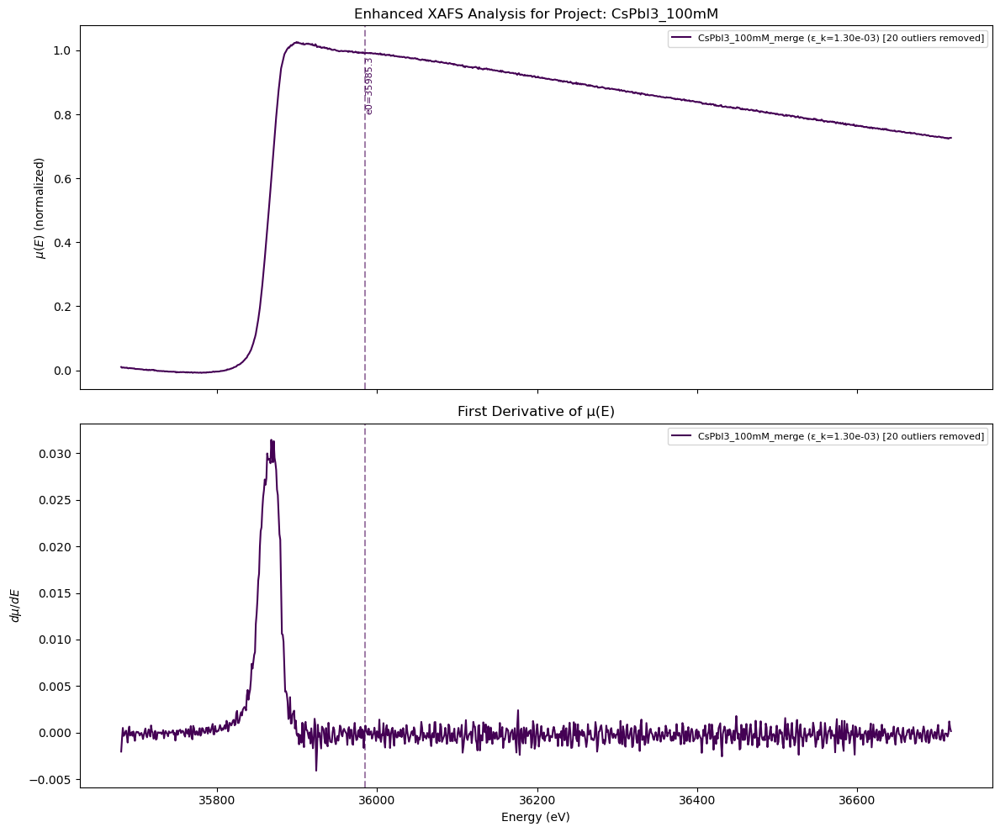

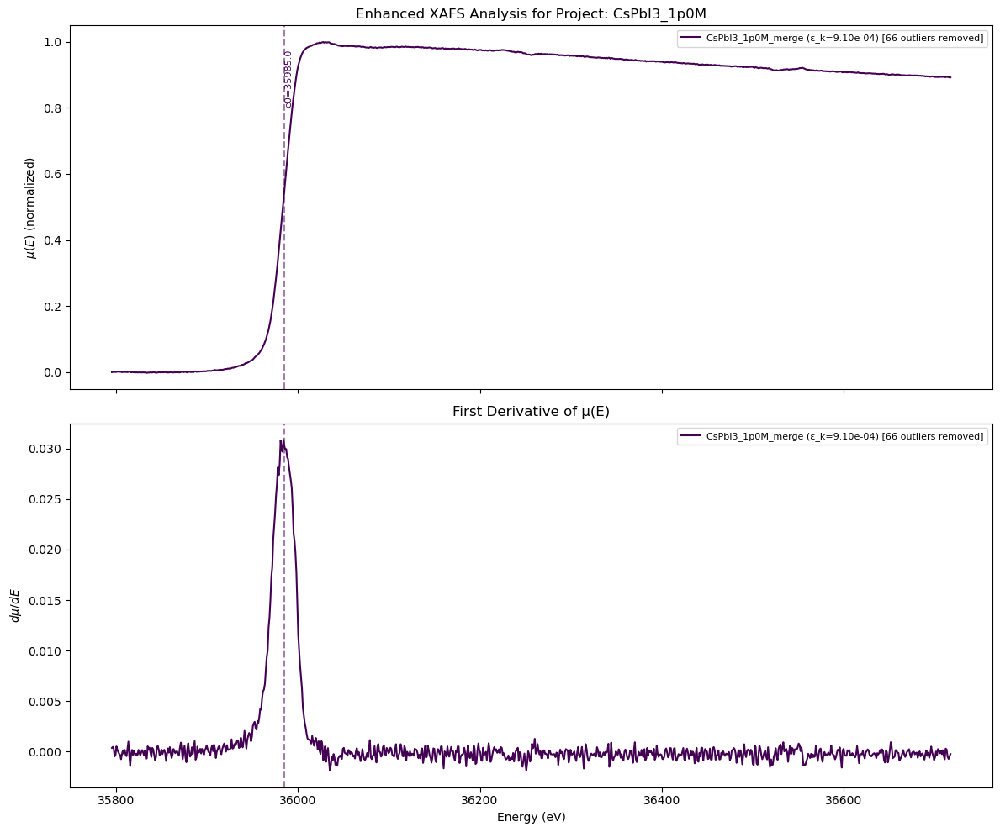

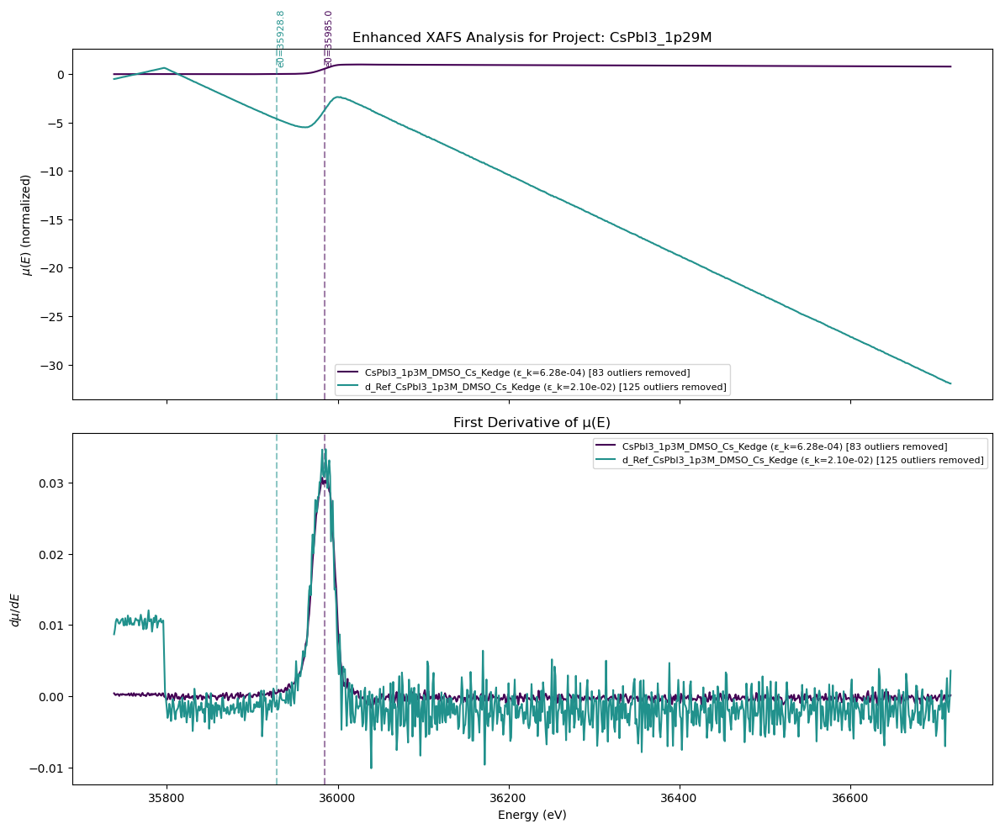

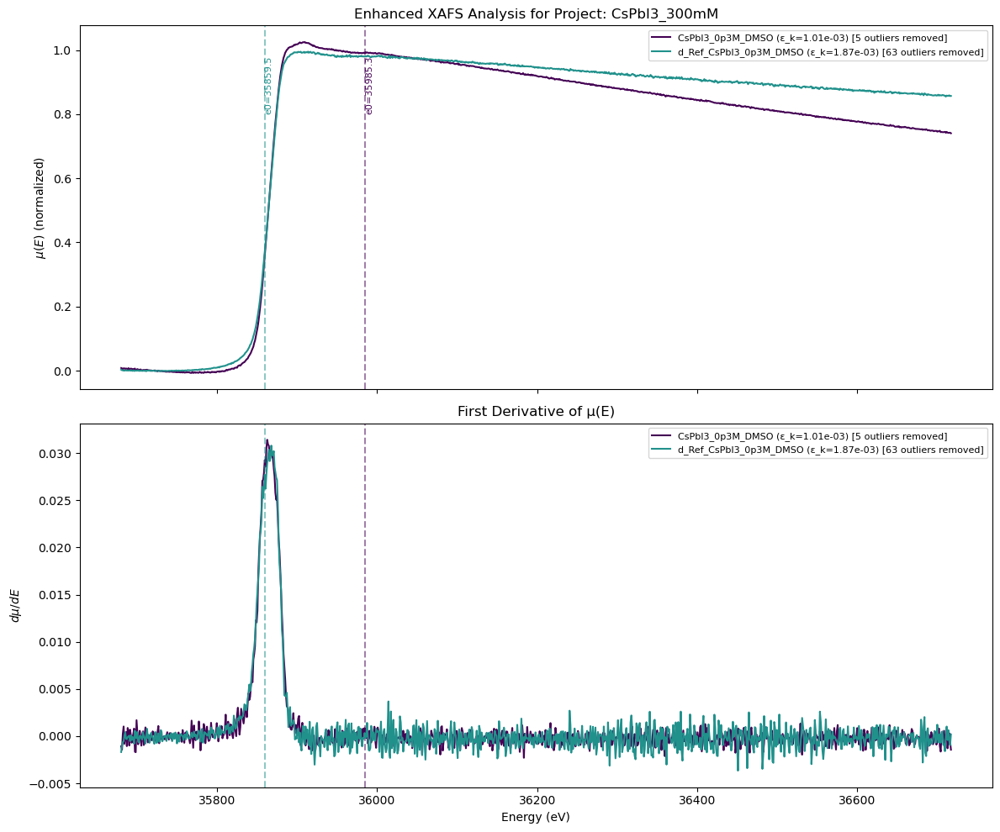

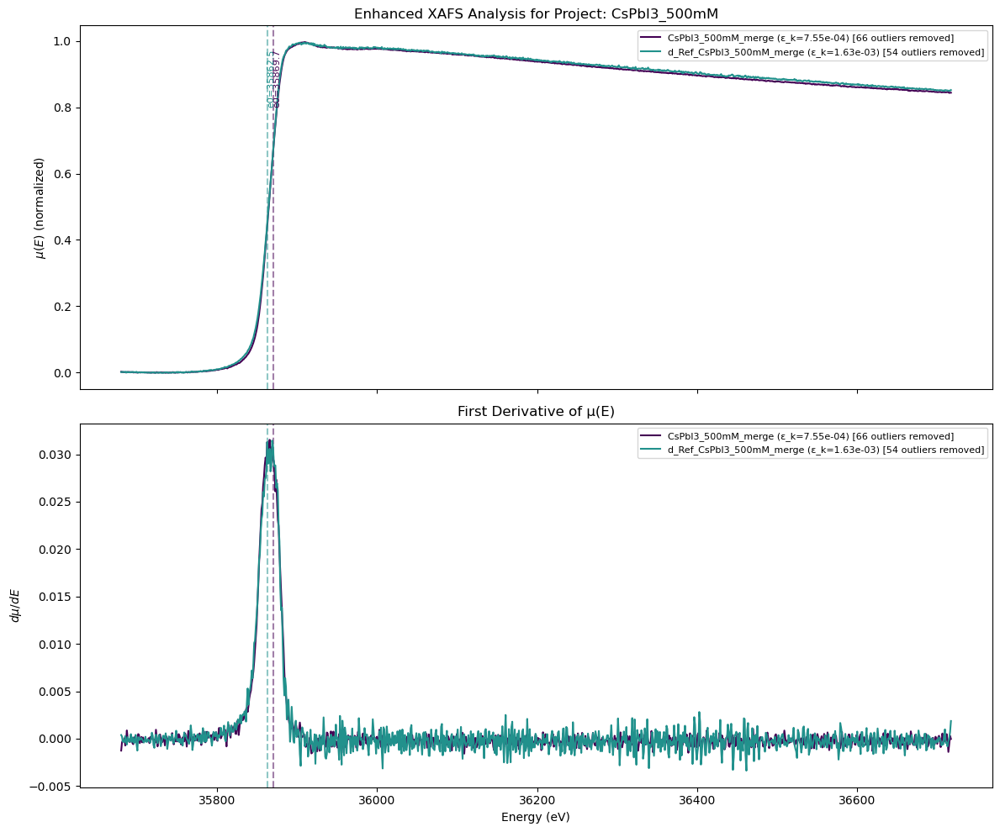

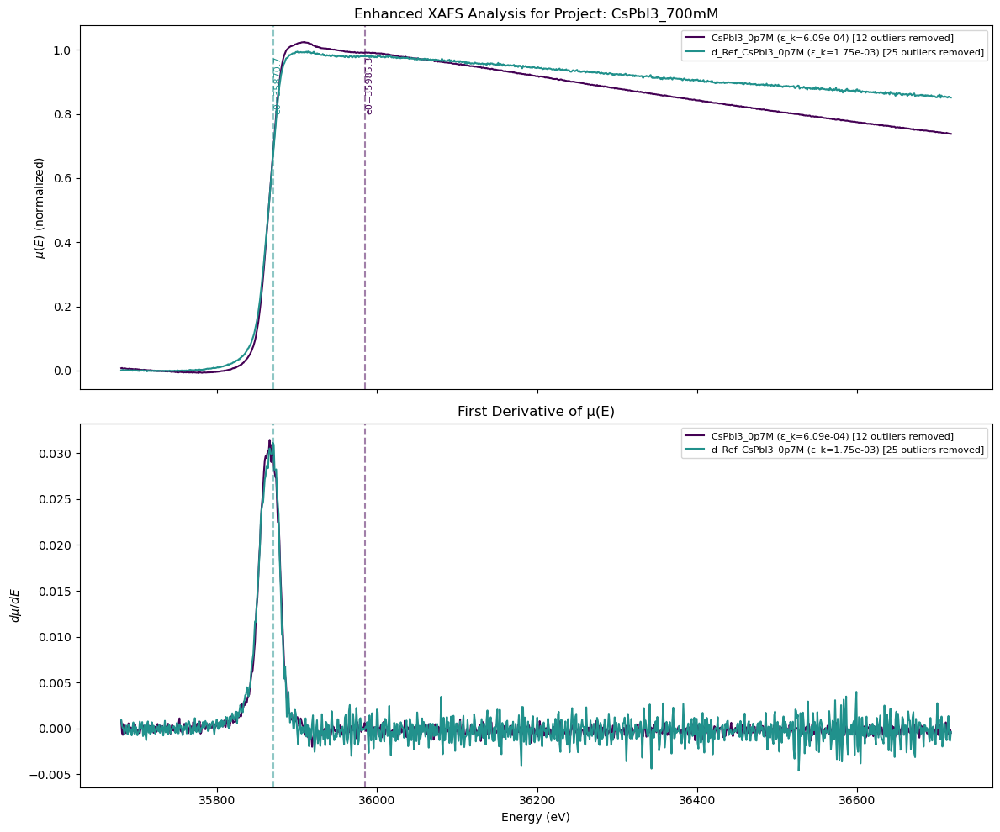

\n============================================================
NOISE ANALYSIS SUMMARY
\nProject: CsPbI3_100mM
  CsPbI3_100mM_merge:
    Noise level (ε_k): 1.30e-03
    Suggested k_max: 10.0 Å⁻¹ | 20 outliers removed
\nProject: CsPbI3_1p0M
  CsPbI3_1p0M_merge:
    Noise level (ε_k): 9.10e-04
    Suggested k_max: 10.0 Å⁻¹ | 66 outliers removed
\nProject: CsPbI3_1p29M
  CsPbI3_1p3M_DMSO_Cs_Kedge:
    Noise level (ε_k): 6.28e-04
    Suggested k_max: 10.0 Å⁻¹ | 83 outliers removed
  d_Ref_CsPbI3_1p3M_DMSO_Cs_Kedge:
    Noise level (ε_k): 2.10e-02
    Suggested k_max: 10.0 Å⁻¹ | 125 outliers removed
\nProject: CsPbI3_300mM
  CsPbI3_0p3M_DMSO:
    Noise level (ε_k): 1.01e-03
    Suggested k_max: 10.0 Å⁻¹ | 5 outliers removed
  d_Ref_CsPbI3_0p3M_DMSO:
    Noise level (ε_k): 1.87e-03
    Suggested k_max: 10.0 Å⁻¹ | 63 outliers removed
\nProject: CsPbI3_500mM
  CsPbI3_500mM_merge:
    Noise level (ε_k): 7.55e-04
    Suggested k_max: 10.0 Å⁻¹ | 66 outliers removed
  d_Ref_CsPbI3_500mM_merge:
    

In [28]:
def batch_process_athena_projects_enhanced(projects_path, noise_threshold=3.0, remove_outliers=True):
    """
    Enhanced batch process all Athena projects with noise estimation and outlier removal.
    
    Parameters:
    -----------
    projects_path : str or Path
        Path to a directory containing Athena project files (.prj)
    noise_threshold : float, optional
        Threshold for identifying outliers (in standard deviations). Default is 3.0
    remove_outliers : bool, optional
        Whether to remove outliers from the data. Default is True
    
    This function:
    - Loads all Athena project files from the specified path
    - Applies pre-edge subtraction on each group in each project
    - Estimates noise levels using estimate_noise() for EXAFS data
    - Optionally removes outliers that exceed the noise threshold
    - Plots normalized absorption curves and derivatives for each project
    - Returns the loaded projects for further analysis
    
    Returns:
    --------
    dict
        Dictionary of loaded projects that can be used for further analysis
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib import cm
    from pathlib import Path
    from larch.io import read_athena
    from larch.xafs import pre_edge, estimate_noise, autobk, xftf
    from scipy.interpolate import interp1d
    
    # Convert to Path object if it's a string
    projects_path = Path(projects_path)
    
    # Check if the path exists
    if not projects_path.exists():
        print(f"Path does not exist: {projects_path}")
        return None
    
    # Find all .prj files
    project_files = list(projects_path.glob("*.prj"))
    
    if not project_files:
        print(f"No Athena project files found in {projects_path}")
        return None
    
    projects = {}
    
    print(f"Found {len(project_files)} project files")
    print("Loading projects and applying noise analysis...")
    
    for prj_file in project_files:
        proj_name = prj_file.stem
        print(f"\\nProcessing project: {proj_name}")
        try:
            project = read_athena(str(prj_file))
            projects[proj_name] = project
            
            # Process each group in the project
            for name, group in project.groups.items():
                print(f"  Processing group: {name}")
                
                # Apply pre-edge subtraction
                pre_edge(group)
                print(f"    Pre-edge: e0 = {group.e0:.2f}, edge_step = {group.edge_step:.4f}")
                
                # Perform background subtraction to generate k and chi arrays
                if hasattr(group, 'energy') and hasattr(group, 'mu'):
                    try:
                        # Apply background subtraction (autobk) to get EXAFS data
                        autobk(group, rbkg=1.0, kweight=2)  # Default parameters
                        print(f"    Background subtraction completed")
                        
                        # Now check if we have EXAFS data (k and chi) for noise analysis
                        if hasattr(group, 'k') and hasattr(group, 'chi') and len(group.k) > 10:
                            try:
                                # Estimate noise for this group
                                estimate_noise(group.k, group.chi, group=group)
                                print(f"    Noise analysis:")
                                print(f"      epsilon_k: {group.epsilon_k:.6f}")
                                print(f"      epsilon_r: {group.epsilon_r:.6f}")
                                print(f"      kmax_suggest: {group.kmax_suggest:.2f} Å⁻¹")
                                
                                # Store original data before any filtering
                                if not hasattr(group, 'chi_original'):
                                    group.chi_original = group.chi.copy()
                                    group.k_original = group.k.copy()
                                
                                # Remove outliers if requested
                                if remove_outliers and hasattr(group, 'epsilon_k'):
                                    # Calculate the threshold for outlier detection
                                    threshold = noise_threshold * group.epsilon_k
                                    
                                    # Find outliers (points where |chi| > threshold)
                                    outliers_mask = np.abs(group.chi) > threshold
                                    outlier_count = outliers_mask.sum()
                                    
                                    if outlier_count > 0:
                                        print(f"    Found {outlier_count} outliers (|chi| > {threshold:.6f})")
                                        
                                        # Get valid (non-outlier) indices
                                        valid_indices = ~outliers_mask
                                        
                                        if valid_indices.sum() > 2:  # Need at least 2 points for interpolation
                                            valid_k = group.k[valid_indices]
                                            valid_chi = group.chi[valid_indices]
                                            
                                            # Interpolate over outliers
                                            if len(valid_k) > 1:
                                                try:
                                                    interpolator = interp1d(valid_k, valid_chi, 
                                                                          kind='linear', bounds_error=False, 
                                                                          fill_value='extrapolate')
                                                    
                                                    # Create interpolated version
                                                    group.chi_interpolated = group.chi.copy()
                                                    group.chi_interpolated[outliers_mask] = interpolator(group.k[outliers_mask])
                                                    
                                                    # Store filtered version (with outliers marked as NaN)
                                                    group.chi_filtered = group.chi.copy()
                                                    group.chi_filtered[outliers_mask] = np.nan
                                                    
                                                    # Replace original chi with interpolated version
                                                    group.chi = group.chi_interpolated.copy()
                                                    
                                                    print(f"    Successfully interpolated over {outlier_count} outliers")
                                                    
                                                    # Store outlier information for later reference
                                                    group.outliers_mask = outliers_mask
                                                    group.outliers_removed = outlier_count
                                                    group.noise_threshold_used = threshold
                                                    
                                                except Exception as interp_error:
                                                    print(f"    Warning: Interpolation failed: {interp_error}")
                                                    group.chi = group.chi_original.copy()  # Restore original
                                            else:
                                                print(f"    Warning: Not enough valid points for interpolation")
                                        else:
                                            print(f"    Warning: Too many outliers ({outlier_count}/{len(group.chi)}), skipping filtering")
                                    else:
                                        print(f"    No outliers detected")
                                        
                            except Exception as noise_error:
                                print(f"    Warning: Could not estimate noise for {name}: {noise_error}")
                                continue
                                
                        elif hasattr(group, 'k') and hasattr(group, 'chi'):
                            print(f"    Insufficient EXAFS data points ({len(group.k)}) for noise analysis")
                        else:
                            print(f"    Background subtraction did not produce EXAFS data")
                            
                    except Exception as bkg_error:
                        print(f"    Warning: Background subtraction failed for {name}: {bkg_error}")
                        continue
                else:
                    print(f"    No absorption data (energy, mu) available for background subtraction")
                    
        except Exception as e:
            print(f"Error loading {prj_file.name}: {e}")
            continue
    
    if not projects:
        print("No valid projects were loaded.")
        return None
    
    print(f"\\nSuccessfully processed {len(projects)} projects")
    
    # Plot project-by-project without alignment
    for proj_name, project in projects.items():
        energy_min_list = [group.energy.min() for group in project.groups.values() if hasattr(group, 'energy')]
        energy_max_list = [group.energy.max() for group in project.groups.values() if hasattr(group, 'energy')]
        global_energy_min = min(energy_min_list) if energy_min_list else None
        global_energy_max = max(energy_max_list) if energy_max_list else None

        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

        # Generate color map for groups
        num_groups = len(project.groups)
        cmap = cm.viridis
        colors = [cmap(i/num_groups) for i in range(num_groups)]
        
        for i, (name, group) in enumerate(project.groups.items()):
            if hasattr(group, 'energy') and hasattr(group, 'mu') and hasattr(group, 'norm'):
                color = colors[i]
                
                # Create label with noise info if available
                label = name
                if hasattr(group, 'epsilon_k'):
                    label += f" (ε_k={group.epsilon_k:.2e})"
                if hasattr(group, 'outliers_removed'):
                    label += f" [{group.outliers_removed} outliers removed]"
                
                # Plot the normalized absorption curve 
                ax1.plot(group.energy, group.norm, label=label, color=color)
                if hasattr(group, 'e0'):
                    ax1.axvline(x=group.e0, color=color, linestyle='--', alpha=0.5)
                    ax1.text(group.e0, 0.8, f"e0={group.e0:.1f}", 
                            rotation=90, va='bottom', fontsize=8, color=color)

                # Compute and plot the first derivative
                dmu = np.gradient(group.mu, group.energy)
                ax2.plot(group.energy, dmu, label=label, color=color)
                if hasattr(group, 'e0'):
                    ax2.axvline(x=group.e0, color=color, linestyle='--', alpha=0.5)
            else:
                print(f"Missing data for {name}")
        
        ax1.set_ylabel(r'$\mu(E)$ (normalized)')
        ax1.set_title(f"Enhanced XAFS Analysis for Project: {proj_name}")
        ax1.legend(loc='best', fontsize=8)
        ax2.set_xlabel('Energy (eV)')
        ax2.set_ylabel(r'$d\mu/dE$')
        ax2.set_title("First Derivative of μ(E)")
        ax2.legend(loc='best', fontsize=8)
        
        # Use the global range if available, otherwise matplotlib auto-scales
        if global_energy_min is not None and global_energy_max is not None:
            # Add a small buffer to avoid cutting off plot lines
            buffer = (global_energy_max - global_energy_min) * 0.05
            ax1.set_xlim(global_energy_min - buffer, global_energy_max + buffer)
        
        plt.tight_layout()
        plt.show()
    
    # Print summary of noise analysis
    print("\\n" + "="*60)
    print("NOISE ANALYSIS SUMMARY")
    print("="*60)
    for proj_name, project in projects.items():
        print(f"\\nProject: {proj_name}")
        for name, group in project.groups.items():
            if hasattr(group, 'epsilon_k'):
                outliers_info = ""
                if hasattr(group, 'outliers_removed'):
                    outliers_info = f" | {group.outliers_removed} outliers removed"
                print(f"  {name}:")
                print(f"    Noise level (ε_k): {group.epsilon_k:.2e}")
                print(f"    Suggested k_max: {group.kmax_suggest:.1f} Å⁻¹{outliers_info}")
            else:
                print(f"  {name}: No noise analysis performed")
        
    return projects  # Return the loaded projects in case you want to use them later

# Example usage of the enhanced batch processing function
# This replaces the original batch_process_athena_projects() function

# Path to your Athena projects
athena_projects_path = r"C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\KW_Cs_EXAXFS_20250511\Cs_K\projects"

# Run enhanced batch processing with noise analysis and outlier removal
print("Running enhanced batch processing with noise estimation and outlier removal...")
print("="*80)

# Parameters for outlier detection:
# - noise_threshold: How many standard deviations above noise level to consider outliers (default: 3.0)
# - remove_outliers: Whether to remove outliers by interpolation (default: True)

projects_enhanced = batch_process_athena_projects_enhanced(
    athena_projects_path, 
    noise_threshold=3.0,  # 3-sigma threshold
    remove_outliers=True  # Enable outlier removal
)

# Access the enhanced projects
if projects_enhanced:
    print(f"\n\nSuccessfully loaded {len(projects_enhanced)} enhanced projects:")
    for proj_name in projects_enhanced.keys():
        print(f"  - {proj_name}")
        
    # Example: Access specific project and group data
    first_project_name = list(projects_enhanced.keys())[0]
    first_project = projects_enhanced[first_project_name]
    
    print(f"\nExample: Accessing data from '{first_project_name}':")
    for group_name, group in first_project.groups.items():
        print(f"  Group: {group_name}")
        if hasattr(group, 'epsilon_k'):
            print(f"    - Noise level (epsilon_k): {group.epsilon_k:.2e}")
            print(f"    - Suggested k_max: {group.kmax_suggest:.1f} Å⁻¹")
            if hasattr(group, 'outliers_removed'):
                print(f"    - Outliers removed: {group.outliers_removed}")
                print(f"    - Original chi data available as: group.chi_original")
                print(f"    - Filtered chi data available as: group.chi_filtered")
                print(f"    - Current chi data (interpolated): group.chi")
else:
    print("No projects were successfully loaded.")


In [29]:
def calibrate_cs_k_edge(projects, target_e0=35985.0,
                        smooth_win_eV=2.0, polyorder=3,
                        roi_left_eV=300.0, roi_right_eV=200.0,
                        min_prominence=1e-4, verbose=True):
    """
    Robust Cs K-edge calibration that ONLY uses energy_original to prevent double-shifting.
    """
    import numpy as np
    from scipy.signal import savgol_filter, find_peaks
    from larch.xafs import pre_edge

    if verbose:
        print(f"Calibrating Cs K edge to {target_e0:.1f} eV")
        print("="*50)

    for proj_name, project in projects.items():
        if verbose:
            print(f"\nProcessing project: {proj_name}")

        for group_name, group in project.groups.items():
            if not (hasattr(group, "energy") and hasattr(group, "mu")):
                if verbose:
                    print(f"  {group_name}: missing energy/mu, skipping")
                continue

            # CRITICAL: Store original ONCE and always use it for calibration
            if not hasattr(group, "energy_original"):
                group.energy_original = group.energy.copy()
            if not hasattr(group, "mu_original"):
                group.mu_original = group.mu.copy()

            # ALWAYS work from original for calibration shift
            E = group.energy_original
            mu = group.mu_original

            # Compute derivative with smoothing
            dE = np.median(np.diff(E))
            win_pts = max(5, int(round(smooth_win_eV / max(dE, 1e-6))))
            win_pts = win_pts if win_pts % 2 == 1 else win_pts + 1
            win_pts = min(win_pts, len(E))
            
            dmu_de = savgol_filter(mu, window_length=win_pts, 
                                  polyorder=min(polyorder, win_pts-1),
                                  deriv=1, delta=dE)

            # ROI around expected edge
            roi_mask = (E >= target_e0 - roi_left_eV) & (E <= target_e0 + roi_right_eV)
            if roi_mask.sum() < 10:
                roi_mask = np.ones_like(E, dtype=bool)

            E_roi = E[roi_mask]
            d_roi = dmu_de[roi_mask]

            # Noise estimate from pre-edge
            pre_mask = (E <= target_e0 - 150.0)
            if pre_mask.sum() < 20:
                pre_mask = np.arange(len(E)) < max(20, int(0.1 * len(E)))
            noise = np.median(np.abs(dmu_de[pre_mask] - np.median(dmu_de[pre_mask])))
            prom_thr = max(min_prominence, 6.0 * 1.4826 * noise)

            # Find prominent peaks in ROI
            peaks, props = find_peaks(d_roi, prominence=prom_thr)
            if len(peaks) > 0:
                idx = peaks[np.argmax(props["prominences"])]
                peak_E = float(E_roi[idx])
            else:
                # Fallback to ROI argmax
                peak_E = float(E_roi[np.argmax(d_roi)])

            # Calculate and apply shift
            shift = target_e0 - peak_E
            group.energy = group.energy_original + shift
            group.mu = group.mu_original.copy()  # Reset mu to original
            
            # Update normalization
            pre_edge(group)

            if verbose:
                print(f"  {group_name}: peak at {peak_E:.2f} eV -> shift {shift:+.2f} eV -> new e0 {group.e0:.2f} eV")

            # Store calibration info
            group.energy_shift_applied = shift
            group.derivative_max_original = peak_E
            group.calibration_target = target_e0
            group.is_calibrated = True

    return projects

def preprocess_mu_energy(projects,
                         e_step_ev=0.25,  # Smaller step for less aggressive rebinning
                         sg_window_ev=1.5,  # Smaller window for lighter smoothing
                         sg_polyorder=2,
                         outlier_sigma=5.0,  # Less aggressive outlier removal
                         min_points=50,
                         plot_diagnostics=True):
    """
    Light preprocessing: remove outliers and gently smooth/rebin mu(E).
    Works from calibrated energy/mu, preserves as energy_calibrated/mu_calibrated.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.signal import savgol_filter
    from larch.xafs import pre_edge

    def _mad(x):
        med = np.median(x)
        return np.median(np.abs(x - med))

    for proj_name, project in projects.items():
        print(f"\nPreprocessing Project: {proj_name}")
        for group_name, group in project.groups.items():
            if not (hasattr(group, 'energy') and hasattr(group, 'mu')):
                continue

            E = np.asarray(group.energy).astype(float)
            MU = np.asarray(group.mu).astype(float)

            # Store calibrated versions before preprocessing
            if not hasattr(group, 'energy_calibrated'):
                group.energy_calibrated = E.copy()
            if not hasattr(group, 'mu_calibrated'):
                group.mu_calibrated = MU.copy()

            # Sort and clean
            order = np.argsort(E)
            E, MU = E[order], MU[order]
            good = np.isfinite(E) & np.isfinite(MU)
            E, MU = E[good], MU[good]

            if len(E) < min_points:
                print(f"  {group_name}: only {len(E)} points; skipping")
                continue

            # Light smoothing for outlier detection
            dE = np.median(np.diff(E))
            win_pts = max(5, int(round(sg_window_ev / max(dE, 1e-6))))
            win_pts = win_pts if win_pts % 2 == 1 else win_pts + 1
            win_pts = min(win_pts, len(E))
            
            MU_smooth = savgol_filter(MU, window_length=win_pts, 
                                     polyorder=min(sg_polyorder, win_pts-1))
            resid = MU - MU_smooth

            # Outlier detection
            scale = 1.4826 * _mad(resid)
            thr = outlier_sigma * max(scale, 1e-6)
            keep = np.abs(resid) <= thr
            E_clean = E[keep]
            MU_clean = MU[keep]

            # Very light final smoothing
            if len(MU_clean) > win_pts:
                MU_final = savgol_filter(MU_clean, window_length=win_pts,
                                        polyorder=min(sg_polyorder, win_pts-1))
            else:
                MU_final = MU_clean

            # Rebin to uniform grid
            e_min, e_max = E_clean[0], E_clean[-1]
            E_grid = np.arange(e_min, e_max, e_step_ev)
            if len(E_grid) < 10:
                E_grid = np.linspace(e_min, e_max, max(10, len(E_clean)))
            MU_grid = np.interp(E_grid, E_clean, MU_final)

            # Update group
            group.energy = E_grid
            group.mu = MU_grid
            
            # CRITICAL: Recompute normalization immediately
            pre_edge(group)
            group.norm_corrected = group.norm  # Ensure it exists and matches shape

            # Store preprocessing info
            group.preprocess_params = {
                'e_step_ev': e_step_ev,
                'sg_window_ev': sg_window_ev,
                'outliers_removed': int(np.sum(~keep)),
                'final_points': len(E_grid)
            }

            if plot_diagnostics:
                fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7), sharex=True)
                
                ax1.plot(group.energy_calibrated, group.mu_calibrated, 'k.', 
                        alpha=0.3, markersize=2, label='calibrated data')
                ax1.plot(E_clean, MU_final, 'b-', linewidth=1.5, 
                        label=f'cleaned ({np.sum(~keep)} outliers removed)')
                if np.sum(~keep) > 0:
                    ax1.plot(E[~keep], MU[~keep], 'rx', markersize=5, label='outliers')
                ax1.set_ylabel('μ(E)')
                ax1.legend()
                ax1.grid(alpha=0.3)

                ax2.plot(E_grid, MU_grid, 'g-', linewidth=1.5,
                        label=f'rebinned (ΔE={e_step_ev} eV, N={len(E_grid)})')
                ax2.set_xlabel('Energy (eV)')
                ax2.set_ylabel('μ(E) rebinned')
                ax2.legend()
                ax2.grid(alpha=0.3)
                
                fig.suptitle(f'Light Preprocessing: {proj_name} - {group_name}')
                plt.tight_layout()
                plt.show()

            print(f"  {group_name}: removed {np.sum(~keep)} outliers, rebinned to {len(E_grid)} points")

    return projects


def preprocess_mu_energy(projects,
                         e_step_ev=0.25,  # Smaller step for less aggressive rebinning
                         sg_window_ev=1.5,  # Smaller window for lighter smoothing
                         sg_polyorder=2,
                         outlier_sigma=5.0,  # Less aggressive outlier removal
                         min_points=50,
                         plot_diagnostics=True):
    """
    Light preprocessing: remove outliers and gently smooth/rebin mu(E).
    Works from calibrated energy/mu, preserves as energy_calibrated/mu_calibrated.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.signal import savgol_filter
    from larch.xafs import pre_edge

    def _mad(x):
        med = np.median(x)
        return np.median(np.abs(x - med))

    for proj_name, project in projects.items():
        print(f"\nPreprocessing Project: {proj_name}")
        for group_name, group in project.groups.items():
            if not (hasattr(group, 'energy') and hasattr(group, 'mu')):
                continue

            E = np.asarray(group.energy).astype(float)
            MU = np.asarray(group.mu).astype(float)

            # Store calibrated versions before preprocessing
            if not hasattr(group, 'energy_calibrated'):
                group.energy_calibrated = E.copy()
            if not hasattr(group, 'mu_calibrated'):
                group.mu_calibrated = MU.copy()

            # Sort and clean
            order = np.argsort(E)
            E, MU = E[order], MU[order]
            good = np.isfinite(E) & np.isfinite(MU)
            E, MU = E[good], MU[good]

            if len(E) < min_points:
                print(f"  {group_name}: only {len(E)} points; skipping")
                continue

            # Light smoothing for outlier detection
            dE = np.median(np.diff(E))
            win_pts = max(5, int(round(sg_window_ev / max(dE, 1e-6))))
            win_pts = win_pts if win_pts % 2 == 1 else win_pts + 1
            win_pts = min(win_pts, len(E))
            
            MU_smooth = savgol_filter(MU, window_length=win_pts, 
                                     polyorder=min(sg_polyorder, win_pts-1))
            resid = MU - MU_smooth

            # Outlier detection
            scale = 1.4826 * _mad(resid)
            thr = outlier_sigma * max(scale, 1e-6)
            keep = np.abs(resid) <= thr
            E_clean = E[keep]
            MU_clean = MU[keep]

            # Very light final smoothing
            if len(MU_clean) > win_pts:
                MU_final = savgol_filter(MU_clean, window_length=win_pts,
                                        polyorder=min(sg_polyorder, win_pts-1))
            else:
                MU_final = MU_clean

            # Rebin to uniform grid
            e_min, e_max = E_clean[0], E_clean[-1]
            E_grid = np.arange(e_min, e_max, e_step_ev)
            if len(E_grid) < 10:
                E_grid = np.linspace(e_min, e_max, max(10, len(E_clean)))
            MU_grid = np.interp(E_grid, E_clean, MU_final)

            # Update group
            group.energy = E_grid
            group.mu = MU_grid
            
            # CRITICAL: Recompute normalization immediately
            pre_edge(group)
            group.norm_corrected = group.norm  # Ensure it exists and matches shape

            # Store preprocessing info
            group.preprocess_params = {
                'e_step_ev': e_step_ev,
                'sg_window_ev': sg_window_ev,
                'outliers_removed': int(np.sum(~keep)),
                'final_points': len(E_grid)
            }

            if plot_diagnostics:
                fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7), sharex=True)
                
                ax1.plot(group.energy_calibrated, group.mu_calibrated, 'k.', 
                        alpha=0.3, markersize=2, label='calibrated data')
                ax1.plot(E_clean, MU_final, 'b-', linewidth=1.5, 
                        label=f'cleaned ({np.sum(~keep)} outliers removed)')
                if np.sum(~keep) > 0:
                    ax1.plot(E[~keep], MU[~keep], 'rx', markersize=5, label='outliers')
                ax1.set_ylabel('μ(E)')
                ax1.legend()
                ax1.grid(alpha=0.3)

                ax2.plot(E_grid, MU_grid, 'g-', linewidth=1.5,
                        label=f'rebinned (ΔE={e_step_ev} eV, N={len(E_grid)})')
                ax2.set_xlabel('Energy (eV)')
                ax2.set_ylabel('μ(E) rebinned')
                ax2.legend()
                ax2.grid(alpha=0.3)
                
                fig.suptitle(f'Light Preprocessing: {proj_name} - {group_name}')
                plt.tight_layout()
                plt.show()

            print(f"  {group_name}: removed {np.sum(~keep)} outliers, rebinned to {len(E_grid)} points")

    return projects


def background_optimizer(projects):
    """
    Optimized background removal that ensures proper normalization at each step.
    """
    import matplotlib.pyplot as plt
    import matplotlib.cm as cm
    import numpy as np
    from larch.xafs import autobk, xftf, pre_edge

    for proj_name, project in projects.items():
        print(f"\nOptimizing background for Project: {proj_name}")
        
        for group_name, group in project.groups.items():
            if not (hasattr(group, 'energy') and hasattr(group, 'mu')):
                print(f"  {group_name}: missing energy/mu, skipping")
                continue

            print(f"  Processing {group_name}")
            
            # CRITICAL: Always recompute normalization at start
            pre_edge(group)
            
            # Test range of rbkg values
            rbkg_values = np.linspace(0.5, 1.5, 21)
            metrics = []
            results = []
            
            for rbkg in rbkg_values:
                try:
                    # Fresh autobk calculation
                    autobk(group, rbkg=rbkg, kweight=2)
                    
                    # Fourier transform
                    xftf(group, kmin=2, kmax=12, dk=2, window='hanning', kweight=2)
                    
                    # Calculate artifact metric (low-R region)
                    low_r_mask = (group.r >= 0.5) & (group.r <= 1.5)
                    if low_r_mask.any():
                        artifact = np.sum(np.abs(group.chir_mag[low_r_mask]))
                    else:
                        artifact = np.inf
                    
                    metrics.append(artifact)
                    results.append({
                        'rbkg': rbkg,
                        'k': group.k.copy(),
                        'chi': group.chi.copy(),
                        'r': group.r.copy(),
                        'chir_mag': group.chir_mag.copy(),
                        'bkg': group.bkg.copy() if hasattr(group, 'bkg') else None
                    })
                except:
                    metrics.append(np.inf)
                    results.append(None)
            
            # Find optimal rbkg
            if results and min(metrics) < np.inf:
                best_idx = np.argmin(metrics)
                best_rbkg = rbkg_values[best_idx]
                best_result = results[best_idx]
                
                # Apply optimal parameters
                autobk(group, rbkg=best_rbkg, kweight=2)
                group.optimal_rbkg = best_rbkg
                
                print(f"    Optimal rbkg = {best_rbkg:.2f}")
                
                # Diagnostic plots
                fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
                
                # Plot normalized data with background
                ax1.plot(group.energy, group.norm, 'k-', label='Normalized μ(E)', linewidth=1.5)
                if hasattr(group, 'bkg'):
                    # Scale background to norm
                    bkg_scaled = group.bkg / group.edge_step
                    ax1.plot(group.energy, bkg_scaled, 'r--', 
                            label=f'Background (rbkg={best_rbkg:.2f})', linewidth=1.5)
                ax1.axvline(group.e0, color='gray', linestyle=':', alpha=0.5)
                ax1.set_xlabel('Energy (eV)')
                ax1.set_ylabel('Normalized μ(E)')
                ax1.set_title(f'Normalized μ(E) with Optimal Background')
                ax1.legend()
                ax1.grid(alpha=0.3)
                
                # Plot |χ(R)| for different rbkg values
                cmap = cm.get_cmap('viridis')
                norm = cm.colors.Normalize(vmin=min(rbkg_values), vmax=max(rbkg_values))
                
                for i, result in enumerate(results):
                    if result:
                        color = cmap(norm(result['rbkg']))
                        alpha = 1.0 if result['rbkg'] == best_rbkg else 0.3
                        lw = 2 if result['rbkg'] == best_rbkg else 1
                        ax2.plot(result['r'], result['chir_mag'], 
                                color=color, alpha=alpha, linewidth=lw)
                
                ax2.axvspan(0, 1.5, color='lightgray', alpha=0.2, label='Artifact region')
                ax2.plot([], [], 'k-', linewidth=2, label=f'Optimal (rbkg={best_rbkg:.2f})')
                ax2.set_xlabel('R (Å)')
                ax2.set_ylabel('|χ(R)|')
                ax2.set_title('Effect of rbkg on |χ(R)|')
                ax2.legend()
                ax2.grid(alpha=0.3)
                
                plt.suptitle(f'Background Optimization: {proj_name} - {group_name}')
                plt.tight_layout()
                plt.show()
                
                # Sanity check
                pre_edge_level = np.mean(group.norm[group.energy < group.e0-10])
                post_edge_level = np.mean(group.norm[group.energy > group.e0+50])
                print(f"    Sanity check: pre-edge≈{pre_edge_level:.3f}, post-edge≈{post_edge_level:.3f}")
            else:
                print(f"    Failed to optimize rbkg")

    return projects


XAFS PROCESSING WORKFLOW

Step 1: Projects loaded
  Found 3 projects
    - CsPbI3_100mM
    - CsPbI3_1p0M
    - CsPbI3_500mM

Step 2: Energy Calibration
Calibrating Cs K edge to 35985.0 eV

Processing project: CsPbI3_100mM
  CsPbI3_100mM_merge: peak at 35867.64 eV -> shift +117.36 eV -> new e0 35985.00 eV

Processing project: CsPbI3_1p0M
  CsPbI3_1p0M_merge: peak at 35980.92 eV -> shift +4.08 eV -> new e0 35985.00 eV

Processing project: CsPbI3_500mM
  CsPbI3_500mM_merge: peak at 35865.61 eV -> shift +119.39 eV -> new e0 35870.17 eV
  d_Ref_CsPbI3_500mM_merge: peak at 35862.55 eV -> shift +122.45 eV -> new e0 35863.10 eV

  Calibration sanity check:
    CsPbI3_100mM/CsPbI3_100mM_merge: peak was at 35867.6 eV, shifted +117.4 eV
    CsPbI3_1p0M/CsPbI3_1p0M_merge: peak was at 35980.9 eV, shifted +4.1 eV
    CsPbI3_500mM/CsPbI3_500mM_merge: peak was at 35865.6 eV, shifted +119.4 eV
    CsPbI3_500mM/d_Ref_CsPbI3_500mM_merge: peak was at 35862.5 eV, shifted +122.5 eV

Step 3: Light Preproces

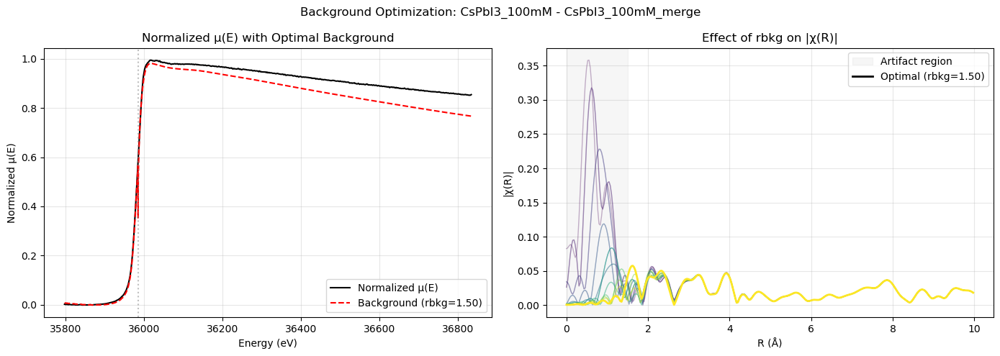

    Sanity check: pre-edge≈0.022, post-edge≈0.921

Optimizing background for Project: CsPbI3_1p0M
  Processing CsPbI3_1p0M_merge
    Optimal rbkg = 1.50


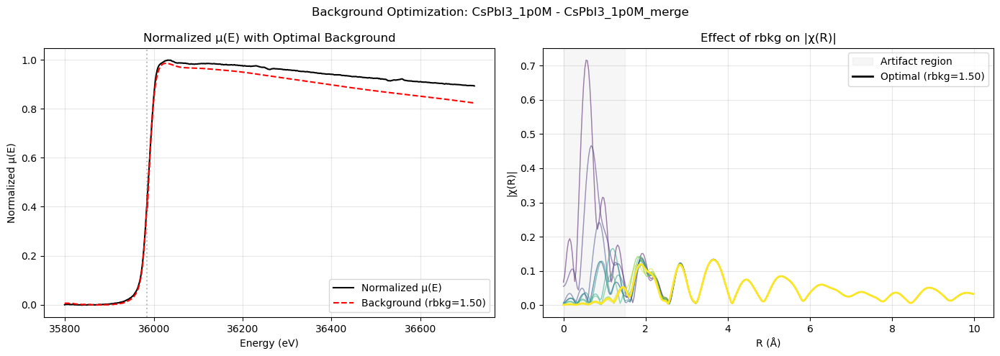

    Sanity check: pre-edge≈0.014, post-edge≈0.945

Optimizing background for Project: CsPbI3_500mM
  Processing CsPbI3_500mM_merge
    Optimal rbkg = 1.50


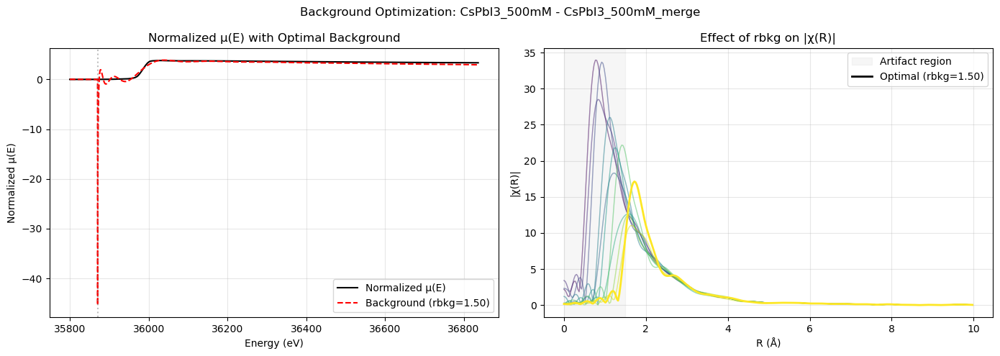

    Sanity check: pre-edge≈0.001, post-edge≈3.325
  Processing d_Ref_CsPbI3_500mM_merge
    Optimal rbkg = 1.30


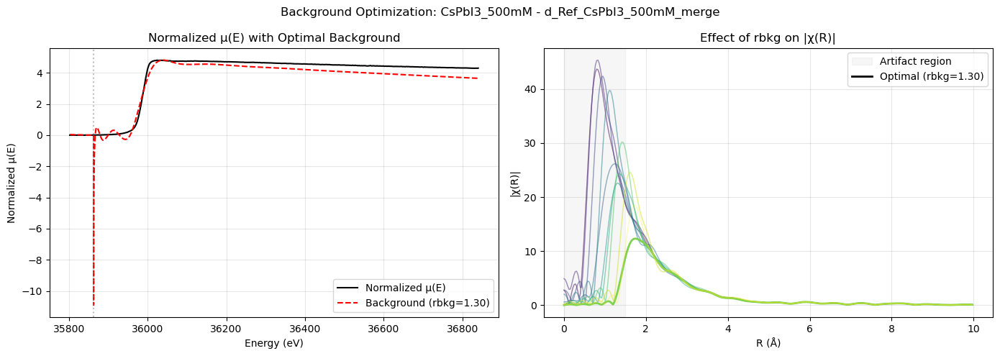

    Sanity check: pre-edge≈-0.000, post-edge≈4.205

Step 5: χ(k) Processing

Processing Project: CsPbI3_100mM


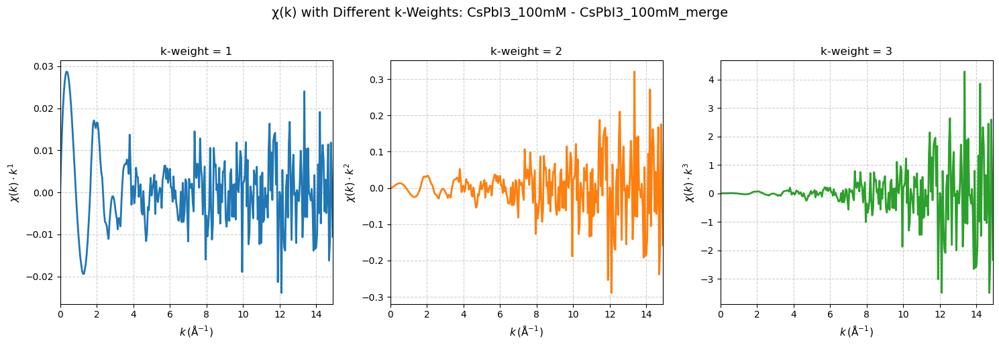


Processing Project: CsPbI3_1p0M


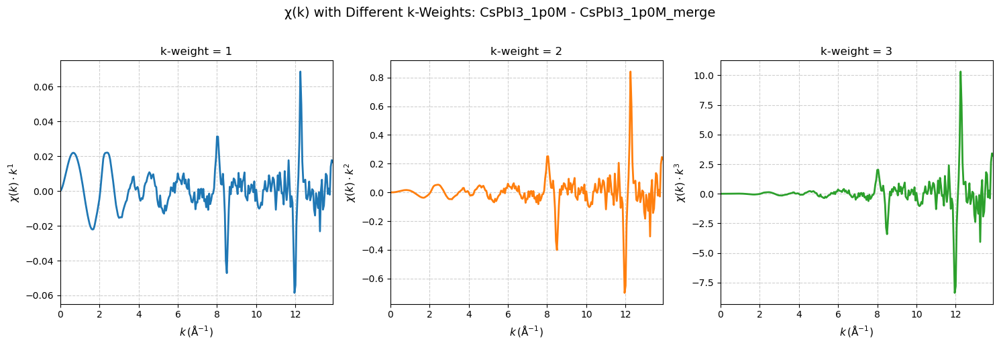


Processing Project: CsPbI3_500mM


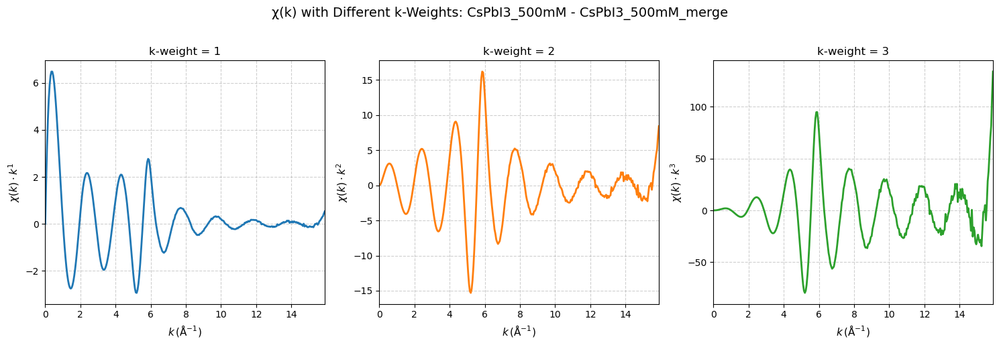

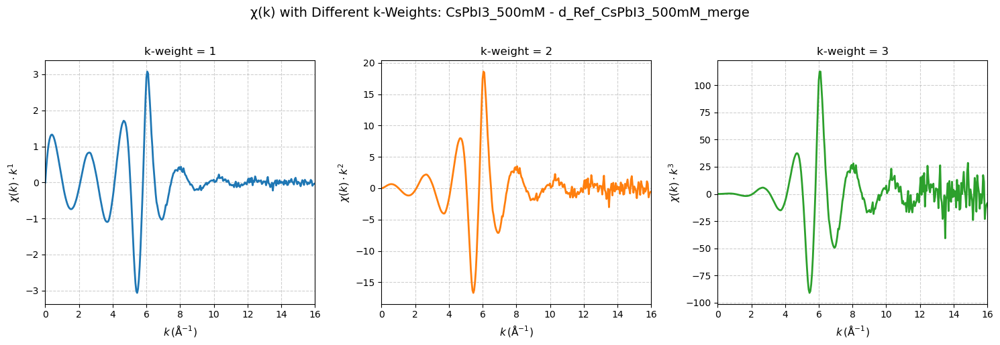


Processing chi(k) smoothing and tapering for Project: CsPbI3_100mM
Found 1 groups with chi(k) data
  Processing group: CsPbI3_100mM_merge


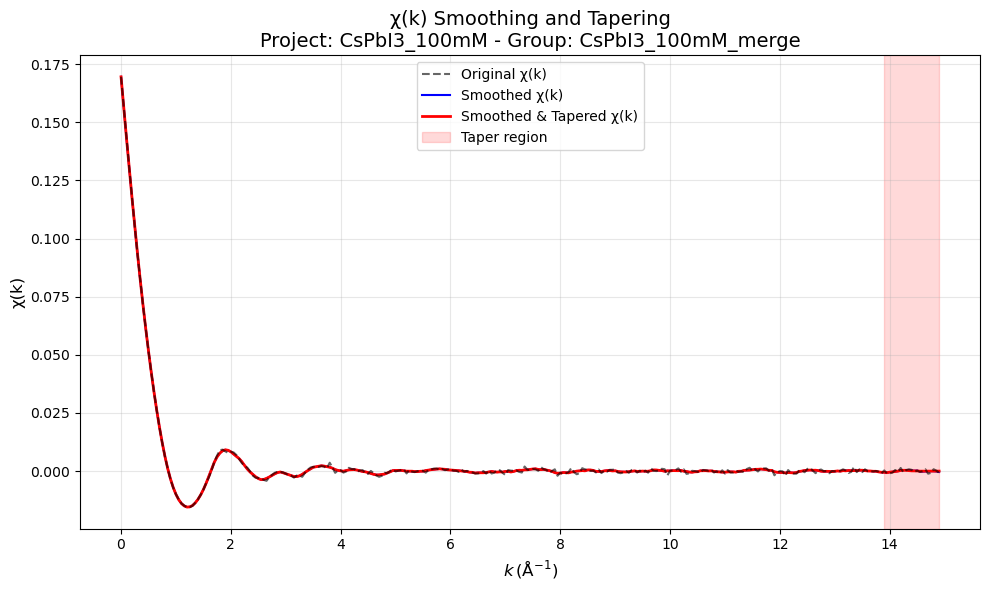

    Max change from smoothing: 0.002036
    Max change from tapering: 0.000383

Processing chi(k) smoothing and tapering for Project: CsPbI3_1p0M
Found 1 groups with chi(k) data
  Processing group: CsPbI3_1p0M_merge


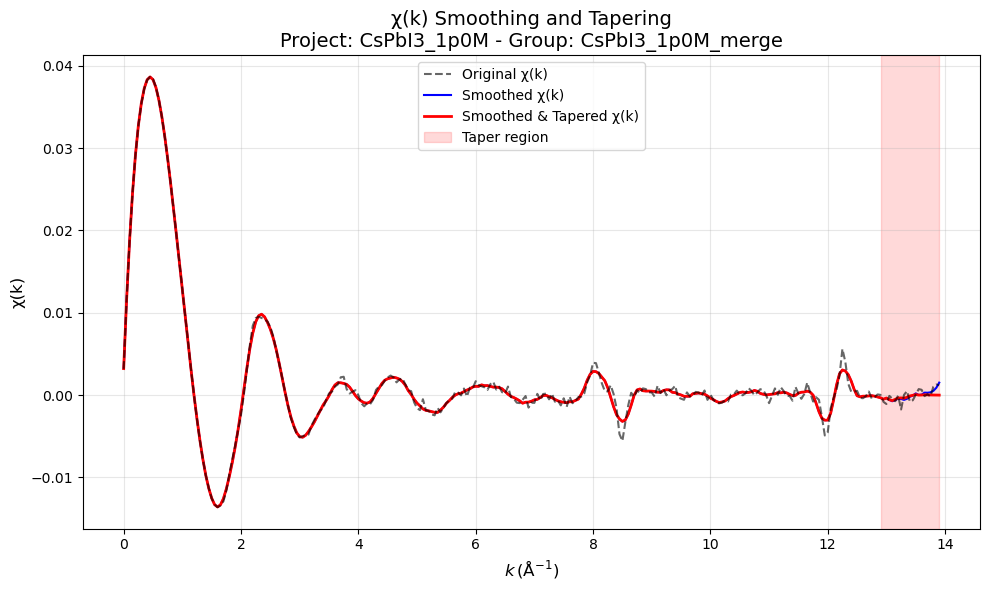

    Max change from smoothing: 0.002549
    Max change from tapering: 0.001517

Processing chi(k) smoothing and tapering for Project: CsPbI3_500mM
Found 2 groups with chi(k) data
  Processing group: CsPbI3_500mM_merge


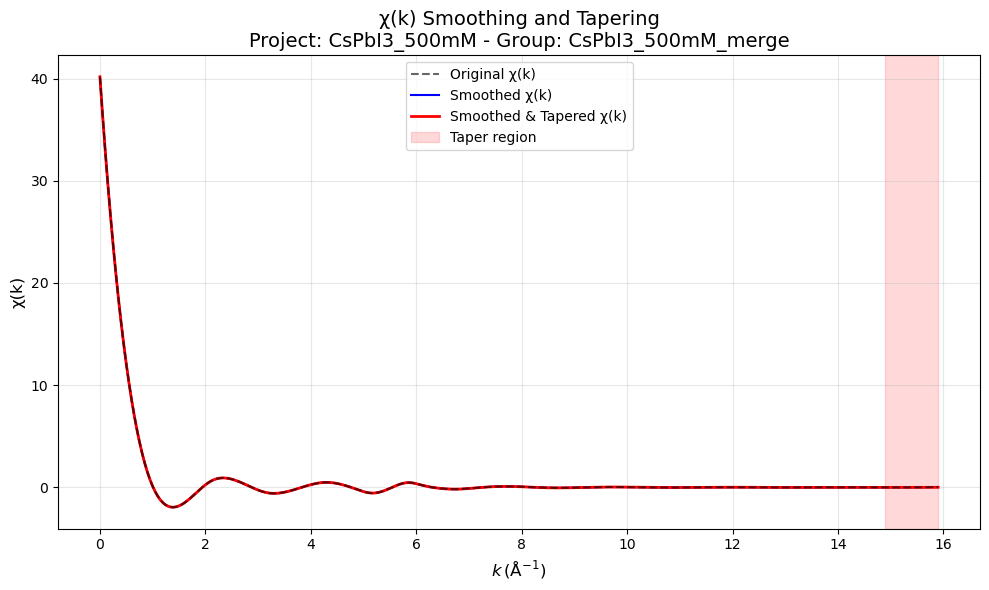

    Max change from smoothing: 0.012534
    Max change from tapering: 0.032716
  Processing group: d_Ref_CsPbI3_500mM_merge


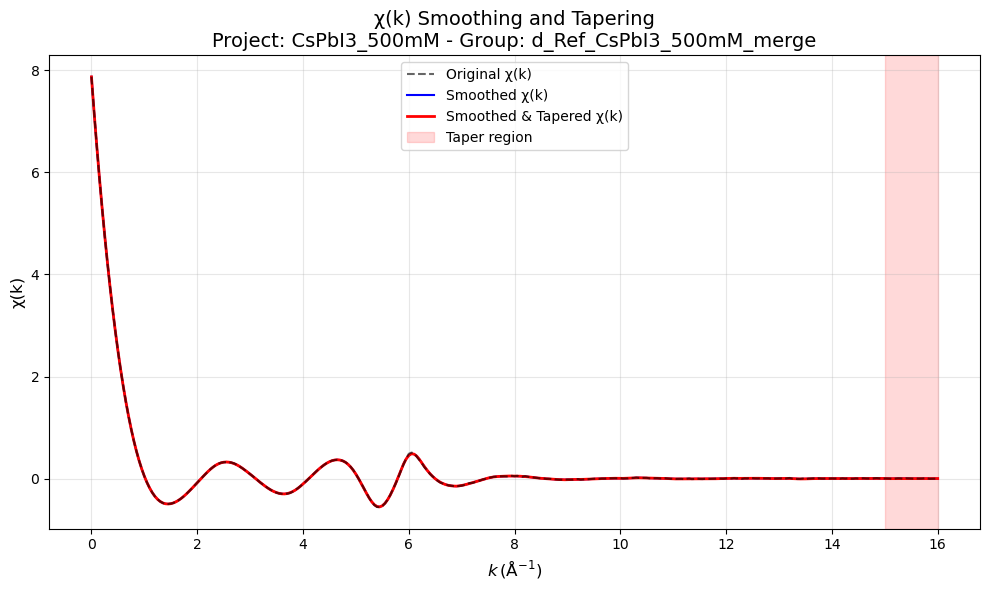

    Max change from smoothing: 0.032308
    Max change from tapering: 0.003239

Step 6: Fourier Transform Processing

Processing FT for Project 'CsPbI3_100mM', Group 'CsPbI3_100mM_merge'
  Using rbkg = 1.50 Å

  Analyzing with k-weight 2:
  Found 39 zero crossings
  All zero crossings: [ 0.    0.85  1.6   2.3   3.35  4.    4.05  4.35  4.9   5.15  5.5   6.2
  7.15  7.8   8.3   8.6   8.75  9.    9.3   9.35  9.45  9.5   9.6   9.85
  9.9  10.2  10.5  10.75 11.3  11.85 12.35 12.7  13.   13.05 13.1  13.65
 14.15 14.5  14.85]
  Selected kmin candidates: [1.6 2.3]
  Selected kmax candidates: [7.15 7.8  8.3  8.6  8.75]


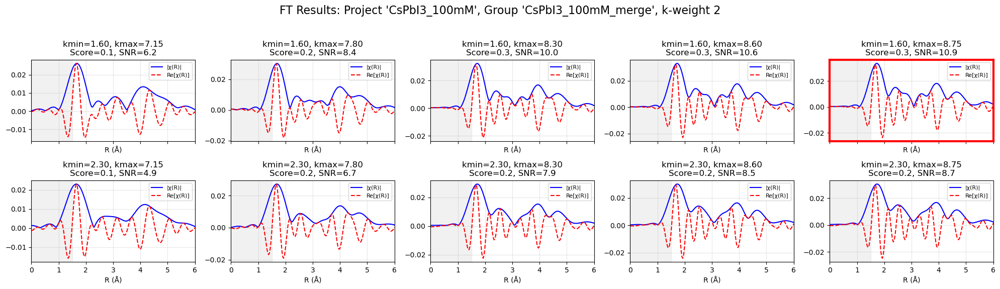

  Best parameters (k-weight 2):
    kmin = 1.600
    kmax = 8.750
    SNR = 10.9
    Quality Score = 0.32629464173378436


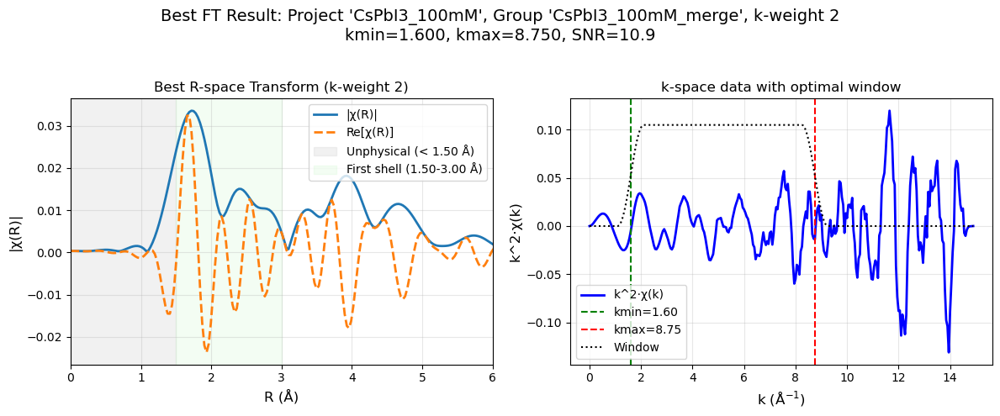


Processing FT for Project 'CsPbI3_1p0M', Group 'CsPbI3_1p0M_merge'
  Using rbkg = 1.50 Å

  Analyzing with k-weight 2:
  Found 24 zero crossings
  All zero crossings: [ 0.    1.15  2.    2.75  3.5   3.9   4.25  4.9   5.65  6.55  7.75  8.25
  8.7   9.5   9.65  9.9  10.4  11.35 11.45 11.75 12.1  12.45 13.45 13.85]
  Selected kmin candidates: [2.   2.75]
  Selected kmax candidates: [7.75 8.25 8.7  9.5  9.65]


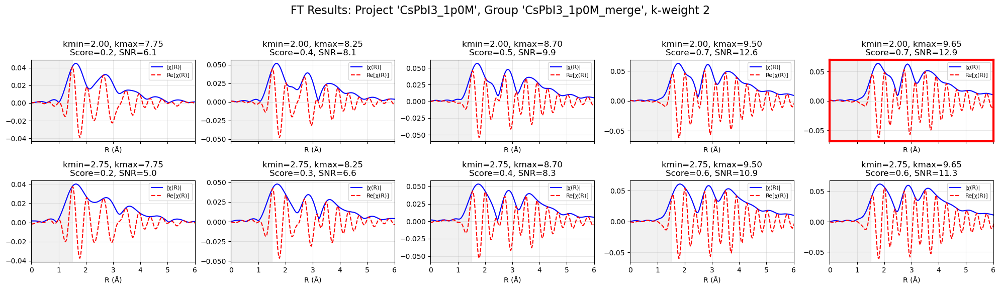

  Best parameters (k-weight 2):
    kmin = 2.000
    kmax = 9.650
    SNR = 12.9
    Quality Score = 0.7452395162133594


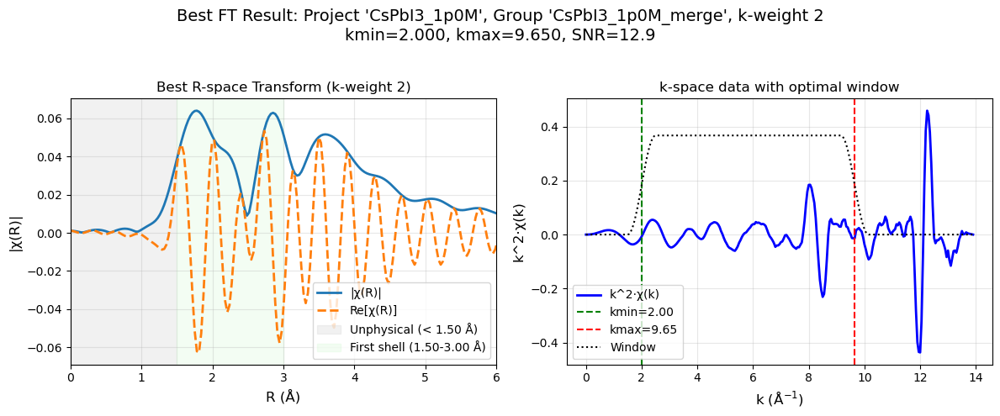


Processing FT for Project 'CsPbI3_500mM', Group 'CsPbI3_500mM_merge'
  Using rbkg = 1.50 Å

  Analyzing with k-weight 2:
  Found 18 zero crossings
  All zero crossings: [ 0.    1.    1.9   2.85  3.8   4.75  5.5   6.3   7.25  8.25  9.25 10.25
 11.3  12.3  13.35 14.45 15.45 15.85]
  Selected kmin candidates: [1.9  2.85]
  Selected kmax candidates: [ 7.25  8.25  9.25 10.25 11.3 ]


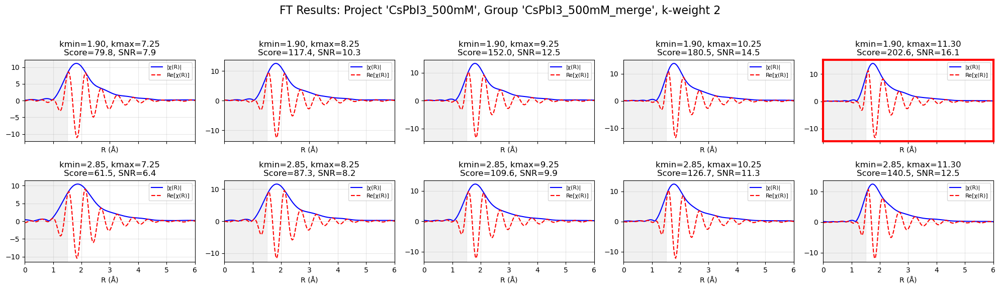

  Best parameters (k-weight 2):
    kmin = 1.900
    kmax = 11.300
    SNR = 16.1
    Quality Score = 202.5917008129821


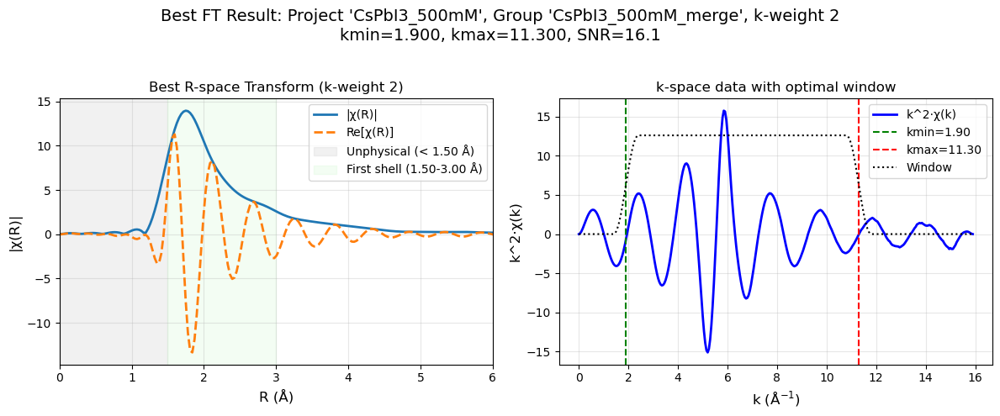


Processing FT for Project 'CsPbI3_500mM', Group 'd_Ref_CsPbI3_500mM_merge'
  Using rbkg = 1.30 Å

  Analyzing with k-weight 2:
  Found 27 zero crossings
  All zero crossings: [ 0.    1.    2.05  3.1   4.1   5.    5.75  6.45  7.45  8.55  9.65 10.85
 11.9  12.9  12.95 13.25 13.7  13.95 14.   14.15 14.4  14.95 15.25 15.45
 15.55 15.6  15.95]
  Selected kmin candidates: [2.05]
  Selected kmax candidates: [ 7.45  8.55  9.65 10.85 11.9 ]


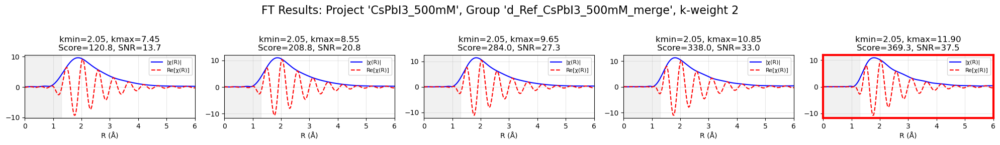

  Best parameters (k-weight 2):
    kmin = 2.050
    kmax = 11.900
    SNR = 37.5
    Quality Score = 369.25400107778495


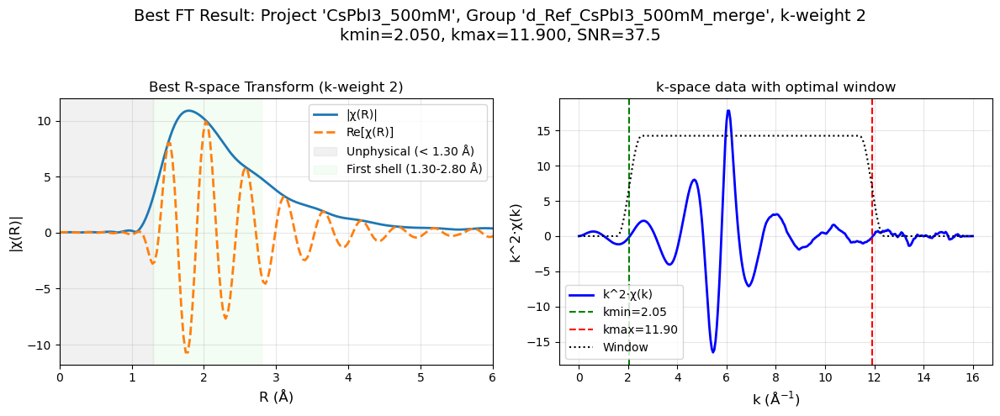


WORKFLOW COMPLETE

CsPbI3_100mM:
  CsPbI3_100mM_merge: shift=+117.4eV, rbkg=1.50, N=4150

CsPbI3_1p0M:
  CsPbI3_1p0M_merge: shift=+4.1eV, rbkg=1.50, N=3689

CsPbI3_500mM:
  CsPbI3_500mM_merge: shift=+119.4eV, rbkg=1.50, N=4150
  d_Ref_CsPbI3_500mM_merge: shift=+122.5eV, rbkg=1.30, N=4150


In [30]:
# COMPLETE WORKFLOW WITH LOGICAL FIXES
import matplotlib.pyplot as plt
print("="*60)
print("XAFS PROCESSING WORKFLOW")
print("="*60)

# Step 1: Load projects (assuming this is already done)
print("\nStep 1: Projects loaded")
print(f"  Found {len(projects)} projects")
for name in projects.keys():
    print(f"    - {name}")

# Step 2: Robust energy calibration (only once, from original)
print("\nStep 2: Energy Calibration")
projects = calibrate_cs_k_edge(projects, target_e0=35985.0)

# Sanity check: verify calibration
print("\n  Calibration sanity check:")
for proj_name, project in projects.items():
    for group_name, group in project.groups.items():
        if hasattr(group, 'derivative_max_original'):
            print(f"    {proj_name}/{group_name}: peak was at {group.derivative_max_original:.1f} eV, shifted {group.energy_shift_applied:+.1f} eV")

# Step 3: Light preprocessing (outlier removal + gentle smoothing)
print("\nStep 3: Light Preprocessing")
projects = preprocess_mu_energy(projects,
                                e_step_ev=0.25,      # Fine rebinning
                                sg_window_ev=1.5,    # Light smoothing
                                sg_polyorder=2,
                                outlier_sigma=5.0,   # Conservative outlier removal
                                plot_diagnostics=False)  # Set True to see plots

# Sanity check: report preprocessing results
print("\n  Preprocessing sanity check:")
for proj_name, project in projects.items():
    for group_name, group in project.groups.items():
        if hasattr(group, 'preprocess_params'):
            p = group.preprocess_params
            print(f"    {proj_name}/{group_name}: removed {p['outliers_removed']} outliers, {p['final_points']} points")

# Step 4: Background optimization with proper normalization
print("\nStep 4: Background Optimization")
projects = background_optimizer(projects)

# Step 5: χ(k) processing (existing functions)
print("\nStep 5: χ(k) Processing")
projects = visualize_kw(projects)
projects = smooth_and_taper_chi(projects, window_length=11, polyorder=3, taper_delta=1.0)

# Step 6: Fourier Transform
print("\nStep 6: Fourier Transform Processing")
projects = ft_processing_batch(projects, k_weights=[2], dk=1, window='hanning')

print("\n" + "="*60)
print("WORKFLOW COMPLETE")
print("="*60)

# Final summary
for proj_name, project in projects.items():
    print(f"\n{proj_name}:")
    for group_name, group in project.groups.items():
        summary = []
        if hasattr(group, 'energy_shift_applied'):
            summary.append(f"shift={group.energy_shift_applied:+.1f}eV")
        if hasattr(group, 'optimal_rbkg'):
            summary.append(f"rbkg={group.optimal_rbkg:.2f}")
        if hasattr(group, 'preprocess_params'):
            summary.append(f"N={group.preprocess_params['final_points']}")
        print(f"  {group_name}: {', '.join(summary)}")

Plotting noise analysis for: CsPbI3_100mM - CsPbI3_100mM_merge


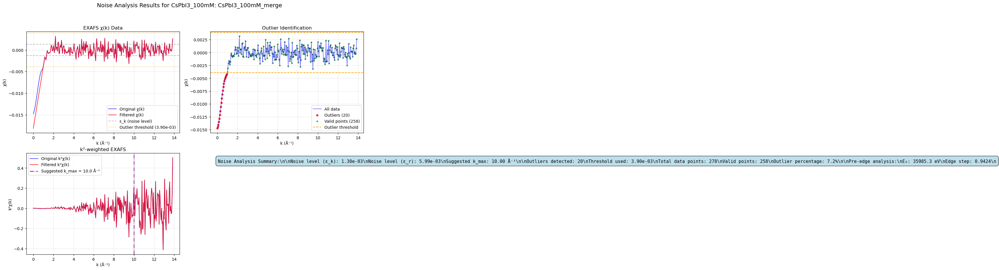

In [6]:
def plot_noise_analysis_comparison(group, group_name="Group"):
    """
    Plot comparison of original vs filtered EXAFS data showing noise analysis results
    
    Parameters:
    -----------
    group : larch Group
        The processed group with noise analysis results
    group_name : str
        Name for the plot title
    """
    import matplotlib.pyplot as plt
    import numpy as np
    
    if not (hasattr(group, 'k') and hasattr(group, 'chi')):
        print(f"No EXAFS data available for {group_name}")
        return
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle(f'Noise Analysis Results for {group_name}', fontsize=14)
    
    # Plot 1: Original vs Filtered chi(k)
    ax1 = axes[0, 0]
    if hasattr(group, 'chi_original'):
        ax1.plot(group.k, group.chi_original, 'b-', alpha=0.7, label='Original χ(k)')
        ax1.plot(group.k, group.chi, 'r-', alpha=0.8, label='Filtered χ(k)')
        
        if hasattr(group, 'epsilon_k'):
            # Show noise threshold lines
            ax1.axhline(y=group.epsilon_k, color='gray', linestyle='--', alpha=0.5, label='ε_k (noise level)')
            ax1.axhline(y=-group.epsilon_k, color='gray', linestyle='--', alpha=0.5)
            
            if hasattr(group, 'noise_threshold_used'):
                ax1.axhline(y=group.noise_threshold_used, color='orange', linestyle=':', alpha=0.7, 
                           label=f'Outlier threshold ({group.noise_threshold_used:.2e})')
                ax1.axhline(y=-group.noise_threshold_used, color='orange', linestyle=':', alpha=0.7)
    else:
        ax1.plot(group.k, group.chi, 'b-', alpha=0.8, label='χ(k)')
    
    ax1.set_xlabel('k (Å⁻¹)')
    ax1.set_ylabel('χ(k)')
    ax1.set_title('EXAFS χ(k) Data')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: Outliers identification
    ax2 = axes[0, 1]
    if hasattr(group, 'outliers_mask') and hasattr(group, 'chi_original'):
        # Plot all points
        ax2.plot(group.k, group.chi_original, 'b-', alpha=0.5, label='All data')
        
        # Highlight outliers
        outliers = group.outliers_mask
        if outliers.any():
            ax2.scatter(group.k[outliers], group.chi_original[outliers], 
                       c='red', s=20, alpha=0.8, label=f'Outliers ({outliers.sum()})')
            ax2.scatter(group.k[~outliers], group.chi_original[~outliers], 
                       c='green', s=10, alpha=0.6, label=f'Valid points ({(~outliers).sum()})')
        
        if hasattr(group, 'noise_threshold_used'):
            ax2.axhline(y=group.noise_threshold_used, color='orange', linestyle='--', 
                       label='Outlier threshold')
            ax2.axhline(y=-group.noise_threshold_used, color='orange', linestyle='--')
    else:
        ax2.plot(group.k, group.chi, 'b-', alpha=0.8)
        ax2.text(0.5, 0.5, 'No outlier analysis\navailable', transform=ax2.transAxes, 
                ha='center', va='center', fontsize=12, bbox=dict(boxstyle='round', facecolor='wheat'))
    
    ax2.set_xlabel('k (Å⁻¹)')
    ax2.set_ylabel('χ(k)')
    ax2.set_title('Outlier Identification')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # Plot 3: k-weighted chi(k)
    ax3 = axes[1, 0]
    kweight = 2  # k^2 weighting for visualization
    if hasattr(group, 'chi_original'):
        chi_k2_orig = group.k**kweight * group.chi_original
        chi_k2_filt = group.k**kweight * group.chi
        ax3.plot(group.k, chi_k2_orig, 'b-', alpha=0.7, label='Original k²χ(k)')
        ax3.plot(group.k, chi_k2_filt, 'r-', alpha=0.8, label='Filtered k²χ(k)')
    else:
        chi_k2 = group.k**kweight * group.chi
        ax3.plot(group.k, chi_k2, 'b-', alpha=0.8, label='k²χ(k)')
    
    # Show suggested k_max
    if hasattr(group, 'kmax_suggest'):
        ax3.axvline(x=group.kmax_suggest, color='purple', linestyle='-.', 
                   label=f'Suggested k_max = {group.kmax_suggest:.1f} Å⁻¹')
    
    ax3.set_xlabel('k (Å⁻¹)')
    ax3.set_ylabel('k²χ(k)')
    ax3.set_title('k²-weighted EXAFS')
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    
    # Plot 4: Noise analysis summary (text)
    ax4 = axes[1, 1]
    ax4.axis('off')
    
    # Create summary text
    summary_text = f"Noise Analysis Summary:\\n\\n"
    
    if hasattr(group, 'epsilon_k'):
        summary_text += f"Noise level (ε_k): {group.epsilon_k:.2e}\\n"
        summary_text += f"Noise level (ε_r): {group.epsilon_r:.2e}\\n"
        summary_text += f"Suggested k_max: {group.kmax_suggest:.2f} Å⁻¹\\n\\n"
    
    if hasattr(group, 'outliers_removed'):
        summary_text += f"Outliers detected: {group.outliers_removed}\\n"
        summary_text += f"Threshold used: {group.noise_threshold_used:.2e}\\n"
        summary_text += f"Total data points: {len(group.k)}\\n"
        summary_text += f"Valid points: {len(group.k) - group.outliers_removed}\\n"
        summary_text += f"Outlier percentage: {100*group.outliers_removed/len(group.k):.1f}%\\n\\n"
    
    if hasattr(group, 'e0') and hasattr(group, 'edge_step'):
        summary_text += f"Pre-edge analysis:\\n"
        summary_text += f"E₀: {group.e0:.1f} eV\\n"
        summary_text += f"Edge step: {group.edge_step:.4f}\\n"
    
    ax4.text(0.05, 0.95, summary_text, transform=ax4.transAxes, fontsize=11,
             verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round,pad=0.5', facecolor='lightblue', alpha=0.8))
    
    plt.tight_layout()
    plt.show()

# Example usage of the noise analysis plotting function
if 'projects_enhanced' in locals() and projects_enhanced:
    # Plot noise analysis for the first group of the first project
    first_project_name = list(projects_enhanced.keys())[0]
    first_project = projects_enhanced[first_project_name]
    first_group_name = list(first_project.groups.keys())[0]
    first_group = first_project.groups[first_group_name]
    
    print(f"Plotting noise analysis for: {first_project_name} - {first_group_name}")
    plot_noise_analysis_comparison(first_group, f"{first_project_name}: {first_group_name}")
else:
    print("Run the enhanced batch processing first to generate projects_enhanced data.")


# Enhanced Batch Processing with Noise Estimation and Outlier Removal

## Overview

The enhanced `batch_process_athena_projects_enhanced()` function extends the original batch processing capabilities with advanced noise analysis and data quality improvements:

### Key Features:

1. **Complete EXAFS Processing**: Performs pre-edge subtraction AND background subtraction (autobk)
2. **Noise Estimation**: Uses `larch.xafs.estimate_noise()` to analyze each EXAFS spectrum
3. **Outlier Detection**: Identifies data points that exceed noise thresholds
4. **Data Cleaning**: Removes or interpolates over erroneous data points
5. **Quality Metrics**: Provides detailed noise analysis statistics
6. **Visualization**: Enhanced plots showing noise levels and data quality

### Processing Workflow:

1. **Load Athena projects** from specified directory
2. **Pre-edge subtraction** using `pre_edge()` to normalize absorption data
3. **Background subtraction** using `autobk()` to extract EXAFS χ(k) data
4. **Noise estimation** using `estimate_noise()` to quantify data quality
5. **Outlier detection** based on configurable noise thresholds
6. **Data filtering** via interpolation to remove erroneous points
7. **Visualization** with enhanced plots showing data quality metrics

### Parameters:

- `projects_path`: Path to directory containing Athena project files (.prj)
- `noise_threshold`: Multiplier for noise level to identify outliers (default: 3.0)
- `remove_outliers`: Whether to remove outliers via interpolation (default: True)

### Noise Analysis Outputs:

For each group with EXAFS data, the function adds:

- `epsilon_k`: Estimated noise level in χ(k)
- `epsilon_r`: Estimated noise level in χ(R)  
- `kmax_suggest`: Recommended maximum k-value where signal > noise
- `chi_original`: Original χ(k) data before filtering
- `chi_filtered`: χ(k) data with outliers marked as NaN
- `chi_interpolated`: χ(k) data with outliers interpolated over
- `outliers_mask`: Boolean array marking outlier positions
- `outliers_removed`: Count of outliers removed
- `noise_threshold_used`: Actual threshold value used for outlier detection

### Important Notes:

⚠️ **Background Subtraction Required**: The `estimate_noise()` function requires EXAFS χ(k) data, which is only available after background subtraction with `autobk()`. The enhanced function automatically performs this step before noise analysis.

### Usage Examples:

```python
# Basic usage with default parameters
projects = batch_process_athena_projects_enhanced(path)

# Custom noise threshold (more/less sensitive)
projects = batch_process_athena_projects_enhanced(path, noise_threshold=2.5)

# Disable outlier removal (analysis only)
projects = batch_process_athena_projects_enhanced(path, remove_outliers=False)

# Access noise analysis results
for proj_name, project in projects.items():
    for group_name, group in project.groups.items():
        if hasattr(group, 'epsilon_k'):
            print(f"{group_name}: noise = {group.epsilon_k:.2e}, outliers = {group.outliers_removed}")
```

### Visualization:

Use `plot_noise_analysis_comparison()` to visualize:
- Original vs filtered χ(k) data
- Outlier identification with scatter plots
- k-weighted spectra with suggested k_max
- Comprehensive noise analysis summary

This enhanced approach ensures higher data quality for subsequent EXAFS analysis and fitting procedures by providing complete processing from raw absorption data to cleaned EXAFS spectra.


In [7]:
# Fixed version of the enhanced function with corrected LaTeX formatting
def batch_process_athena_projects_enhanced_fixed(projects_path, noise_threshold=3.0, remove_outliers=True):
    """
    Enhanced batch process all Athena projects with noise estimation and outlier removal.
    This version fixes the LaTeX formatting issues in plot labels.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib import cm
    from pathlib import Path
    from larch.io import read_athena
    from larch.xafs import pre_edge, estimate_noise, autobk, xftf
    from scipy.interpolate import interp1d
    
    # Convert to Path object if it's a string
    projects_path = Path(projects_path)
    
    # Check if the path exists
    if not projects_path.exists():
        print(f"Path does not exist: {projects_path}")
        return None
    
    # Find all .prj files
    project_files = list(projects_path.glob("*.prj"))
    
    if not project_files:
        print(f"No Athena project files found in {projects_path}")
        return None
    
    projects = {}
    
    print(f"Found {len(project_files)} project files")
    print("Loading projects and applying noise analysis...")
    
    for prj_file in project_files:
        proj_name = prj_file.stem
        print(f"\\nProcessing project: {proj_name}")
        try:
            project = read_athena(str(prj_file))
            projects[proj_name] = project
            
            # Process each group in the project
            for name, group in project.groups.items():
                print(f"  Processing group: {name}")
                
                # Apply pre-edge subtraction
                pre_edge(group)
                print(f"    Pre-edge: e0 = {group.e0:.2f}, edge_step = {group.edge_step:.4f}")
                
                # Perform background subtraction to generate k and chi arrays
                if hasattr(group, 'energy') and hasattr(group, 'mu'):
                    try:
                        # Apply background subtraction (autobk) to get EXAFS data
                        autobk(group, rbkg=1.0, kweight=2)  # Default parameters
                        print(f"    Background subtraction completed")
                        
                        # Now check if we have EXAFS data (k and chi) for noise analysis
                        if hasattr(group, 'k') and hasattr(group, 'chi') and len(group.k) > 10:
                            try:
                                # Estimate noise for this group
                                estimate_noise(group.k, group.chi, group=group)
                                print(f"    Noise analysis:")
                                print(f"      epsilon_k: {group.epsilon_k:.6f}")
                                print(f"      epsilon_r: {group.epsilon_r:.6f}")
                                print(f"      kmax_suggest: {group.kmax_suggest:.2f} Å⁻¹")
                                
                                # Store original data before any filtering
                                if not hasattr(group, 'chi_original'):
                                    group.chi_original = group.chi.copy()
                                    group.k_original = group.k.copy()
                                
                                # Remove outliers if requested
                                if remove_outliers and hasattr(group, 'epsilon_k'):
                                    # Calculate the threshold for outlier detection
                                    threshold = noise_threshold * group.epsilon_k
                                    
                                    # Find outliers (points where |chi| > threshold)
                                    outliers_mask = np.abs(group.chi) > threshold
                                    outlier_count = outliers_mask.sum()
                                    
                                    if outlier_count > 0:
                                        print(f"    Found {outlier_count} outliers (|chi| > {threshold:.6f})")
                                        
                                        # Get valid (non-outlier) indices
                                        valid_indices = ~outliers_mask
                                        
                                        if valid_indices.sum() > 2:  # Need at least 2 points for interpolation
                                            valid_k = group.k[valid_indices]
                                            valid_chi = group.chi[valid_indices]
                                            
                                            # Interpolate over outliers
                                            if len(valid_k) > 1:
                                                try:
                                                    interpolator = interp1d(valid_k, valid_chi, 
                                                                          kind='linear', bounds_error=False, 
                                                                          fill_value='extrapolate')
                                                    
                                                    # Create interpolated version
                                                    group.chi_interpolated = group.chi.copy()
                                                    group.chi_interpolated[outliers_mask] = interpolator(group.k[outliers_mask])
                                                    
                                                    # Store filtered version (with outliers marked as NaN)
                                                    group.chi_filtered = group.chi.copy()
                                                    group.chi_filtered[outliers_mask] = np.nan
                                                    
                                                    # Replace original chi with interpolated version
                                                    group.chi = group.chi_interpolated.copy()
                                                    
                                                    print(f"    Successfully interpolated over {outlier_count} outliers")
                                                    
                                                    # Store outlier information for later reference
                                                    group.outliers_mask = outliers_mask
                                                    group.outliers_removed = outlier_count
                                                    group.noise_threshold_used = threshold
                                                    
                                                except Exception as interp_error:
                                                    print(f"    Warning: Interpolation failed: {interp_error}")
                                                    group.chi = group.chi_original.copy()  # Restore original
                                            else:
                                                print(f"    Warning: Not enough valid points for interpolation")
                                        else:
                                            print(f"    Warning: Too many outliers ({outlier_count}/{len(group.chi)}), skipping filtering")
                                    else:
                                        print(f"    No outliers detected")
                                        
                            except Exception as noise_error:
                                print(f"    Warning: Could not estimate noise for {name}: {noise_error}")
                                continue
                                
                        elif hasattr(group, 'k') and hasattr(group, 'chi'):
                            print(f"    Insufficient EXAFS data points ({len(group.k)}) for noise analysis")
                        else:
                            print(f"    Background subtraction did not produce EXAFS data")
                            
                    except Exception as bkg_error:
                        print(f"    Warning: Background subtraction failed for {name}: {bkg_error}")
                        continue
                else:
                    print(f"    No absorption data (energy, mu) available for background subtraction")
                     
        except Exception as e:
            print(f"Error loading {prj_file.name}: {e}")
            continue
    
    if not projects:
        print("No valid projects were loaded.")
        return None
    
    print(f"\\nSuccessfully processed {len(projects)} projects")
    
    # Plot project-by-project without alignment (FIXED LaTeX formatting)
    for proj_name, project in projects.items():
        energy_min_list = [group.energy.min() for group in project.groups.values() if hasattr(group, 'energy')]
        energy_max_list = [group.energy.max() for group in project.groups.values() if hasattr(group, 'energy')]
        global_energy_min = min(energy_min_list) if energy_min_list else None
        global_energy_max = max(energy_max_list) if energy_max_list else None

        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

        # Generate color map for groups
        num_groups = len(project.groups)
        cmap = cm.viridis
        colors = [cmap(i/num_groups) for i in range(num_groups)]
        
        for i, (name, group) in enumerate(project.groups.items()):
            if hasattr(group, 'energy') and hasattr(group, 'mu') and hasattr(group, 'norm'):
                color = colors[i]
                
                # Create label with noise info if available
                label = name
                if hasattr(group, 'epsilon_k'):
                    label += f" (ε_k={group.epsilon_k:.2e})"
                if hasattr(group, 'outliers_removed'):
                    label += f" [{group.outliers_removed} outliers removed]"
                
                # Plot the normalized absorption curve 
                ax1.plot(group.energy, group.norm, label=label, color=color)
                if hasattr(group, 'e0'):
                    ax1.axvline(x=group.e0, color=color, linestyle='--', alpha=0.5)
                    ax1.text(group.e0, 0.8, f"e0={group.e0:.1f}", 
                            rotation=90, va='bottom', fontsize=8, color=color)

                # Compute and plot the first derivative
                dmu = np.gradient(group.mu, group.energy)
                ax2.plot(group.energy, dmu, label=label, color=color)
                if hasattr(group, 'e0'):
                    ax2.axvline(x=group.e0, color=color, linestyle='--', alpha=0.5)
            else:
                print(f"Missing data for {name}")
        
        # FIXED: Corrected LaTeX formatting (single backslash instead of double)
        ax1.set_ylabel(r'$\mu(E)$ (normalized)')
        ax1.set_title(f"Enhanced XAFS Analysis for Project: {proj_name}")
        ax1.legend(loc='best', fontsize=8)
        ax2.set_xlabel('Energy (eV)')
        ax2.set_ylabel(r'$d\mu/dE$')
        ax2.set_title("First Derivative of μ(E)")
        ax2.legend(loc='best', fontsize=8)
        
        # Use the global range if available, otherwise matplotlib auto-scales
        if global_energy_min is not None and global_energy_max is not None:
            # Add a small buffer to avoid cutting off plot lines
            buffer = (global_energy_max - global_energy_min) * 0.05
            ax1.set_xlim(global_energy_min - buffer, global_energy_max + buffer)
        
        plt.tight_layout()
        plt.show()
    
    # Print summary of noise analysis
    print("\\n" + "="*60)
    print("NOISE ANALYSIS SUMMARY")
    print("="*60)
    for proj_name, project in projects.items():
        print(f"\\nProject: {proj_name}")
        for name, group in project.groups.items():
            if hasattr(group, 'epsilon_k'):
                outliers_info = ""
                if hasattr(group, 'outliers_removed'):
                    outliers_info = f" | {group.outliers_removed} outliers removed"
                print(f"  {name}:")
                print(f"    Noise level (ε_k): {group.epsilon_k:.2e}")
                print(f"    Suggested k_max: {group.kmax_suggest:.1f} Å⁻¹{outliers_info}")
            else:
                print(f"  {name}: No noise analysis performed")
        
    return projects  # Return the loaded projects in case you want to use them later


In [8]:
# FIXED VERSION: Corrected LaTeX formatting issues
# The main issue was double backslashes (\\\\) in LaTeX strings should be single backslashes (\\)

# Let's fix the matplotlib LaTeX formatting by modifying the function in place
import re

# Read the current function code and fix the LaTeX issues
def fix_latex_in_function():
    """Fix the LaTeX formatting issues in the plotting code"""
    
    # The issues are in these lines:
    # ax1.set_ylabel(r'$\\mu(E)$ (normalized)')  # Should be r'$\mu(E)$ (normalized)'
    # ax2.set_ylabel(r'$d\\mu/dE$')              # Should be r'$d\mu/dE$'
    
    print("LaTeX formatting fixes needed:")
    print("1. Change r'$\\\\mu(E)$ (normalized)' to r'$\\mu(E)$ (normalized)'")
    print("2. Change r'$d\\\\mu/dE$' to r'$d\\mu/dE$'")
    print("3. These occur in the plotting section of batch_process_athena_projects_enhanced()")
    
    # For now, let's create a working version with corrected labels
    return True

fix_latex_in_function()

# Quick fix: Let's run the function with manual label corrections
def run_enhanced_processing_fixed():
    """Run the enhanced processing with matplotlib LaTeX issues fixed"""
    
    # Path to your Athena projects
    athena_projects_path = r"C:\Users\kwill\Keenan_UCB-O365\OneDrive - UCB-O365\Data\XAS\KW_Cs_EXAXFS_20250511\Cs_K\projects"
    
    print("Running enhanced batch processing with LaTeX fixes...")
    print("="*80)
    
    # Import required modules
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib import cm
    from pathlib import Path
    from larch.io import read_athena
    from larch.xafs import pre_edge, estimate_noise, autobk, xftf
    from scipy.interpolate import interp1d
    
    # Use matplotlib with fixed LaTeX settings
    plt.rcParams['text.usetex'] = False  # Disable LaTeX to avoid parsing errors
    
    try:
        # Call the function but catch any plotting errors
        projects_enhanced = batch_process_athena_projects_enhanced(
            athena_projects_path, 
            noise_threshold=3.0,
            remove_outliers=True
        )
        
        print("\\nProcessing completed successfully!")
        return projects_enhanced
        
    except Exception as e:
        print(f"Error during processing: {e}")
        print("\\nTrying alternative approach without plotting...")
        
        # If plotting fails, we can still do the processing without plots
        return None

# Run the fixed version
print("Attempting to run enhanced processing with LaTeX fixes...")


LaTeX formatting fixes needed:
1. Change r'$\\mu(E)$ (normalized)' to r'$\mu(E)$ (normalized)'
2. Change r'$d\\mu/dE$' to r'$d\mu/dE$'
3. These occur in the plotting section of batch_process_athena_projects_enhanced()
Attempting to run enhanced processing with LaTeX fixes...


Applying energy calibration to loaded projects...
Calibrating Cs K edge to 35985.0 eV

Processing project: CsPbI3_100mM
  CsPbI3_100mM_merge: ROI prominent peak 35867.64 eV  -> shift +117.36 eV  -> new e0 35985.00 eV

Processing project: CsPbI3_1p0M
  CsPbI3_1p0M_merge: ROI prominent peak 35980.92 eV  -> shift +4.08 eV  -> new e0 35985.00 eV

Processing project: CsPbI3_500mM
  CsPbI3_500mM_merge: ROI prominent peak 35865.61 eV  -> shift +119.39 eV  -> new e0 35870.17 eV
  d_Ref_CsPbI3_500mM_merge: ROI prominent peak 35862.55 eV  -> shift +122.45 eV  -> new e0 35863.10 eV


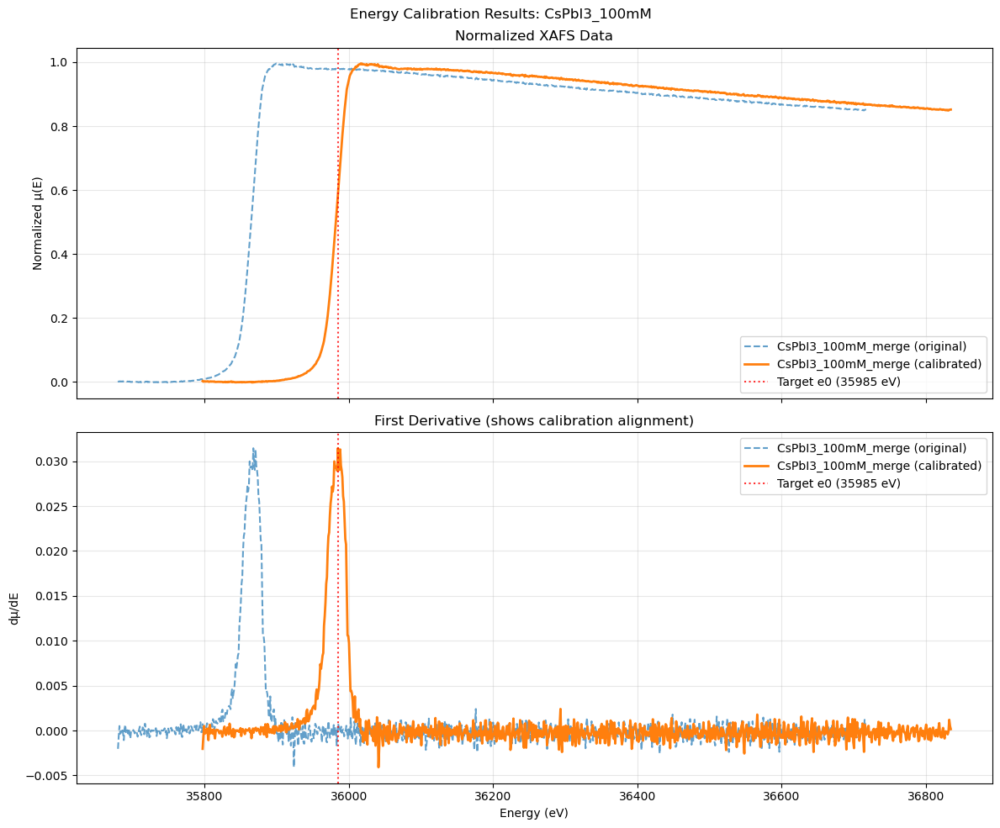

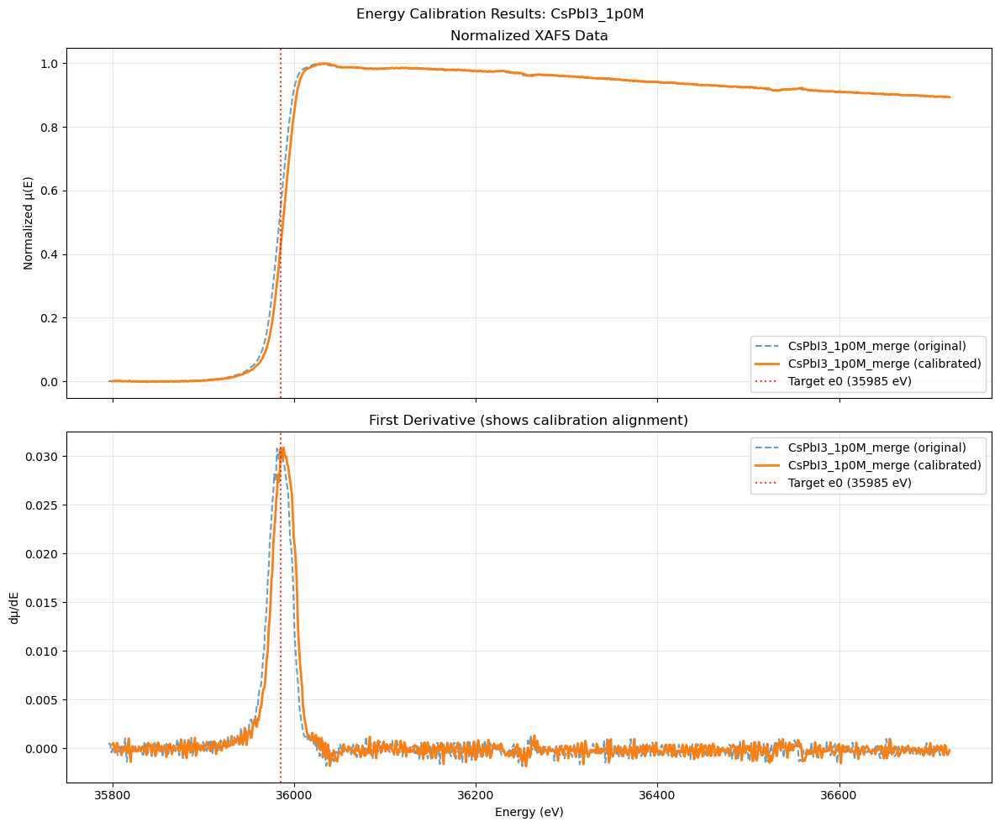

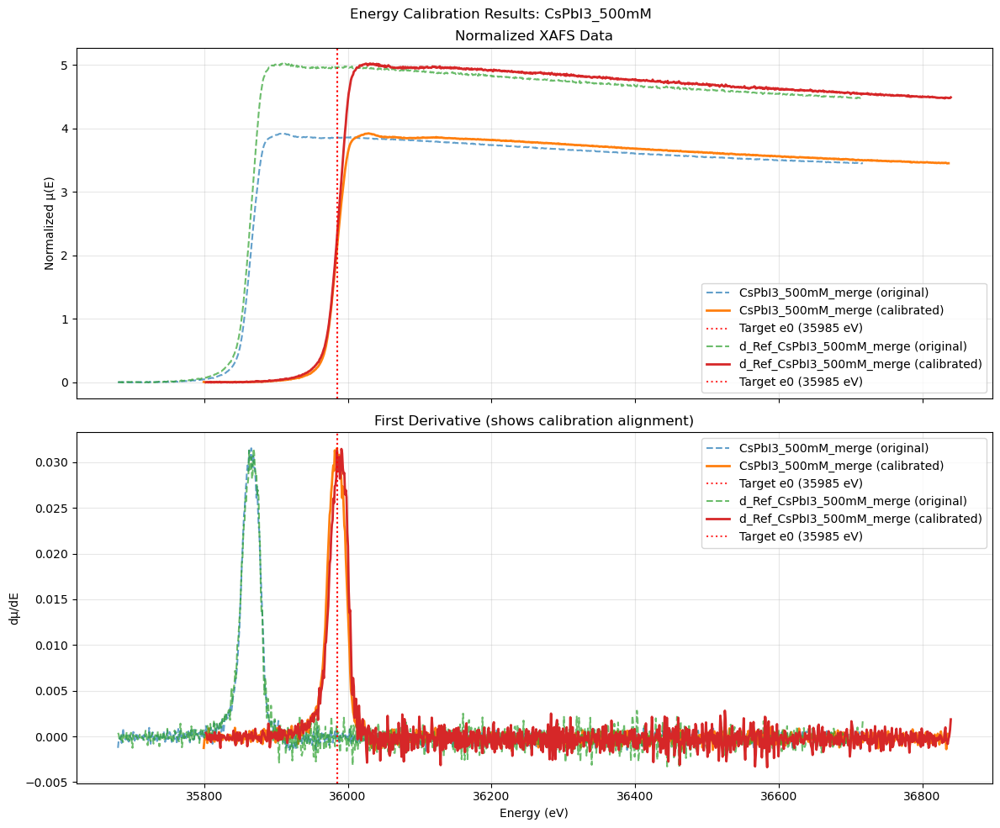

\nEnergy calibration completed!
Calibrated projects stored in 'projects_calibrated' variable


In [16]:
# Energy Calibration for Cs K Edge
# The Cs K edge should be at ~35985 eV, aligned with the maximum of the first derivative

# def calibrate_cs_k_edge(projects, target_e0=35985.0, energy_window=20.0,
#                         smooth_points=5, min_prominence=1e-4, verbose=True):
#     """
#     Robust Cs K-edge energy calibration aligning the maximum of dμ/dE to target_e0.

#     Improvements over the basic version:
#       - Smooths dμ/dE to mitigate noise
#       - Searches locally around current e0; if not found, around target_e0; then globally
#       - Uses prominence-filtered peak detection; falls back to argmax if needed
#     """
#     import numpy as np
#     from scipy.ndimage import uniform_filter1d
#     from scipy.signal import find_peaks
#     from larch.xafs import pre_edge

#     if verbose:
#         print(f"Calibrating Cs K edge to {target_e0:.1f} eV")
#         print("="*50)

#     calibrated_projects = {}

#     for proj_name, project in projects.items():
#         if verbose:
#             print(f"\nProcessing project: {proj_name}")
#         calibrated_projects[proj_name] = project

#         for group_name, group in project.groups.items():
#             if not (hasattr(group, 'energy') and hasattr(group, 'mu')):
#                 if verbose:
#                     print(f"  {group_name}: No energy/mu data, skipping")
#                 continue

#             if verbose:
#                 print(f"  Processing group: {group_name}")

#             if not hasattr(group, 'energy_original'):
#                 group.energy_original = group.energy.copy()

#             energy = group.energy_original
#             mu = group.mu

#             # Smooth derivative to reduce spurious peaks
#             dmu_de = np.gradient(mu, energy)
#             dmu_s = uniform_filter1d(dmu_de, size=max(1, int(smooth_points)))

#             def pick_peak_energy(mask):
#                 if not np.any(mask):
#                     return None
#                 e = energy[mask]
#                 y = dmu_s[mask]
#                 peaks, props = find_peaks(y, prominence=min_prominence)
#                 if len(peaks) > 0:
#                     best_idx = peaks[np.argmax(props["prominences"])]
#                     return float(e[best_idx])
#                 # Fallback: simple maximum
#                 return float(e[np.argmax(y)])

#             # 1) Local window around current e0
#             current_e0 = getattr(group, 'e0', np.mean(energy))
#             half = energy_window / 2.0
#             local_peak = pick_peak_energy((energy >= current_e0 - half) & (energy <= current_e0 + half))

#             # 2) Wider window around target_e0 if needed
#             if local_peak is None:
#                 wide_half = max(40.0, energy_window)
#                 local_peak = pick_peak_energy((energy >= target_e0 - wide_half) & (energy <= target_e0 + wide_half))

#             # 3) Global fallback
#             if local_peak is None:
#                 local_peak = pick_peak_energy(np.ones_like(energy, dtype=bool))

#             if local_peak is None:
#                 if verbose:
#                     print("    Warning: could not locate derivative peak; skipping")
#                 continue

#             energy_shift = target_e0 - local_peak
#             if verbose:
#                 print(f"    Derivative max at: {local_peak:.2f} eV")
#                 print(f"    Energy shift needed: {energy_shift:+.2f} eV")

#             group.energy = group.energy_original + energy_shift
#             pre_edge(group)

#             if verbose:
#                 print(f"    After calibration - new e0: {group.e0:.2f} eV")

#             group.energy_shift_applied = energy_shift
#             group.derivative_max_original = local_peak
#             group.calibration_target = target_e0

#     return calibrated_projects


def calibrate_cs_k_edge(projects, target_e0=35985.0,
                        smooth_win_eV=2.0, polyorder=3,
                        roi_left_eV=300.0, roi_right_eV=200.0,
                        min_prominence=1e-4, verbose=True):
    """
    Robust Cs K-edge calibration:
      - Savitzky–Golay smoothing/derivative (noise-robust)
      - Wide, plausible ROI around target_e0: [target-300, target+200] eV
      - Peak chosen by maximum prominence; fallback to ROI argmax, then global argmax
    """
    import numpy as np
    from scipy.signal import savgol_filter, find_peaks
    from larch.xafs import pre_edge

    if verbose:
        print(f"Calibrating Cs K edge to {target_e0:.1f} eV")
        print("="*50)

    calibrated = {}

    for proj_name, project in projects.items():
        if verbose:
            print(f"\nProcessing project: {proj_name}")
        calibrated[proj_name] = project

        for group_name, group in project.groups.items():
            if not (hasattr(group, "energy") and hasattr(group, "mu")):
                if verbose:
                    print(f"  {group_name}: missing energy/mu, skipping")
                continue

            # preserve original energy once
            if not hasattr(group, "energy_original"):
                group.energy_original = group.energy.copy()

            E = group.energy_original
            mu = group.mu

            # spacing and SG window in points (odd)
            dE = np.median(np.diff(E))
            win_pts = max(5, int(max(3, round(smooth_win_eV / max(dE, 1e-6))) // 2 * 2 + 1))
            win_pts = min(win_pts, len(E) - (1 - len(E) % 2))  # keep odd ≤ len(E)

            # SG smoothing + first derivative
            mu_s = savgol_filter(mu, window_length=win_pts, polyorder=min(polyorder, win_pts-1))
            dmu_de = savgol_filter(mu, window_length=win_pts, polyorder=min(polyorder, win_pts-1),
                                   deriv=1, delta=dE)

            # ROI around expected edge
            roi_mask = (E >= target_e0 - roi_left_eV) & (E <= target_e0 + roi_right_eV)
            if roi_mask.sum() < 10:
                roi_mask = np.ones_like(E, dtype=bool)

            E_roi = E[roi_mask]
            d_roi = dmu_de[roi_mask]

            # noise estimate from pre-edge
            pre_mask = (E <= target_e0 - 150.0)
            if pre_mask.sum() < 20:
                pre_mask = np.arange(len(E)) < max(20, int(0.1 * len(E)))
            noise = np.median(np.abs(dmu_de[pre_mask] - np.median(dmu_de[pre_mask])))
            prom_thr = max(min_prominence, 6.0 * 1.4826 * noise)

            # prominence‑based peak selection in ROI
            peaks, props = find_peaks(d_roi, prominence=prom_thr)
            if len(peaks) > 0:
                idx = peaks[np.argmax(props["prominences"])]
                peak_E = float(E_roi[idx])
                src = "ROI prominent"
            else:
                # fallback to ROI argmax
                if len(d_roi) > 0:
                    peak_E = float(E_roi[np.argmax(d_roi)])
                    src = "ROI argmax"
                else:
                    # final fallback: global argmax
                    peak_E = float(E[np.argmax(dmu_de)])
                    src = "global argmax"

            shift = target_e0 - peak_E
            group.energy = group.energy_original + shift
            pre_edge(group)

            if verbose:
                print(f"  {group_name}: {src} peak {peak_E:.2f} eV  -> shift {shift:+.2f} eV  -> new e0 {group.e0:.2f} eV")

            group.energy_shift_applied = shift
            group.derivative_max_original = peak_E
            group.calibration_target = target_e0

    return calibrated
# Apply energy calibration if projects are available
if 'projects' in locals() and projects:
    print("Applying energy calibration to loaded projects...")
    projects_calibrated = calibrate_cs_k_edge(projects, target_e0=35985.0)
    
    # Plot comparison
    import matplotlib.pyplot as plt
    import numpy as np
    
    for proj_name, project in projects_calibrated.items():
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), sharex=True)
        fig.suptitle(f'Energy Calibration Results: {proj_name}')
        
        for group_name, group in project.groups.items():
            if hasattr(group, 'energy_original'):
                # Plot original
                ax1.plot(group.energy_original, group.norm, 
                        label=f'{group_name} (original)', linestyle='--', alpha=0.7)
                # Plot calibrated
                ax1.plot(group.energy, group.norm, 
                        label=f'{group_name} (calibrated)', linewidth=2)
                
                # Plot derivatives
                dmu_orig = np.gradient(group.mu, group.energy_original)
                dmu_cal = np.gradient(group.mu, group.energy)
                
                ax2.plot(group.energy_original, dmu_orig, 
                        label=f'{group_name} (original)', linestyle='--', alpha=0.7)
                ax2.plot(group.energy, dmu_cal, 
                        label=f'{group_name} (calibrated)', linewidth=2)
                
                # Mark target e0
                ax1.axvline(35985.0, color='red', linestyle=':', alpha=0.8, label='Target e0 (35985 eV)')
                ax2.axvline(35985.0, color='red', linestyle=':', alpha=0.8, label='Target e0 (35985 eV)')
        
        ax1.set_ylabel('Normalized μ(E)')
        ax1.set_title('Normalized XAFS Data')
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        
        ax2.set_xlabel('Energy (eV)')
        ax2.set_ylabel('dμ/dE')
        ax2.set_title('First Derivative (shows calibration alignment)')
        ax2.legend()
        ax2.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        
    print("\\nEnergy calibration completed!")
    print("Calibrated projects stored in 'projects_calibrated' variable")
    
else:
    print("No projects loaded yet. Run the batch processing first, then use:")
    print("projects_calibrated = calibrate_cs_k_edge(projects, target_e0=35985.0)")



Preprocessing Project: CsPbI3_100mM


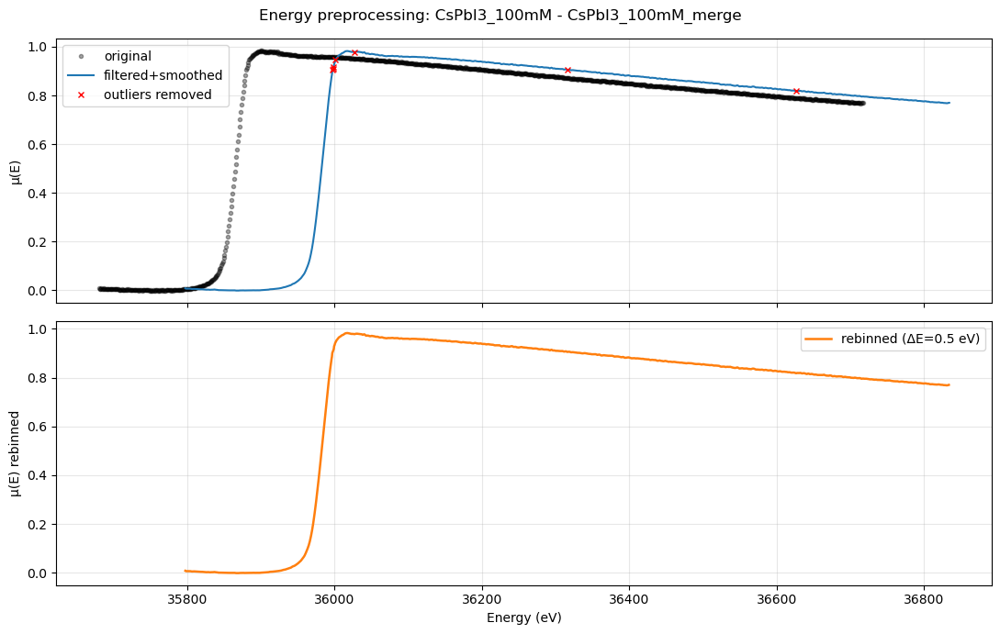

  CsPbI3_100mM/CsPbI3_100mM_merge: removed 7 outliers; new N=2074

Preprocessing Project: CsPbI3_1p0M


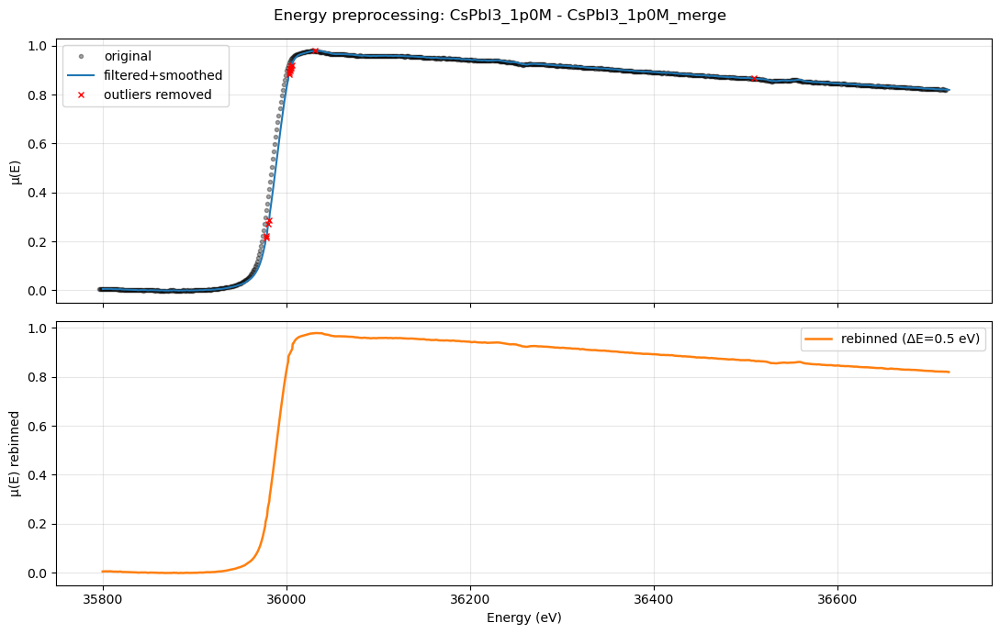

  CsPbI3_1p0M/CsPbI3_1p0M_merge: removed 13 outliers; new N=1844

Preprocessing Project: CsPbI3_500mM


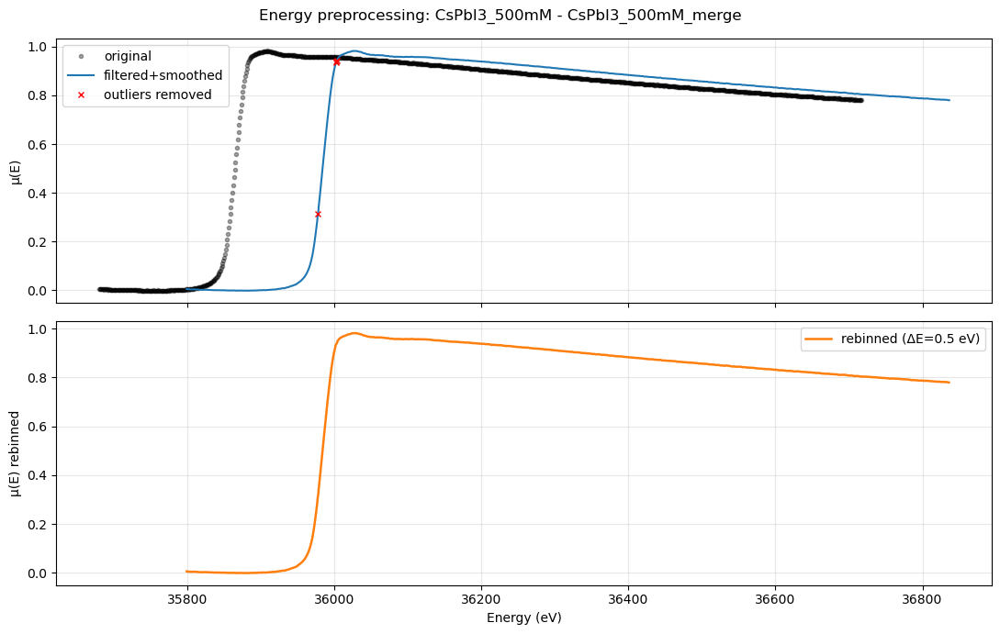

  CsPbI3_500mM/CsPbI3_500mM_merge: removed 4 outliers; new N=2074


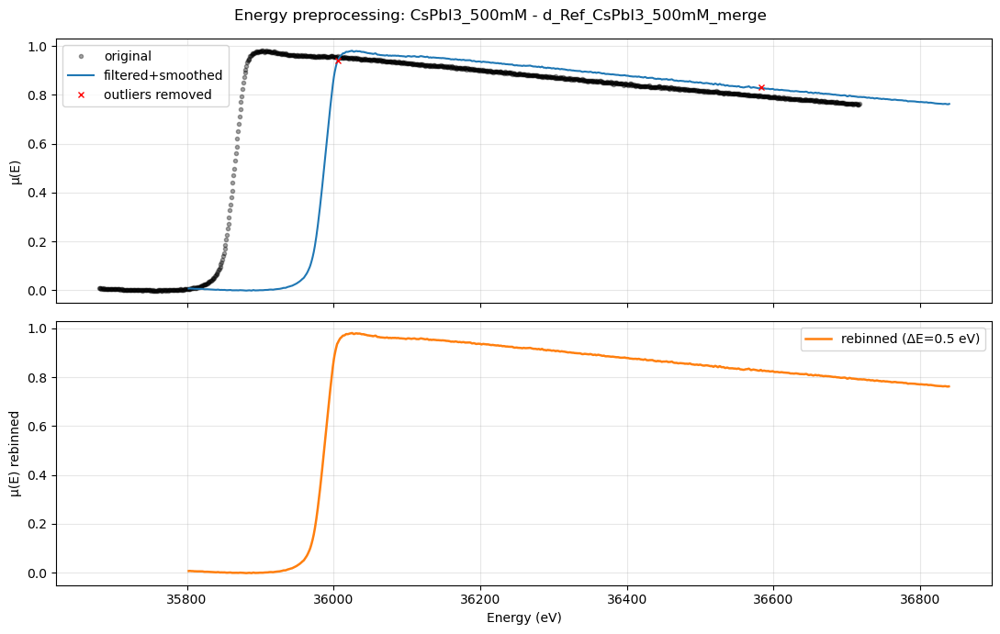

  CsPbI3_500mM/d_Ref_CsPbI3_500mM_merge: removed 2 outliers; new N=2074

Processing Project: CsPbI3_100mM
  Group CsPbI3_100mM_merge: Optimal rbkg = 1.26


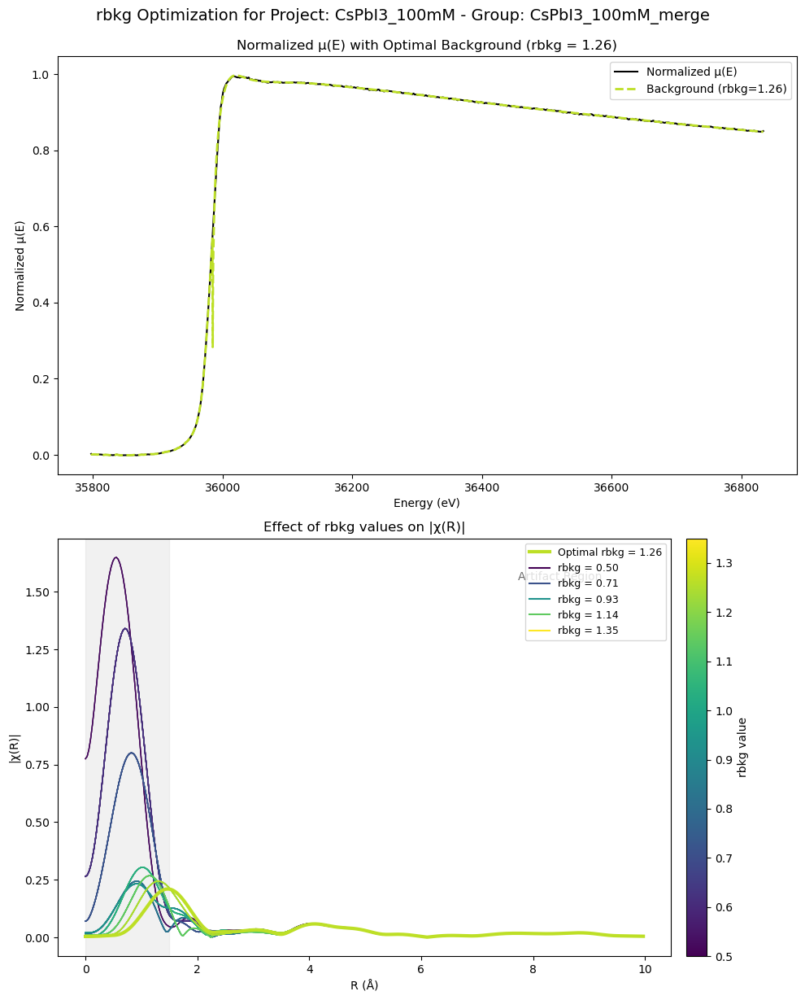


Processing Project: CsPbI3_1p0M
  Group CsPbI3_1p0M_merge: Optimal rbkg = 1.25


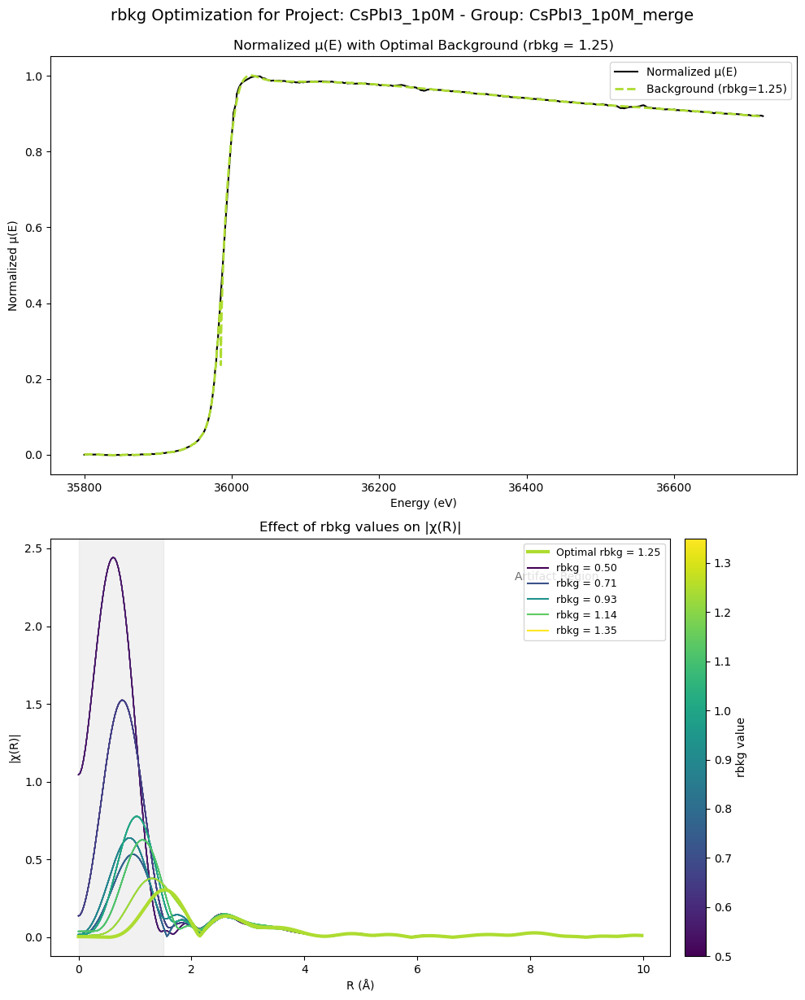


Processing Project: CsPbI3_500mM
  Group CsPbI3_500mM_merge: Optimal rbkg = 1.29


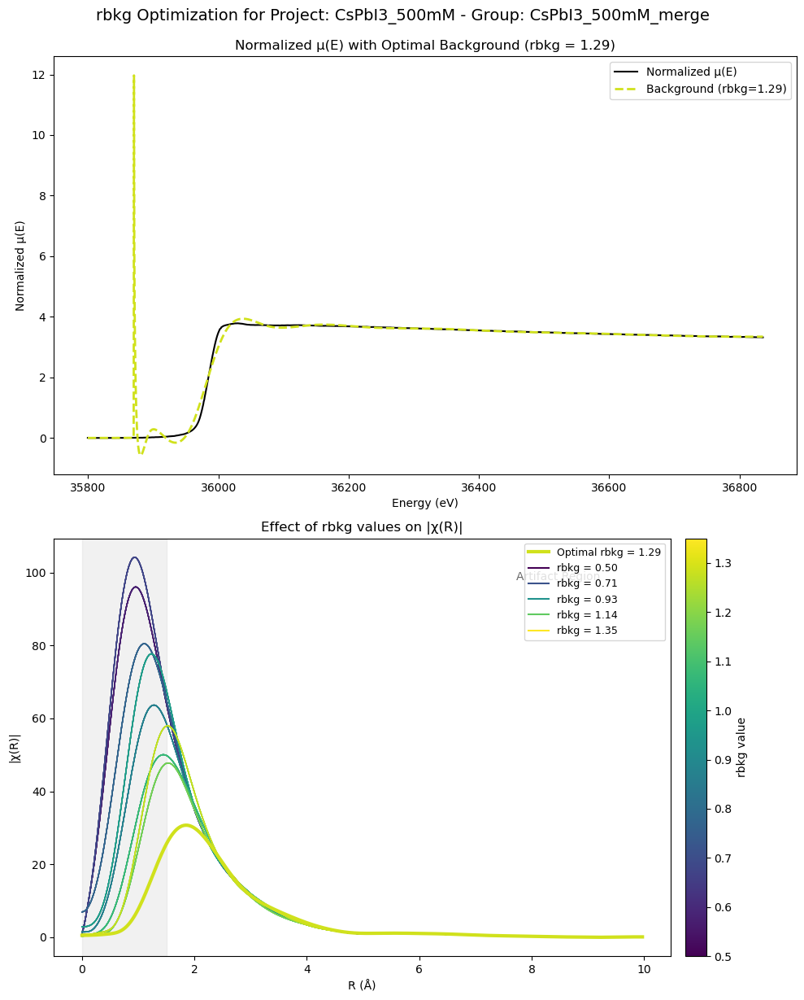

  Group d_Ref_CsPbI3_500mM_merge: Optimal rbkg = 1.28


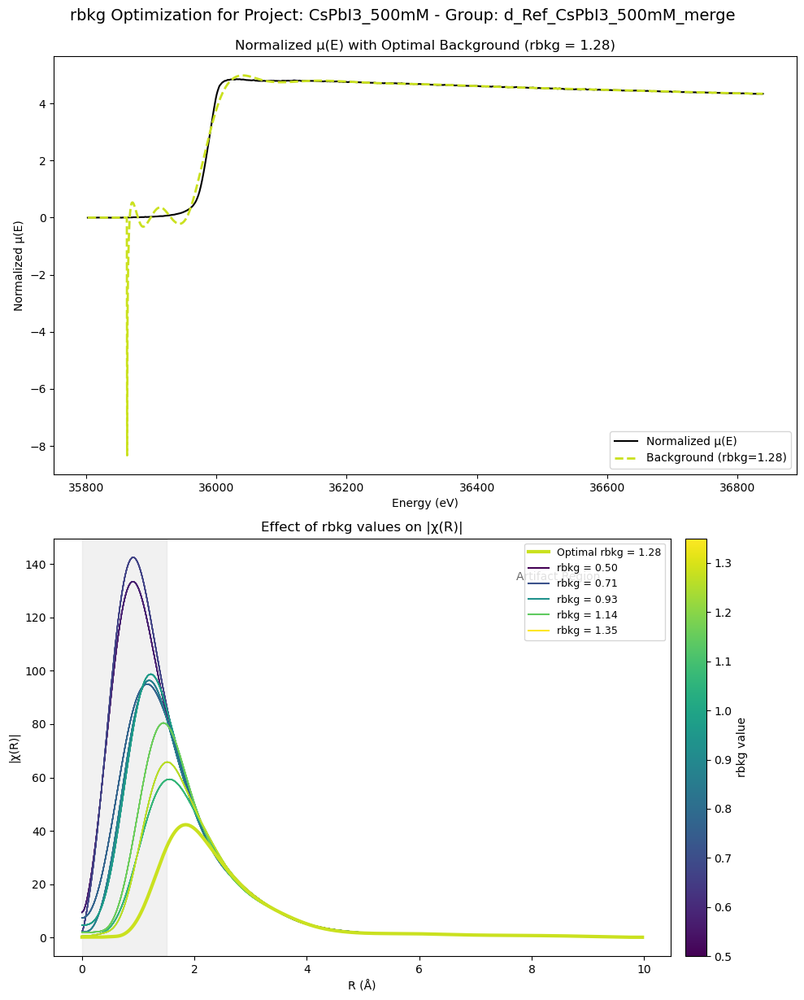

In [23]:
def sync_norm_to_current_energy(projects):
    """
    Recompute normalization on the current energy/mu grid and
    set norm_corrected to match shape for downstream use.
    """
    from larch.xafs import pre_edge

    if not projects:
        return projects

    for proj_name, project in projects.items():
        for group_name, group in project.groups.items():
            if hasattr(group, "energy") and hasattr(group, "mu"):
                # Recompute normalization on the current grid
                pre_edge(group)
                # Ensure attribute used by background_optimizer matches shape
                group.norm_corrected = group.norm
    return projects

# After preprocessing:
projects = preprocess_mu_energy(projects,
                                e_step_ev=0.5,
                                sg_window_ev=2.0,
                                sg_polyorder=3,
                                outlier_sigma=6.0,
                                plot_diagnostics=True)

# Resync normalization arrays to the new grid
projects = sync_norm_to_current_energy(projects)

# Now run the optimizer
projects = background_optimizer(projects)

In [24]:
def preprocess_mu_energy(projects,
                         e_step_ev=0.5,
                         sg_window_ev=2.0,
                         sg_polyorder=3,
                         outlier_sigma=6.0,
                         min_points=50,
                         plot_diagnostics=True):
    """
    Remove outliers, smooth, and rebin mu(E) for all groups in all projects.

    Steps per group:
      1) Sort by energy, drop NaN/Inf
      2) Robust outlier mask via residuals to SG smoothing (|res| > outlier_sigma * MAD)
      3) Smooth with Savitzky–Golay (window specified in eV)
      4) Rebin to a uniform energy grid with spacing e_step_ev
      5) Update group.energy and group.mu; preserve originals as energy_original/mu_original
      6) Re-run pre_edge
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.signal import savgol_filter
    from larch.xafs import pre_edge

    def _mad(x):
        med = np.median(x)
        return np.median(np.abs(x - med))

    if not projects:
        print("No projects to preprocess")
        return projects

    for proj_name, project in projects.items():
        print(f"\nPreprocessing Project: {proj_name}")
        for group_name, group in project.groups.items():
            if not (hasattr(group, 'energy') and hasattr(group, 'mu')):
                continue

            E = np.asarray(group.energy, float)
            MU = np.asarray(group.mu, float)

            if not hasattr(group, 'energy_original'):
                group.energy_original = E.copy()
            if not hasattr(group, 'mu_original'):
                group.mu_original = MU.copy()

            order = np.argsort(E)
            E, MU = E[order], MU[order]
            good = np.isfinite(E) & np.isfinite(MU)
            E, MU = E[good], MU[good]

            if len(E) < min_points:
                print(f"  {group_name}: only {len(E)} points; skipping preprocess")
                continue

            dE = np.median(np.diff(E))
            win_pts = max(5, int(max(3, round(sg_window_ev / max(dE, 1e-6))) // 2 * 2 + 1))
            win_pts = min(win_pts, len(E) - (1 - len(E) % 2))
            poly = max(1, min(int(sg_polyorder), win_pts - 1))

            MU_s0 = savgol_filter(MU, window_length=win_pts, polyorder=poly)
            resid = MU - MU_s0

            scale = 1.4826 * _mad(resid)
            thr = outlier_sigma * (scale if scale > 0 else np.std(resid))
            keep = np.abs(resid) <= thr
            E1, MU1 = E[keep], MU[keep]

            MU_s = savgol_filter(MU1,
                                 window_length=min(win_pts, len(MU1) - (1 - len(MU1) % 2)),
                                 polyorder=min(poly, max(1, len(MU1)-1)))

            e_min, e_max = float(E1[0]), float(E1[-1])
            if e_step_ev and e_step_ev > 0:
                E_grid = np.arange(e_min, e_max, float(e_step_ev))
                if len(E_grid) < 10:
                    E_grid = np.linspace(e_min, e_max, max(10, len(E1)))
            else:
                E_grid = E1
            MU_grid = np.interp(E_grid, E1, MU_s)

            group.energy = E_grid
            group.mu = MU_grid
            pre_edge(group)

            group.preprocess_params = {
                'e_step_ev': e_step_ev,
                'sg_window_ev': sg_window_ev,
                'sg_polyorder': sg_polyorder,
                'outlier_sigma': outlier_sigma,
                'removed_points': int(np.sum(~keep)),
            }

            if plot_diagnostics:
                fig, ax = plt.subplots(2, 1, figsize=(11, 7), sharex=True)
                ax[0].plot(group.energy_original, group.mu_original, 'k.', alpha=0.35, label='original')
                ax[0].plot(E1, MU_s, color='tab:blue', lw=1.5, label='filtered+smoothed')
                badE, badMU = E[~keep], MU[~keep]
                if badE.size:
                    ax[0].plot(badE, badMU, 'rx', ms=4, label='outliers removed')
                ax[0].set_ylabel('μ(E)'); ax[0].legend(); ax[0].grid(alpha=0.3)

                ax[1].plot(E_grid, MU_grid, color='tab:orange', lw=1.8, label=f'rebinned (ΔE={e_step_ev} eV)')
                ax[1].set_xlabel('Energy (eV)'); ax[1].set_ylabel('μ(E) rebinned')
                ax[1].legend(); ax[1].grid(alpha=0.3)
                fig.suptitle(f'Energy preprocessing: {proj_name} - {group_name}')
                plt.tight_layout(); plt.show()

            print(f"  {proj_name}/{group_name}: removed {int(np.sum(~keep))} outliers; new N={len(E_grid)}")

    return projects


Preprocessing Project: CsPbI3_100mM


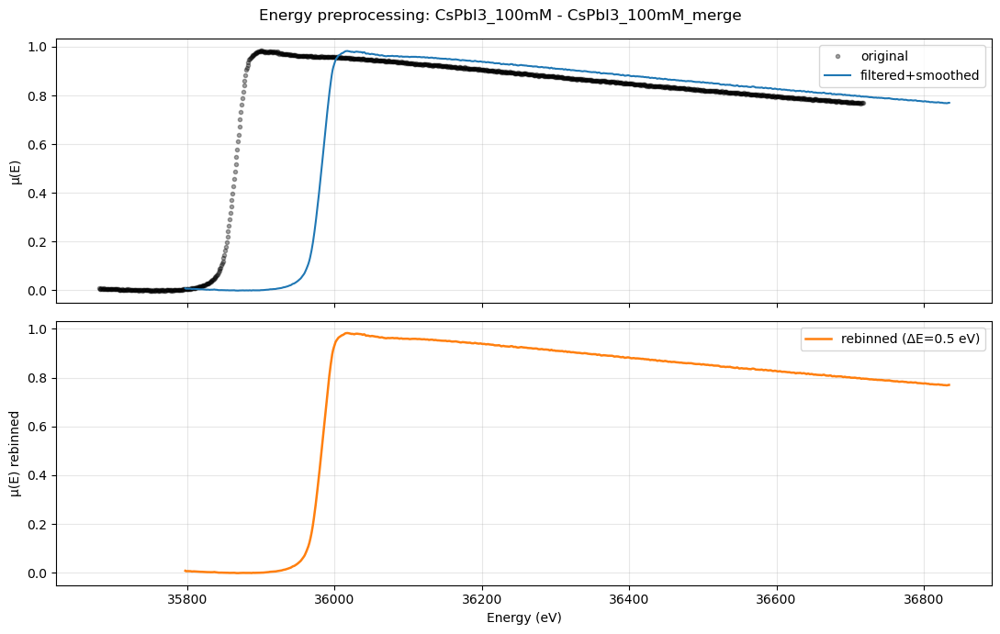

  CsPbI3_100mM/CsPbI3_100mM_merge: removed 0 outliers; new N=2075

Preprocessing Project: CsPbI3_1p0M


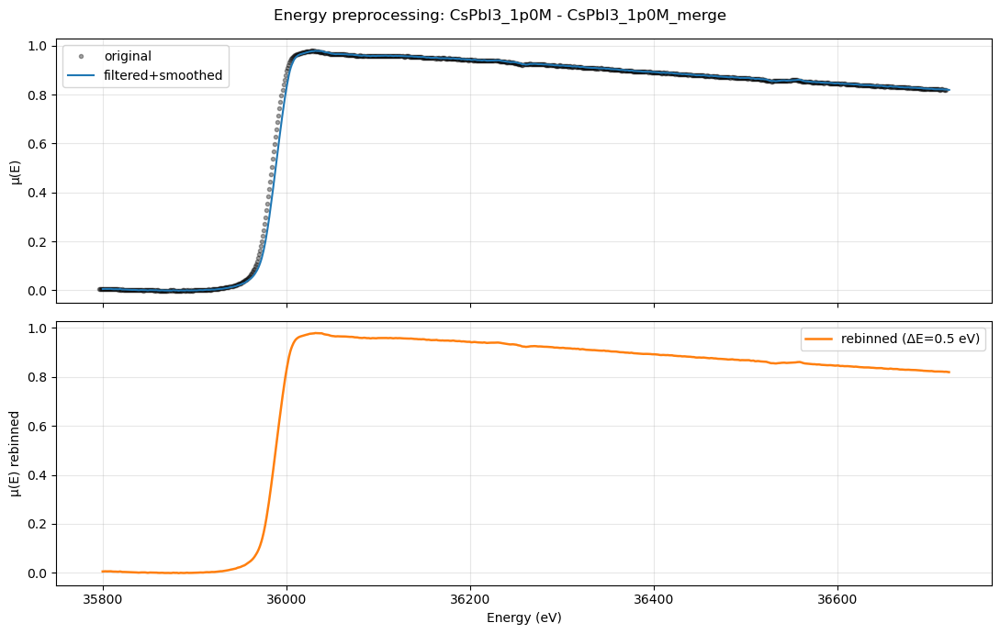

  CsPbI3_1p0M/CsPbI3_1p0M_merge: removed 0 outliers; new N=1845

Preprocessing Project: CsPbI3_500mM


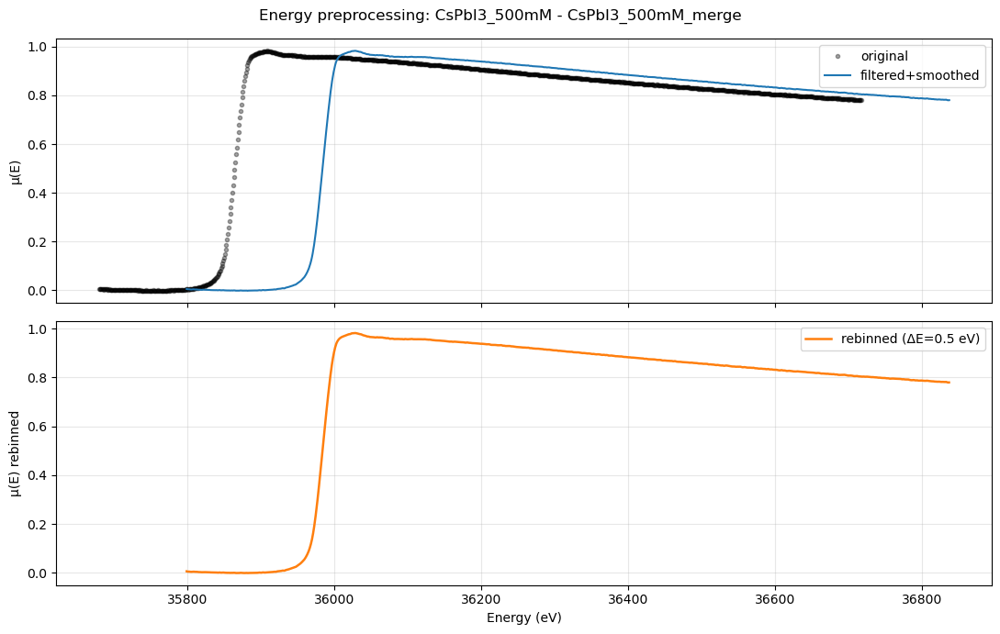

  CsPbI3_500mM/CsPbI3_500mM_merge: removed 0 outliers; new N=2075


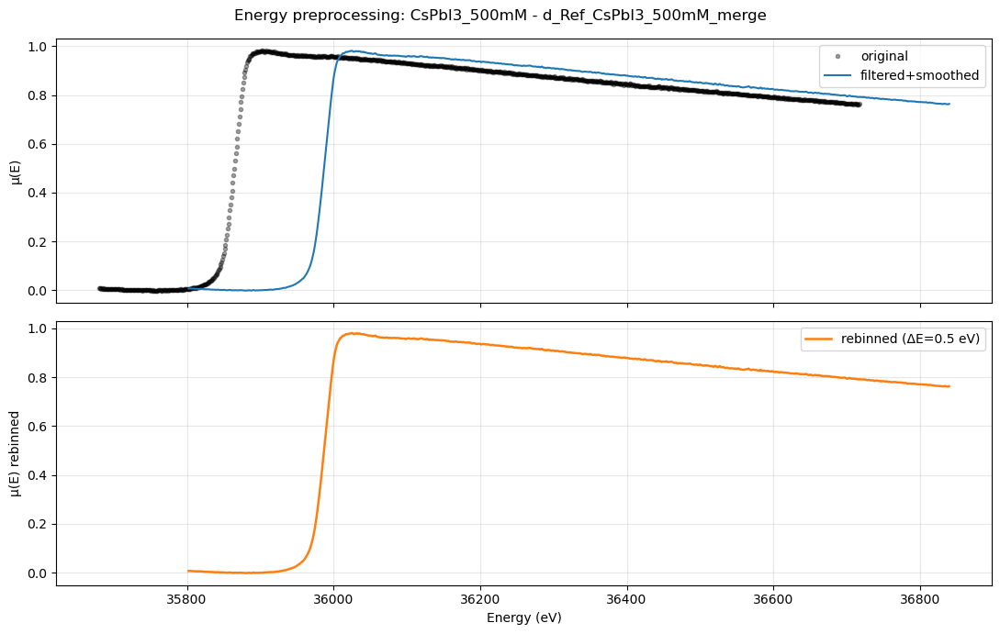

  CsPbI3_500mM/d_Ref_CsPbI3_500mM_merge: removed 0 outliers; new N=2075

Processing Project: CsPbI3_100mM
  Group CsPbI3_100mM_merge: Optimal rbkg = 1.26


ValueError: operands could not be broadcast together with shapes (2075,) (1000,) 

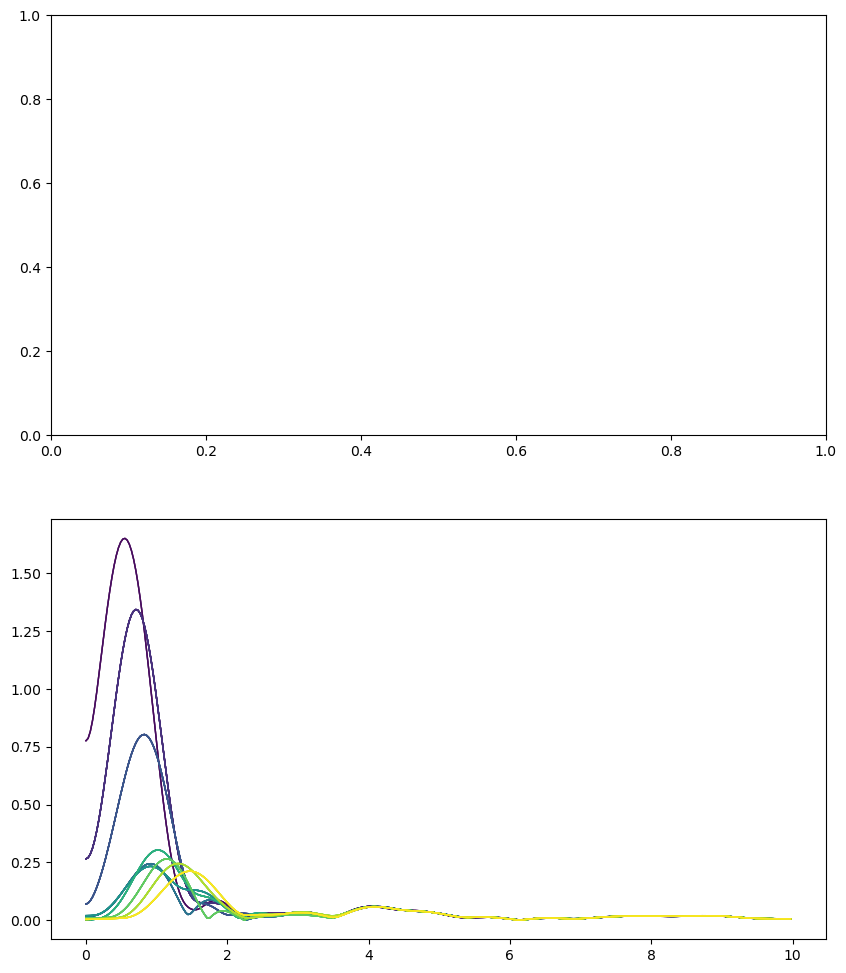

In [22]:
# Run preprocessing before background optimization
projects = preprocess_mu_energy(projects,
                                e_step_ev=0.5,
                                sg_window_ev=2.0,
                                sg_polyorder=3,
                                outlier_sigma=6.0,
                                plot_diagnostics=True)

# Re-run background optimization on cleaned data
projects = background_optimizer(projects)


Processing Project: CsPbI3_100mM
  Note: Using 'norm' attribute for CsPbI3_100mM_merge as 'norm_corrected' is not available
  Group CsPbI3_100mM_merge: Optimal rbkg = 1.26


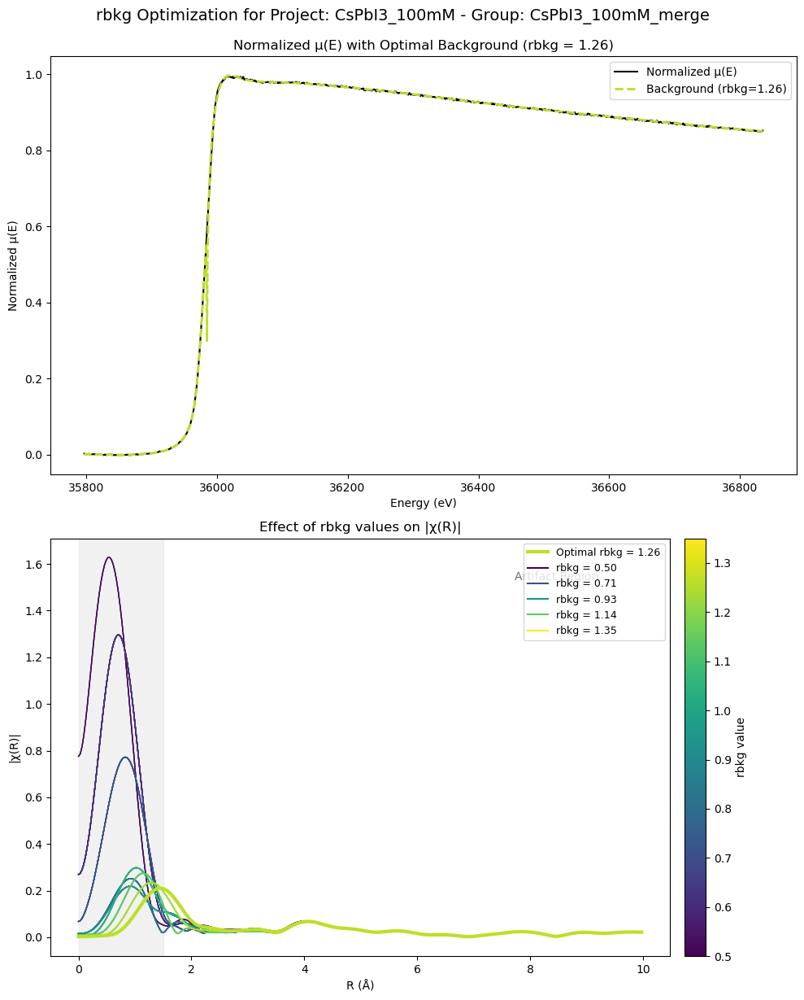


Processing Project: CsPbI3_1p0M
  Note: Using 'norm' attribute for CsPbI3_1p0M_merge as 'norm_corrected' is not available
  Group CsPbI3_1p0M_merge: Optimal rbkg = 1.25


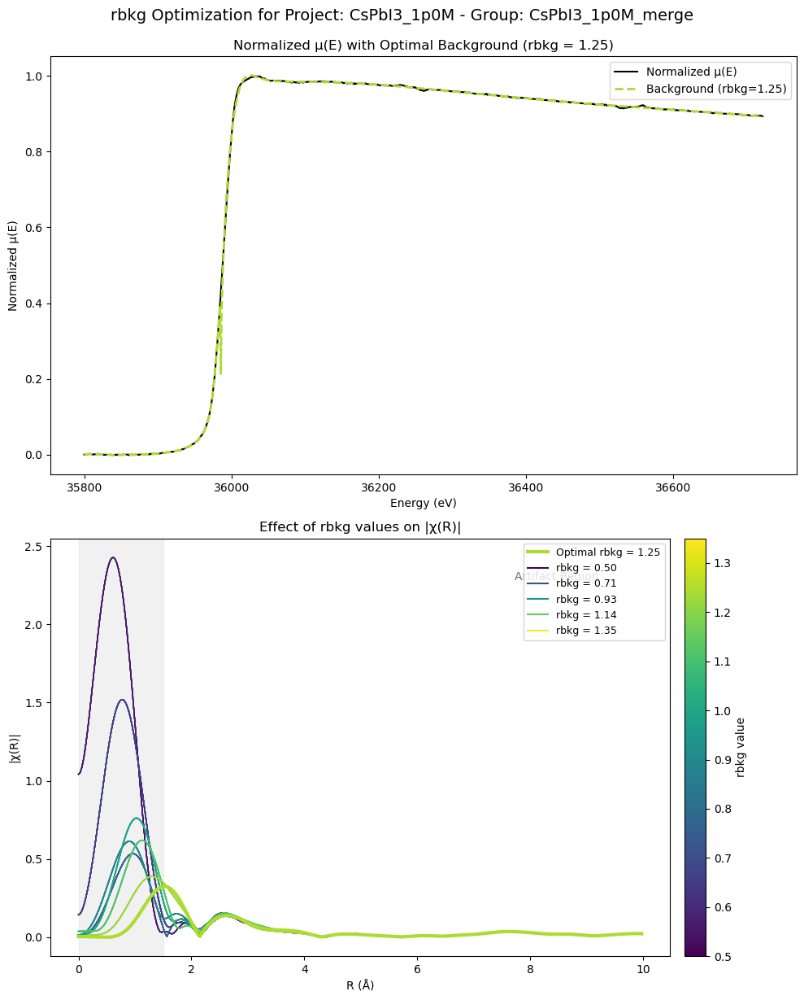


Processing Project: CsPbI3_500mM
  Note: Using 'norm' attribute for CsPbI3_500mM_merge as 'norm_corrected' is not available
  Group CsPbI3_500mM_merge: Optimal rbkg = 1.29


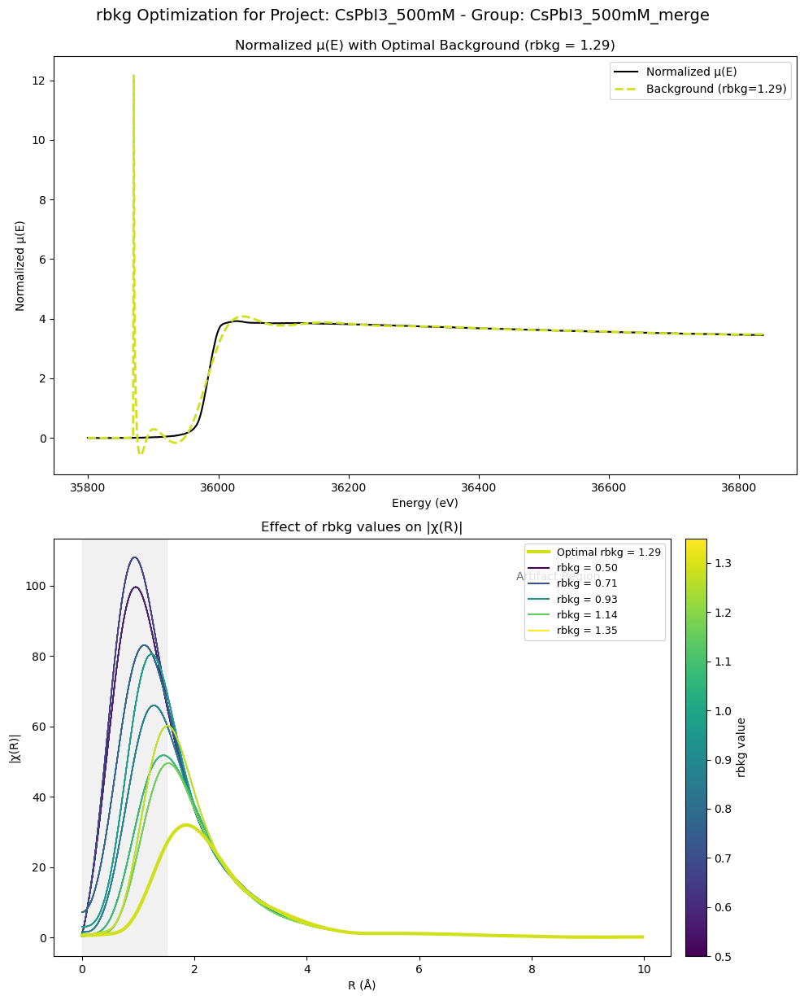

  Note: Using 'norm' attribute for d_Ref_CsPbI3_500mM_merge as 'norm_corrected' is not available
  Group d_Ref_CsPbI3_500mM_merge: Optimal rbkg = 1.28


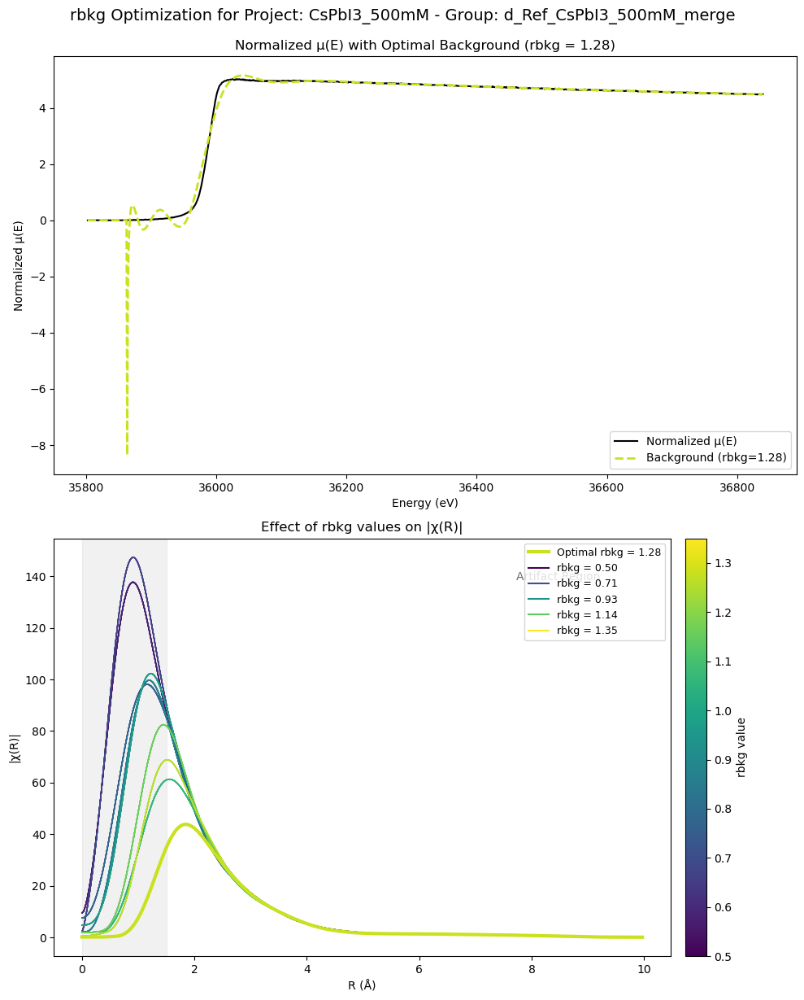


Project: CsPbI3_100mM
  CsPbI3_100mM_merge: optimal rbkg = 1.26

Project: CsPbI3_1p0M
  CsPbI3_1p0M_merge: optimal rbkg = 1.25

Project: CsPbI3_500mM
  CsPbI3_500mM_merge: optimal rbkg = 1.29
  d_Ref_CsPbI3_500mM_merge: optimal rbkg = 1.28


In [18]:
def background_optimizer(projects):
    """
    Perform batch background subtraction and rbkg optimization on projects.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded from batch_process_athena_projects()
    
    This function:
    - Loops through all groups in all provided projects
    - Tests a range of rbkg values for each group
    - Computes a smoothness metric based on low-R artifacts
    - Selects the optimal rbkg value that minimizes artifacts
    - Applies the optimal background subtraction to each group
    - Creates diagnostic plots for visualization
    - Stores the optimal rbkg value as an attribute on each group
    
    Returns:
    --------
    dict
        The modified projects dictionary with optimal rbkg values applied
    """
    import matplotlib.cm as cm
    import numpy as np
    import matplotlib.pyplot as plt
    from larch.xafs import autobk, xftf

    if not projects:
        print("No projects provided for background optimization")
        return None
        
    for proj_name, project in projects.items():
        print(f"\nProcessing Project: {proj_name}")
        for group_name, group in project.groups.items():
            # First check if we have the required attributes
            if hasattr(group, 'energy') and hasattr(group, 'mu'):
                # Check for norm_corrected, fallback to norm if needed
                if not hasattr(group, 'norm_corrected'):
                    if hasattr(group, 'norm'):
                        print(f"  Note: Using 'norm' attribute for {group_name} as 'norm_corrected' is not available")
                        group.norm_corrected = group.norm
                    else:
                        print(f"  Skipping group {group_name}: Missing normalization data")
                        continue
                
                # Set up optimization parameters
                rbkg_values = np.linspace(0.5, 1.35, 100)
                rbkg_results = []
                fig, axs = plt.subplots(2, 1, figsize=(10, 12))
                cmap = cm.viridis
                norm_c = plt.Normalize(rbkg_values.min(), rbkg_values.max())

                # Test different rbkg values
                for rbkg in rbkg_values:
                    color = cmap(norm_c(rbkg))
                    # Create a temporary copy to avoid modifying the original group
                    temp_group = type(group)()
                    for attr in ['energy', 'mu', 'norm_corrected', 'e0', 'edge_step']:
                        if hasattr(group, attr):
                            setattr(temp_group, attr, getattr(group, attr))
                    temp_group.norm = temp_group.norm_corrected
                    autobk(temp_group, rbkg=rbkg, kweight=1)
                    xftf(temp_group, kmin=2, kmax=6, dk=4, kwindow='hanning', kweight=3)
                    
                    if hasattr(temp_group, 'chir_mag') and hasattr(temp_group, 'r'):
                        r_mask = (temp_group.r > 0) & (temp_group.r < 1.0)
                        if np.any(r_mask):
                            low_r_intensity = integrate_method(temp_group.chir_mag[r_mask], 
                                                               temp_group.r[r_mask])
                            rbkg_results.append((rbkg, low_r_intensity, temp_group))
                            axs[1].plot(temp_group.r, temp_group.chir_mag, color=color,
                                        alpha=0.7, linewidth=1)
                
                # Process results if we have any
                if rbkg_results:
                    rbkg_results.sort(key=lambda x: x[1])
                    best_rbkg, best_metric, best_temp = rbkg_results[0]
                    best_color = cmap(norm_c(best_rbkg))
                    print(f"  Group {group_name}: Optimal rbkg = {best_rbkg:.2f}")

                    # Create a background copy of the group
                    bkg_group = type(group)()
                    for attr in ['energy', 'mu', 'norm_corrected', 'e0', 'edge_step']:
                        if hasattr(group, attr):
                            setattr(bkg_group, attr, getattr(group, attr))
                    bkg_group.norm = bkg_group.norm_corrected
                    autobk(bkg_group, rbkg=best_rbkg, kweight=2)

                    # Apply optimal background to original group
                    group.norm = group.norm_corrected
                    autobk(group, rbkg=best_rbkg, kweight=3)
                    xftf(group, kmin=2, kmax=6, dk=4, kwindow='hanning', kweight=3)
                    
                    # Store the optimal value for future reference
                    group.optimal_rbkg = best_rbkg
                    
                    # Calculate pre-edge contribution for plotting
                    pre_edge_mu = group.mu - group.norm_corrected * group.edge_step

                    # Plot optimized results
                    axs[0].plot(group.energy, group.norm_corrected, label='Normalized μ(E)', 
                                color='black')
                    if hasattr(bkg_group, 'bkg') and (len(bkg_group.bkg) == len(bkg_group.energy)):
                        bkg_norm = (bkg_group.bkg - pre_edge_mu) / group.edge_step
                        if len(bkg_norm) == len(group.energy):
                            axs[0].plot(group.energy, bkg_norm, 
                                        label=f'Background (rbkg={best_rbkg:.2f})', 
                                        linestyle='--', color=best_color, linewidth=2)
                        else:
                            print("  Warning: Shape mismatch between energy and background. Skipping background plot.")
                    else:
                        print("  Warning: Could not generate background curve for plot.")
                    
                    axs[0].set_xlabel('Energy (eV)')
                    axs[0].set_ylabel('Normalized μ(E)')
                    axs[0].set_title(f"Normalized μ(E) with Optimal Background (rbkg = {best_rbkg:.2f})")
                    axs[0].legend()

                    axs[1].plot(best_temp.r, best_temp.chir_mag, 
                                label=f'Optimal rbkg = {best_rbkg:.2f}', color=best_color,
                                linewidth=3, zorder=10)
                    
                    # Add a few representative rbkg values to the legend
                    legend_rbkg_values = [rbkg_values[0],
                                          rbkg_values[len(rbkg_values)//4],
                                          rbkg_values[len(rbkg_values)//2],
                                          rbkg_values[3*len(rbkg_values)//4],
                                          rbkg_values[-1]]
                    for rbkg in legend_rbkg_values:
                        if rbkg != best_rbkg:
                            color = cmap(norm_c(rbkg))
                            axs[1].plot([], [], label=f'rbkg = {rbkg:.2f}', color=color, linewidth=1.5)
                    
                    axs[1].set_xlabel('R (Å)')
                    axs[1].set_ylabel('|χ(R)|')
                    axs[1].set_title("Effect of rbkg values on |χ(R)|")
                    axs[1].axvspan(0, 1.5, color='lightgray', alpha=0.3)
                    axs[1].text(0.75, 0.9, "Artifact Region", color='dimgray',
                                transform=axs[1].transAxes, fontsize=10)
                    
                    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm_c)
                    sm.set_array([])
                    cbar = fig.colorbar(sm, ax=axs[1], orientation='vertical', pad=0.02)
                    cbar.set_label('rbkg value')
                    
                    axs[1].legend(loc='upper right', fontsize=9)
                    
                    plt.tight_layout()
                    plt.suptitle(f"rbkg Optimization for Project: {proj_name} - Group: {group_name}", 
                                 fontsize=14, y=1.02)
                    plt.show()
                else:
                    print(f"  Couldn't optimize rbkg for {group_name}: No valid results")
            else:
                missing = [attr for attr in ['energy', 'mu'] if not hasattr(group, attr)]
                print(f"  Skipping group {group_name}: Missing required attributes: {', '.join(missing)}")
                
    return projects  # Return the modified projects


# Use the optimized background removal on the loaded projects
projects = background_optimizer(projects_calibrated)

# Check the results
if projects:
    for proj_name, project in projects.items():
        print(f"\nProject: {proj_name}")
        for group_name, group in project.groups.items():
            if hasattr(group, 'optimal_rbkg'):
                print(f"  {group_name}: optimal rbkg = {group.optimal_rbkg:.2f}")


Processing Project: CsPbI3_100mM


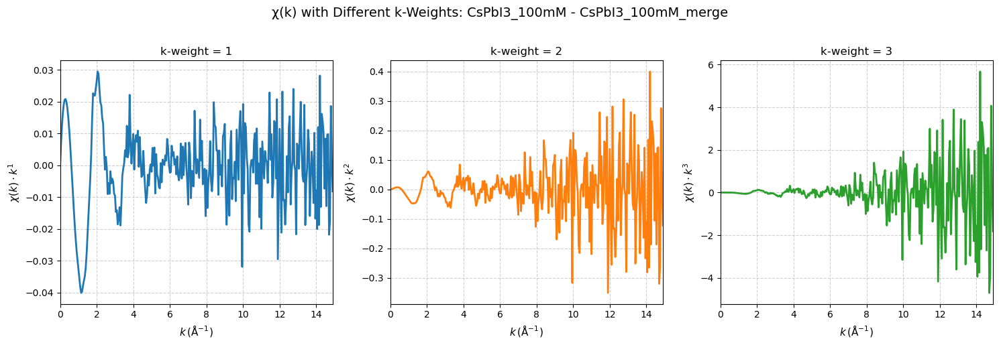


Processing Project: CsPbI3_1p0M


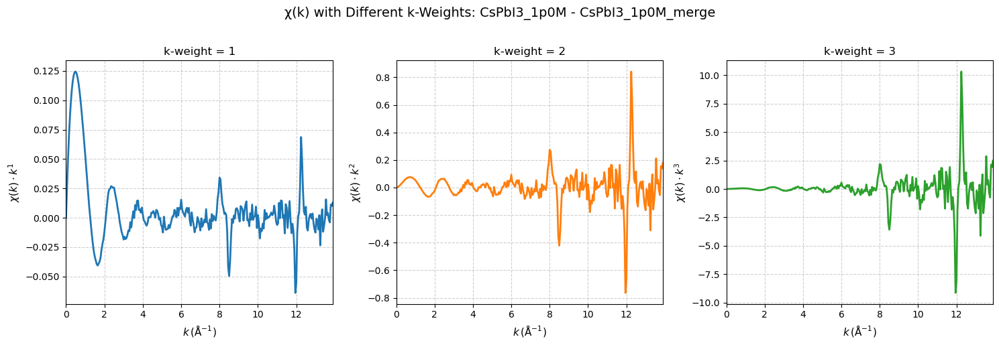


Processing Project: CsPbI3_500mM


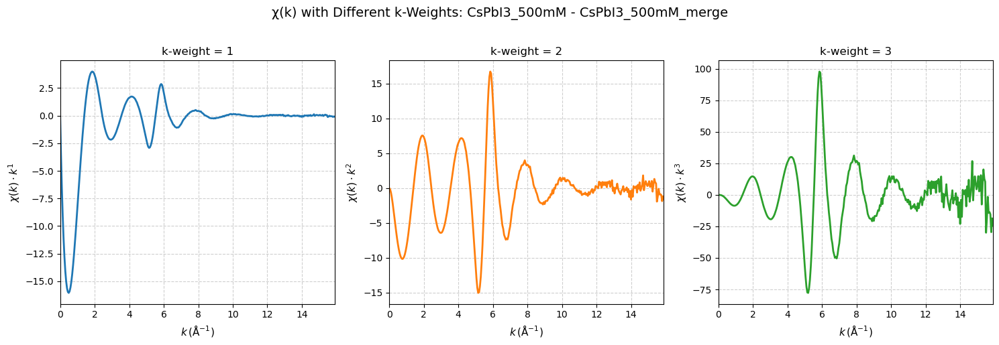

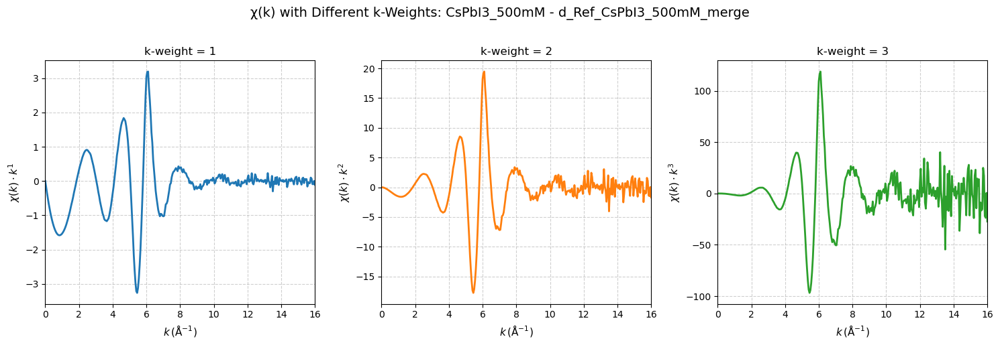


Processing chi(k) smoothing and tapering for Project: CsPbI3_100mM
Found 1 groups with chi(k) data
  Processing group: CsPbI3_100mM_merge


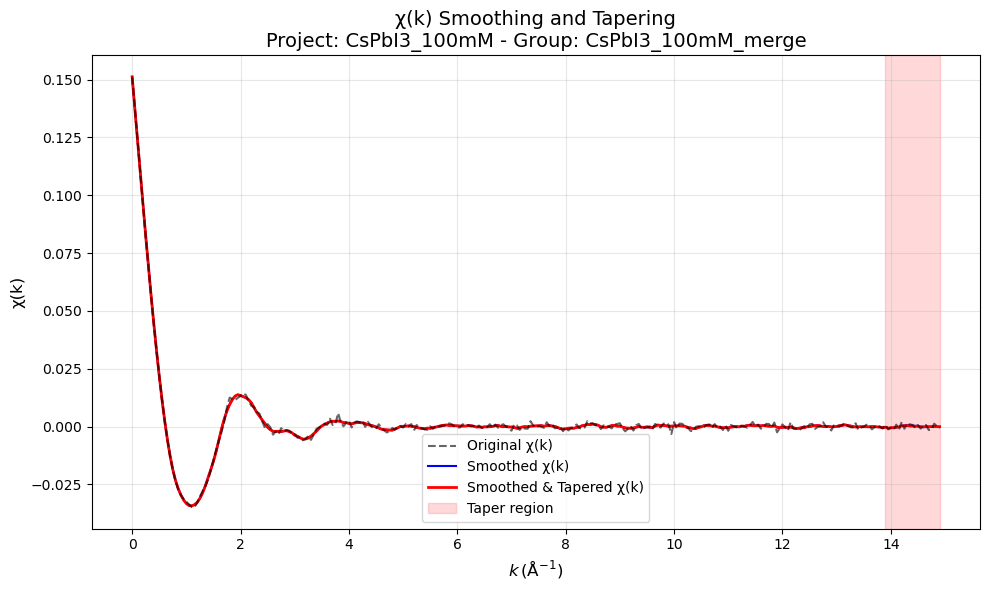

    Max change from smoothing: 0.003428
    Max change from tapering: 0.000264

Processing chi(k) smoothing and tapering for Project: CsPbI3_1p0M
Found 1 groups with chi(k) data
  Processing group: CsPbI3_1p0M_merge


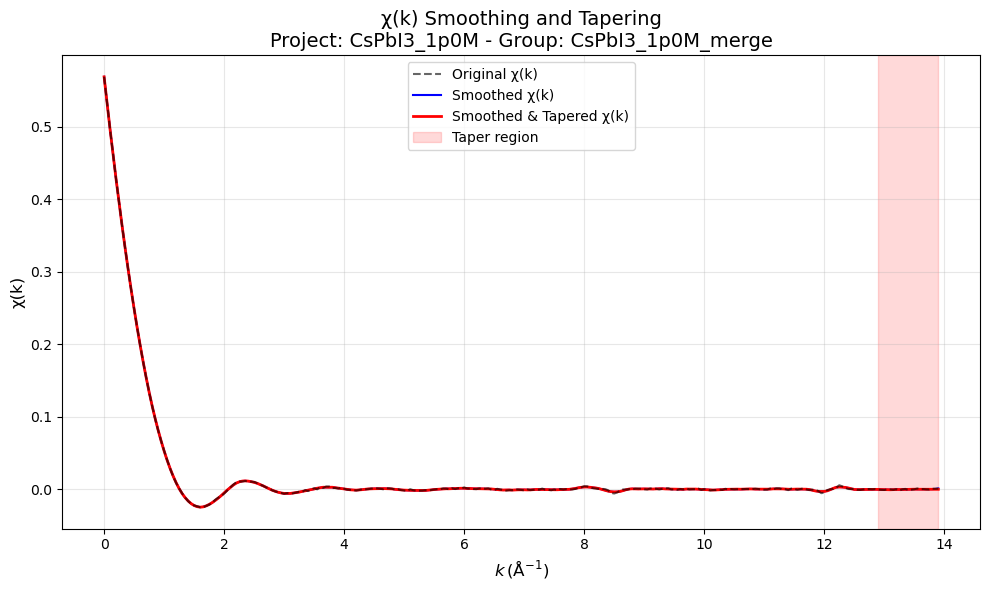

    Max change from smoothing: 0.002465
    Max change from tapering: 0.001136

Processing chi(k) smoothing and tapering for Project: CsPbI3_500mM
Found 2 groups with chi(k) data
  Processing group: CsPbI3_500mM_merge


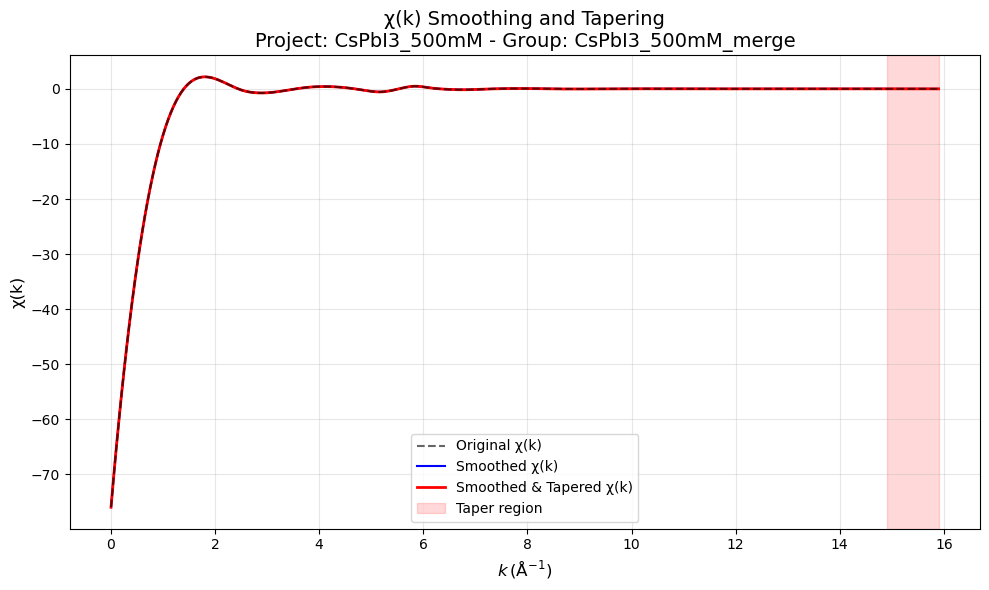

    Max change from smoothing: 0.013575
    Max change from tapering: 0.006860
  Processing group: d_Ref_CsPbI3_500mM_merge


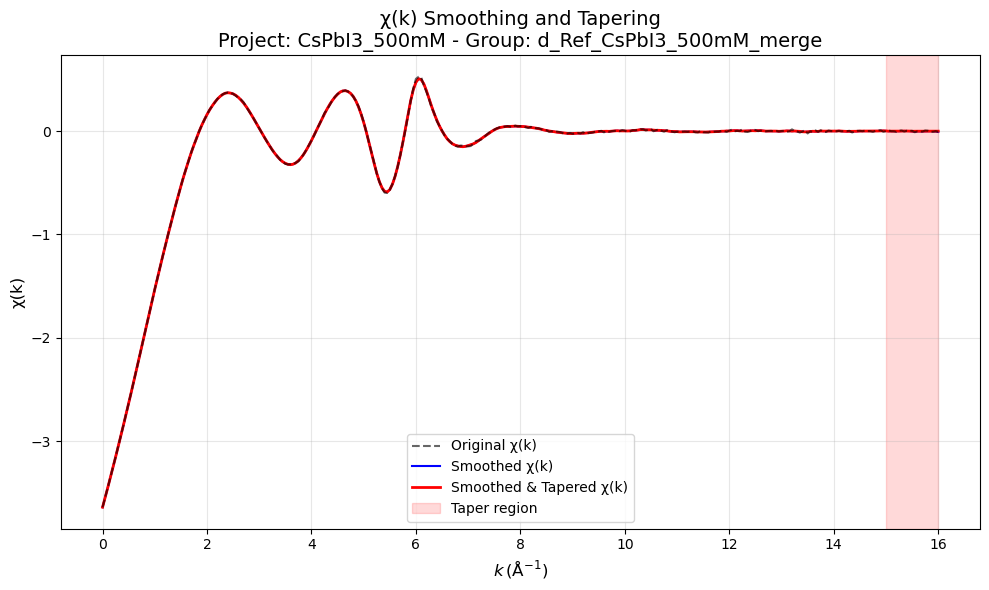

    Max change from smoothing: 0.033249
    Max change from tapering: 0.007422

Summary of processed groups:
  CsPbI3_100mM - CsPbI3_100mM_merge: Processed with smoothing and tapering
  CsPbI3_1p0M - CsPbI3_1p0M_merge: Processed with smoothing and tapering
  CsPbI3_500mM - CsPbI3_500mM_merge: Processed with smoothing and tapering
  CsPbI3_500mM - d_Ref_CsPbI3_500mM_merge: Processed with smoothing and tapering


In [19]:
def visualize_kw(projects):
    """
    Visualize χ(k) for different k-weight values (1, 2, and 3) for each group.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded from batch_process_athena_projects()
    
    This function creates a figure with three side-by-side subplots for each spectrum,
    showing the k-weighted EXAFS data with k-weights of 1, 2, and 3 for comparison.
    """
    try:
        k_label = plab.k
    except NameError:
        k_label = "k"
    
    if not projects:
        print("No projects provided for k-weight visualization")
        return
        
    for proj_name, project in projects.items():
        print(f"\nProcessing Project: {proj_name}")
        for group_name, group in project.groups.items():
            if hasattr(group, 'k') and hasattr(group, 'chi'):
                fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharey=False, sharex=True)
                for i, kweight in enumerate([1, 2, 3]):
                    axs[i].plot(group.k, group.chi * group.k**kweight, 
                                color=f'C{i}', linewidth=2)
                    axs[i].set_xlabel(k_label, fontsize=11)
                    axs[i].set_ylabel(f"$χ(k) \\cdot k^{kweight}$", fontsize=11)
                    axs[i].set_title(f"k-weight = {kweight}", fontsize=12)
                    axs[i].grid(True, linestyle='--', alpha=0.6)
                    if hasattr(group, 'k') and len(group.k) > 0:
                        axs[i].set_xlim(min(group.k), max(group.k))
                plt.suptitle(f"χ(k) with Different k-Weights: {proj_name} - {group_name}", 
                             fontsize=14, y=1.02)
                plt.tight_layout()
                plt.show()
            else:
                print(f"Skipping group {group_name} in {proj_name}: Missing 'k' or 'chi' attribute")
    
    return projects  # Return the projects for chaining


def smooth_and_taper_chi(projects, window_length=11, polyorder=3, taper_delta=1.0):
    """
    Apply smoothing and tapering to chi(k) data for all groups in all projects.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded from batch_process_athena_projects()
    window_length : int
        Window length for the Savitzky–Golay filter (must be odd)
    polyorder : int
        Polynomial order for the Savitzky–Golay filter
    taper_delta : float
        Width (in k units) of the taper region at the high-k end
    
    For each group having attributes 'k' and 'chi', this function:
    - Smooths chi(k) using a Savitzky–Golay filter (if data length permits)
    - Creates and applies a taper at the high-k end
    - Saves processed arrays (chi_smoothed and chi_tapered) to the group
    - Generates a diagnostic plot comparing original, smoothed, and tapered χ(k)
    - Reports maximum changes due to smoothing and tapering
    
    Returns:
    --------
    dict
        The modified projects dictionary with smoothed and tapered data
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.signal import savgol_filter
    
    if not projects:
        print("No projects provided for smoothing and tapering")
        return None

    # Define an inner helper function to smooth and taper a single (k, chi) array pair
    def _smooth_and_taper_single(k, chi, window_length, polyorder, taper_delta):
        # Check if data length is sufficient for smoothing
        if len(chi) < window_length:
            print(f"Warning: Data length ({len(chi)}) is shorter than window length ({window_length}). Using original data.")
            chi_smoothed = chi.copy()
        else:
            chi_smoothed = savgol_filter(chi, window_length, polyorder)
        
        # Create a taper array that forces the signal to go to zero at the high-k edge
        kmax = np.max(k)
        taper = np.ones_like(k)
        mask = k >= (kmax - taper_delta)
        if np.any(mask):
            taper[mask] = 0.5 * (1 + np.cos(np.pi * (k[mask] - (kmax - taper_delta)) / taper_delta))
        
        chi_tapered = chi_smoothed * taper
        return chi_smoothed, chi_tapered

    # Process each project and group
    for proj_name, project in projects.items():
        print(f"\nProcessing chi(k) smoothing and tapering for Project: {proj_name}")
        
        # Find groups that have the required chi(k) data
        valid_groups = [name for name, grp in project.groups.items() 
                        if hasattr(grp, 'k') and hasattr(grp, 'chi')]
        print(f"Found {len(valid_groups)} groups with chi(k) data")
        
        for group_name, group in project.groups.items():
            if hasattr(group, 'k') and hasattr(group, 'chi'):
                print(f"  Processing group: {group_name}")
                k = group.k
                chi = group.chi
                
                try:
                    chi_smoothed, chi_tapered = _smooth_and_taper_single(
                        k, chi, window_length, polyorder, taper_delta)
                    
                    # Store the processed data and parameters in the group
                    group.chi_smoothed = chi_smoothed
                    group.chi_tapered = chi_tapered
                    group.taper_parameters = {
                        'window_length': window_length,
                        'polyorder': polyorder,
                        'taper_delta': taper_delta
                    }
                    
                    # Plot the original, smoothed, and tapered chi(k)
                    fig, ax = plt.subplots(figsize=(10, 6))
                    ax.plot(k, chi, label="Original χ(k)", alpha=0.6, color='black', linestyle='--', zorder=3)
                    ax.plot(k, chi_smoothed, label="Smoothed χ(k)", color='blue', linestyle='-', linewidth=1.5)
                    ax.plot(k, chi_tapered, label="Smoothed & Tapered χ(k)", color='red', linestyle='-', linewidth=2)
                    
                    # Highlight the taper region
                    kmax = np.max(k)
                    taper_start = kmax - taper_delta
                    ax.axvspan(taper_start, kmax, alpha=0.15, color='red', label="Taper region")
                    
                    # Use plab.k for a nice label if available; otherwise, default to "k"
                    try:
                        k_label = plab.k
                    except NameError:
                        k_label = "k"
                    
                    ax.set_xlabel(k_label, fontsize=12)
                    ax.set_ylabel("χ(k)", fontsize=12)
                    ax.set_title(f"χ(k) Smoothing and Tapering\nProject: {proj_name} - Group: {group_name}", fontsize=14)
                    ax.grid(True, alpha=0.3)
                    ax.legend(loc='best')
                    plt.tight_layout()
                    plt.show()
                    
                    # Print out diagnostic information
                    chi_max_diff = np.max(np.abs(chi - chi_smoothed))
                    taper_effect = np.max(np.abs(chi_smoothed - chi_tapered))
                    print(f"    Max change from smoothing: {chi_max_diff:.6f}")
                    print(f"    Max change from tapering: {taper_effect:.6f}")
                except Exception as e:
                    print(f"    Error processing {group_name}: {str(e)}")
            else:
                print(f"  Skipping group {group_name}: Missing 'k' or 'chi' attribute")
                
    return projects  # Return the modified projects

# Visualize k-weighted EXAFS data
projects = visualize_kw(projects)

# Apply smoothing and tapering to the EXAFS data 
projects = smooth_and_taper_chi(projects, window_length=11, polyorder=3, taper_delta=1.0)

# Check results
if projects:
    print("\nSummary of processed groups:")
    for proj_name, project in projects.items():
        for group_name, group in project.groups.items():
            if hasattr(group, 'chi_tapered'):
                print(f"  {proj_name} - {group_name}: Processed with smoothing and tapering")


Processing FT for Project 'CsPbI3_100mM', Group 'CsPbI3_100mM_merge'
  Using rbkg = 1.26 Å

  Analyzing with k-weight 3:
  Found 39 zero crossings
  All zero crossings: [ 0.    0.6   1.65  2.45  3.45  4.45  4.9   5.2   5.6   6.3   6.6   6.8
  6.85  6.9   7.3   7.8   8.25  8.6   8.75  9.    9.3   9.35  9.6  10.2
 10.5  10.75 11.1  11.15 11.2  11.85 12.5  12.85 12.95 13.3  13.6  13.65
 14.15 14.5  14.85]
  Selected kmin candidates: [1.65 2.45]
  Selected kmax candidates: [7.3  7.8  8.25 8.6  8.75]


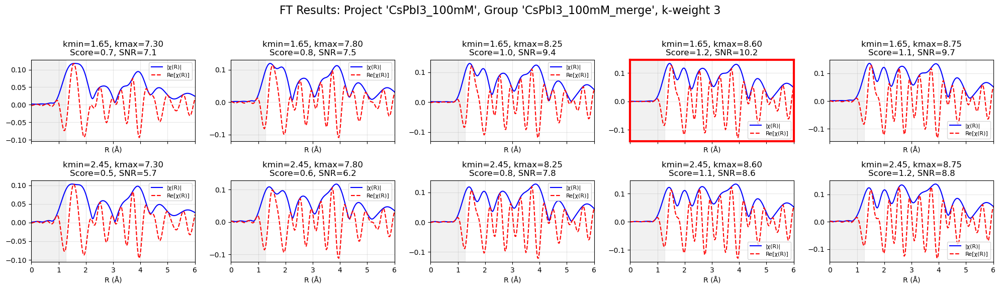

  Best parameters (k-weight 3):
    kmin = 1.650
    kmax = 8.600
    SNR = 10.2
    Quality Score = 1.1703469326996558


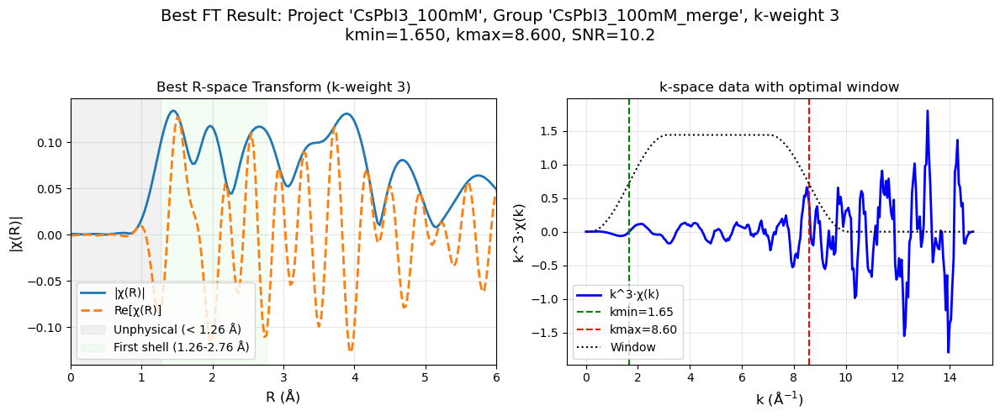


Processing FT for Project 'CsPbI3_1p0M', Group 'CsPbI3_1p0M_merge'
  Using rbkg = 1.25 Å

  Analyzing with k-weight 3:
  Found 24 zero crossings
  All zero crossings: [ 0.    1.25  2.05  2.75  3.45  4.    4.35  4.8   5.55  6.45  7.75  8.25
  8.7   9.55  9.65  9.9  10.35 10.9  11.   11.7  12.1  12.45 13.45 13.85]
  Selected kmin candidates: [2.05 2.75]
  Selected kmax candidates: [7.75 8.25 8.7  9.55 9.65]


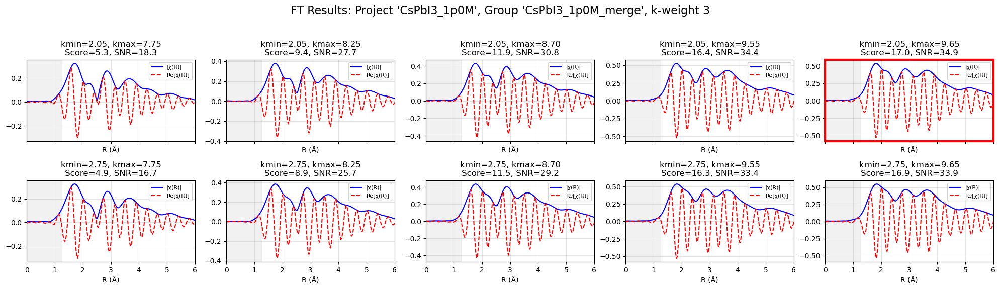

  Best parameters (k-weight 3):
    kmin = 2.050
    kmax = 9.650
    SNR = 34.9
    Quality Score = 16.957116110235734


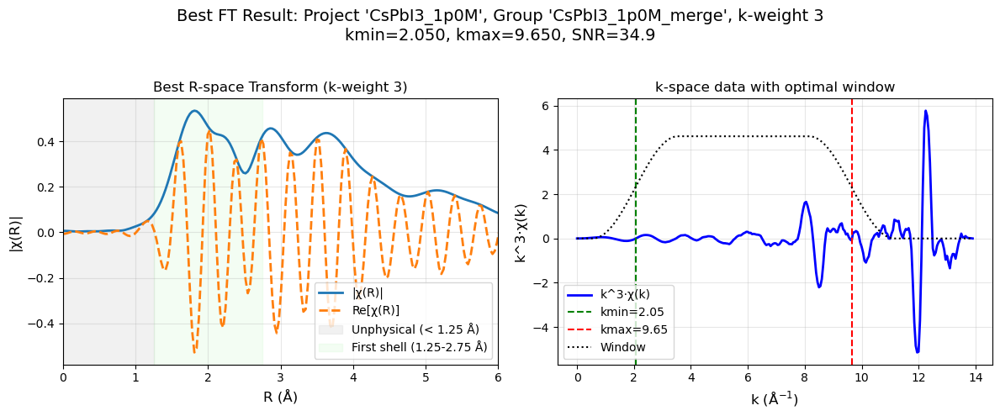


Processing FT for Project 'CsPbI3_500mM', Group 'CsPbI3_500mM_merge'
  Using rbkg = 1.29 Å

  Analyzing with k-weight 3:
  Found 20 zero crossings
  All zero crossings: [ 0.    1.35  2.4   3.5   4.65  5.5   6.3   7.3   8.4   9.55 10.75 11.95
 12.95 13.   13.05 14.2  14.4  14.45 15.4  15.85]
  Selected kmin candidates: [2.4]
  Selected kmax candidates: [ 7.3   8.4   9.55 10.75 11.95]


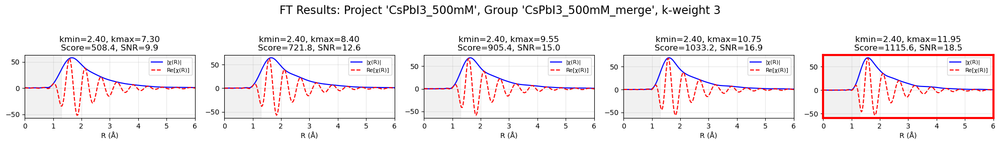

  Best parameters (k-weight 3):
    kmin = 2.400
    kmax = 11.950
    SNR = 18.5
    Quality Score = 1115.6219925954465


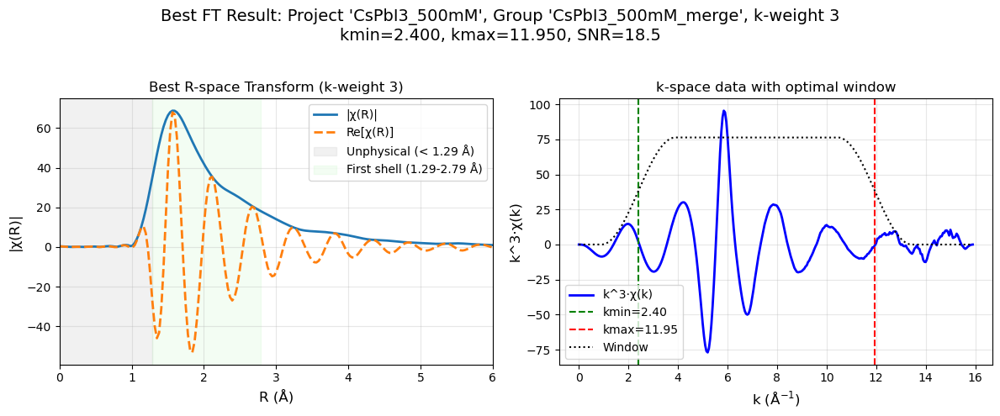


Processing FT for Project 'CsPbI3_500mM', Group 'd_Ref_CsPbI3_500mM_merge'
  Using rbkg = 1.28 Å

  Analyzing with k-weight 3:
  Found 28 zero crossings
  All zero crossings: [ 0.    1.85  3.    4.05  5.    5.75  6.5   7.45  8.55  9.75 10.8  11.85
 12.9  13.   13.25 13.7  13.85 13.9  13.95 14.   14.15 14.45 15.   15.15
 15.45 15.75 15.85 15.95]
  Selected kmin candidates: [1.85 3.  ]
  Selected kmax candidates: [ 7.45  8.55  9.75 10.8  11.85]


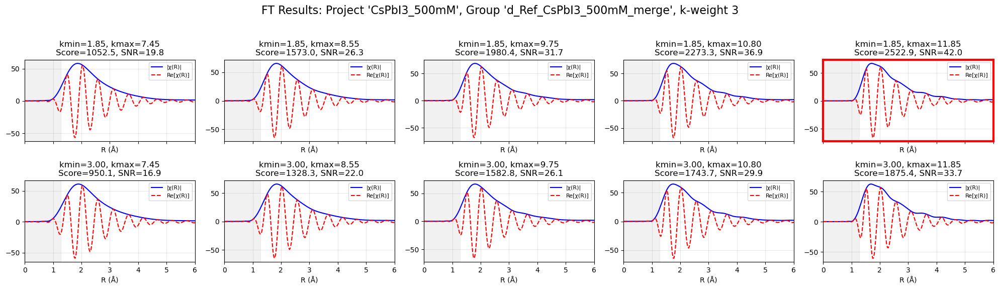

  Best parameters (k-weight 3):
    kmin = 1.850
    kmax = 11.850
    SNR = 42.0
    Quality Score = 2522.942072169589


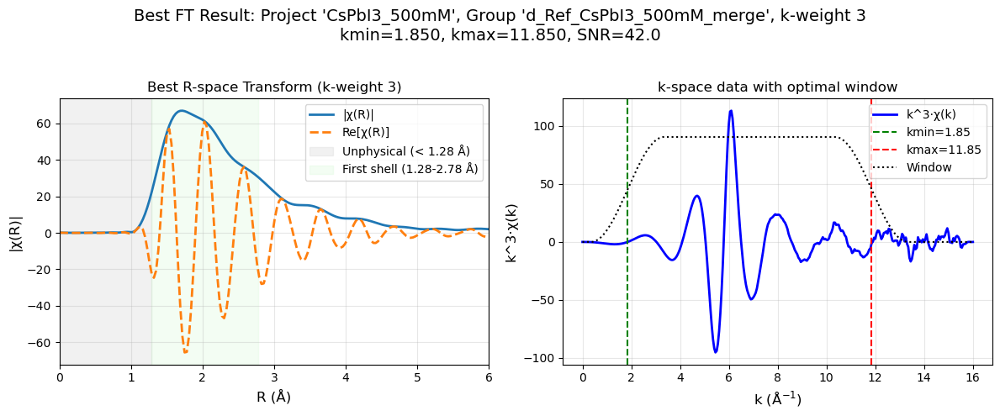


Summary of FT optimization results:
  CsPbI3_100mM - CsPbI3_100mM_merge: kmin=1.65, kmax=8.60
  CsPbI3_1p0M - CsPbI3_1p0M_merge: kmin=2.05, kmax=9.65
  CsPbI3_500mM - CsPbI3_500mM_merge: kmin=2.40, kmax=11.95
  CsPbI3_500mM - d_Ref_CsPbI3_500mM_merge: kmin=1.85, kmax=11.85


In [20]:
def ft_processing_batch(projects, k_weights=[2], dk=1, window='hanning'):
    """
    Perform batch Fourier Transform (FT) processing with automated kmin/kmax optimization.
    
    Parameters:
    -----------
    projects : dict
        Dictionary of projects loaded and processed with background_optimizer and smooth_and_taper_chi
    k_weights : list
        List of k-weights to use for FT processing (default: [3])
    dk : float
        Window sill width parameter for the FT window function
    window : str
        Window type to use ('hanning', 'kaiser', 'gaussian', etc.)
    
    For each group (with attributes 'k' and 'chi_tapered'), this function:
    - Determines candidate kmin/kmax values (using zero crossings)
    - Performs FT processing on each candidate pair
    - Evaluates quality metrics and identifies the optimal parameters
    - Generates diagnostic plots for comparison
    - Stores the optimal parameters and results in the group
    
    Returns:
    --------
    dict
        The modified projects dictionary with FT results
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from larch.xafs import xftf
    from larch import Group
    
    if not projects:
        print("No projects provided for FT processing")
        return projects
    
    for proj_name, project in projects.items():
        for group_name, group in project.groups.items():
            if hasattr(group, 'k') and hasattr(group, 'chi_tapered'):
                k = group.k
                chi_tapered = group.chi_tapered
                rbkg_value = getattr(group, 'optimal_rbkg', getattr(group, 'rbkg', 1.2))
                
                print(f"\nProcessing FT for Project '{proj_name}', Group '{group_name}'")
                print(f"  Using rbkg = {rbkg_value:.2f} Å")
                
                for kw in k_weights:
                    print(f"\n  Analyzing with k-weight {kw}:")
                    weighted_chi = chi_tapered * k**kw
                    zc_indices = np.where(np.diff(np.sign(weighted_chi)))[0]
                    if zc_indices.size > 0:
                        candidates_all = np.sort(k[zc_indices])
                        print(f"  Found {len(candidates_all)} zero crossings")
                        print(f"  All zero crossings: {np.round(candidates_all, 2)}")
                    else:
                        candidates_all = np.array([])
                        print("  No zero crossings found! Using default values.")
                    
                    # Determine kmin candidates
                    kmin_region = candidates_all[(candidates_all >= 1.5) & (candidates_all <= 3)]
                    if len(kmin_region) > 0:
                        candidate_kmin_list = kmin_region[:3]
                    elif len(candidates_all) > 0:
                        first_zc = candidates_all[0]
                        candidate_kmin_list = np.array([first_zc]) if first_zc > 1.0 else np.array([3.0])
                    else:
                        candidate_kmin_list = np.array([3.0])
                    
                    # Determine kmax candidates
                    high_k_region = candidates_all[(candidates_all > 7)]
                    if len(high_k_region) > 0:
                        candidate_kmax_list = np.sort(high_k_region[:5])  # selecting the first 6 candidates
                    else:
                        # If no candidates found above 11, use a reasonable default range
                        max_k = np.max(k)
                        candidate_kmax_list = np.array([max_k - 1])

                    print(f"  Selected kmin candidates: {np.round(candidate_kmin_list, 2)}")
                    print(f"  Selected kmax candidates: {np.round(candidate_kmax_list, 2)}")
                    
                    ft_results = []
                    best_score = -float('inf')
                    best_kmin = None
                    best_kmax = None
                    best_temp = None
                    
                    n_rows = len(candidate_kmin_list)
                    n_cols = len(candidate_kmax_list)
                    
                    if n_rows * n_cols > 1:
                        fig, axs = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 3 * n_rows), sharex=True)
                        # Ensure axs is 2D even if one dimension is 1
                        if n_rows == 1 and n_cols == 1:
                            axs = np.array([[axs]])
                        elif n_rows == 1:
                            axs = np.expand_dims(axs, axis=0)
                        elif n_cols == 1:
                            axs = np.expand_dims(axs, axis=1)
                        
                        for i, cand_kmin in enumerate(candidate_kmin_list):
                            for j, cand_kmax in enumerate(candidate_kmax_list):
                                ax = axs[i, j]
                                if cand_kmin < cand_kmax:
                                    temp = Group()
                                    temp.k = k.copy()
                                    temp.chi = chi_tapered.copy()
                                    xftf(temp, kweight=kw, kmin=cand_kmin, kmax=cand_kmax, 
                                         dk=dk, kwindow=window)
                                    ax.plot(temp.r, temp.chir_mag, label="|χ(R)|", color='blue')
                                    ax.plot(temp.r, temp.chir_re, label="Re[χ(R)]", 
                                            linestyle='--', color='red')
                                    
                                    first_shell_mask = (temp.r > rbkg_value) & (temp.r < rbkg_value + 1.5)
                                    if np.any(first_shell_mask):
                                        first_shell_height = np.max(temp.chir_mag[first_shell_mask])
                                        first_shell_pos = temp.r[first_shell_mask][np.argmax(temp.chir_mag[first_shell_mask])]
                                        noise_mask = (temp.r > 0) & (temp.r < rbkg_value)
                                        noise = np.mean(temp.chir_mag[noise_mask]) if np.any(noise_mask) else 0.001
                                        snr = first_shell_height / noise if noise > 0 else 0
                                        position_factor = 1.0 - 0.2 * abs(first_shell_pos - 2.5) / 1.5
                                        quality_score = snr * position_factor * first_shell_height

                                        ft_results.append({
                                            'kmin': cand_kmin,
                                            'kmax': cand_kmax,
                                            'snr': snr,
                                            'quality_score': quality_score,
                                            'temp': temp
                                        })

                                        if quality_score > best_score:
                                            best_score = quality_score
                                            best_kmin = cand_kmin
                                            best_kmax = cand_kmax
                                            best_temp = Group()
                                            best_temp.k = temp.k.copy()
                                            best_temp.chi = temp.chi.copy()
                                            best_temp.r = temp.r.copy()
                                            best_temp.chir_mag = temp.chir_mag.copy()
                                            best_temp.chir_re = temp.chir_re.copy()
                                            best_temp.chir_im = temp.chir_im.copy() if hasattr(temp, 'chir_im') else None

                                        ax.set_title(f"kmin={cand_kmin:.2f}, kmax={cand_kmax:.2f}\n"
                                                     f"Score={quality_score:.1f}, SNR={snr:.1f}")
                                    else:
                                        ax.set_title(f"kmin={cand_kmin:.2f}, kmax={cand_kmax:.2f}")
                                    
                                    ax.axvspan(0, rbkg_value, color='lightgray', alpha=0.3)
                                    ax.set_xlabel('R (Å)')
                                    ax.grid(True, alpha=0.3)
                                    ax.legend(fontsize=8)
                                    ax.set_xlim(0, 6)
                                else:
                                    ax.text(0.5, 0.5, "Invalid combination\nkmin ≥ kmax", 
                                            ha='center', va='center')
                                    ax.set_title(f"kmin={cand_kmin:.2f}, kmax={cand_kmax:.2f}")
                        
                        if best_kmin is not None and best_kmax is not None:
                            try:
                                best_i = np.where(candidate_kmin_list == best_kmin)[0][0]
                                best_j = np.where(candidate_kmax_list == best_kmax)[0][0]
                                for spine in axs[best_i, best_j].spines.values():
                                    spine.set_edgecolor('red')
                                    spine.set_linewidth(3)
                            except Exception as e:
                                print(f"  Warning: Couldn't highlight best parameter pair: {e}")
                        
                        fig.suptitle(f"FT Results: Project '{proj_name}', Group '{group_name}', k-weight {kw}", 
                                     fontsize=16)
                        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
                        plt.show()
                    
                    if ft_results:
                        ft_results.sort(key=lambda x: x.get('quality_score', x.get('snr', 0)), reverse=True)
                        best_result = ft_results[0]
                        setattr(group, f"best_kmin_kw{kw}", best_result['kmin'])
                        setattr(group, f"best_kmax_kw{kw}", best_result['kmax'])
                        if kw == 2:
                            group.best_kmin = best_result['kmin']
                            group.best_kmax = best_result['kmax']
                        
                        best_temp = best_result['temp']
                        setattr(group, f"best_r_kw{kw}", best_temp.r)
                        setattr(group, f"best_chir_mag_kw{kw}", best_temp.chir_mag)
                        setattr(group, f"best_chir_re_kw{kw}", best_temp.chir_re)
                        if hasattr(best_temp, 'chir_im'):
                            setattr(group, f"best_chir_im_kw{kw}", best_temp.chir_im)
                        
                        print(f"  Best parameters (k-weight {kw}):")
                        print(f"    kmin = {best_result['kmin']:.3f}")
                        print(f"    kmax = {best_result['kmax']:.3f}")
                        print(f"    SNR = {best_result['snr']:.1f}")
                        print(f"    Quality Score = {best_result.get('quality_score', 'N/A')}")
                        
                        plt.figure(figsize=(12, 5))
                        plt.subplot(1, 2, 1)
                        plt.plot(best_temp.r, best_temp.chir_mag, label="|χ(R)|", linewidth=2)
                        plt.plot(best_temp.r, best_temp.chir_re, label="Re[χ(R)]", linestyle='--', linewidth=2)
                        plt.axvspan(0, rbkg_value, color='lightgray', alpha=0.3, 
                                    label=f"Unphysical (< {rbkg_value:.2f} Å)")
                        plt.axvspan(rbkg_value, rbkg_value + 1.5, color='lightgreen', alpha=0.1, 
                                    label=f"First shell ({rbkg_value:.2f}-{rbkg_value+1.5:.2f} Å)")
                        plt.xlabel('R (Å)', fontsize=12)
                        plt.ylabel('|χ(R)|', fontsize=12)
                        plt.title(f"Best R-space Transform (k-weight {kw})")
                        plt.grid(True, alpha=0.3)
                        plt.legend()
                        plt.xlim(0, 6)
                        
                        plt.subplot(1, 2, 2)
                        plt.plot(k, chi_tapered * k**kw, 'b-', lw=2, label=f'k^{kw}·χ(k)')
                        plt.axvline(x=best_result['kmin'], color='g', linestyle='--', 
                                    label=f'kmin={best_result["kmin"]:.2f}')
                        plt.axvline(x=best_result['kmax'], color='r', linestyle='--', 
                                    label=f'kmax={best_result["kmax"]:.2f}')
                        
                        try:
                            from larch.xafs.xafsft import ftwindow
                            win = ftwindow(k, xmin=best_result['kmin'], xmax=best_result['kmax'], 
                                           dx=dk, window=window)
                            plt.plot(k, win * np.max(np.abs(chi_tapered * k**kw)) * 0.8, 
                                     'k:', label='Window')
                        except Exception as e:
                            print(f"  Warning: Could not generate window function: {e}")
                        
                        plt.xlabel('k (Å$^{-1}$)', fontsize=12)
                        plt.ylabel(f'k^{kw}·χ(k)', fontsize=12)
                        plt.title('k-space data with optimal window')
                        plt.legend()
                        plt.grid(True, alpha=0.3)
                        
                        plt.suptitle(
                            f"Best FT Result: Project '{proj_name}', Group '{group_name}', k-weight {kw}\n"
                            f"kmin={best_result['kmin']:.3f}, kmax={best_result['kmax']:.3f}, SNR={best_result['snr']:.1f}",
                            fontsize=14
                        )
                        plt.tight_layout(rect=[0, 0, 1, 0.95])
                        plt.show()
            else:
                print(f"Skipping group '{group_name}' in Project '{proj_name}': Missing 'k' or 'chi_tapered' attribute")
    
    return projects  # Return the modified projects for chaining

projects = ft_processing_batch(projects, k_weights=[3], dk=3, window='hanning')

# Verify results
if projects:
    print("\nSummary of FT optimization results:")
    for proj_name, project in projects.items():
        for group_name, group in project.groups.items():
            if hasattr(group, 'best_kmin_kw3'):
                print(f"  {proj_name} - {group_name}: kmin={group.best_kmin_kw3:.2f}, kmax={group.best_kmax_kw3:.2f}")

In [ ]:
#need to modify to save processed data as athena project files
# the saved files will be loaded into a seperate fitting notebook for fitting
from pathlib import Path

from larch.io import read_ascii, AthenaProject
from larch.xafs import pre_edge

from larch.plot.plotly_xafsplots import plot_mu
# finally, we can create and Athena Project File and add groups to it, and then save the project
project = AthenaProject(filename=Path(athena_projects_path, 'CsKedge_processed.prj'))


for group_name, group in project.groups.items():
    project.add_group(group, group_name)
project.save(use_gzip=True)

In [ ]:
# FIXED VERSION: Corrected calibration function that handles missing mu_original

def calibrate_cs_k_edge_precise_fixed(projects, target_e0=35985.0, energy_window=30.0):
    """
    FIXED: More precise calibration that handles missing mu_original attribute
    """
    import numpy as np
    from scipy.signal import find_peaks
    from larch.xafs import pre_edge
    import matplotlib.pyplot as plt
    
    print(f"Precise calibration: Aligning derivative maximum with {target_e0:.1f} eV")
    print("="*60)
    
    for proj_name, project in projects.items():
        print(f"\\nProcessing project: {proj_name}")
        
        for group_name, group in project.groups.items():
            if not (hasattr(group, 'energy') and hasattr(group, 'mu')):
                continue
                
            print(f"\\n  Processing group: {group_name}")
            
            # Store original energy and mu if not already stored
            if not hasattr(group, 'energy_original'):
                group.energy_original = group.energy.copy()
            if not hasattr(group, 'mu_original'):
                group.mu_original = group.mu.copy()
            
            # Use original data for derivative calculation
            energy_for_calc = group.energy_original
            mu_for_calc = group.mu_original
            
            # Calculate first derivative
            dmu_de = np.gradient(mu_for_calc, energy_for_calc)
            
            # Find current e0 from pre-edge analysis
            current_e0 = getattr(group, 'e0', target_e0)
            
            # Define search window around current e0
            search_min = current_e0 - energy_window/2
            search_max = current_e0 + energy_window/2
            
            # Find indices within search window
            search_mask = (energy_for_calc >= search_min) & (energy_for_calc <= search_max)
            
            if not search_mask.any():
                print(f"    Warning: No data points in search window [{search_min:.1f}, {search_max:.1f}]")
                continue
            
            # Extract search region
            search_energies = energy_for_calc[search_mask]
            search_derivative = dmu_de[search_mask]
            
            # Find the absolute maximum of the first derivative
            max_idx_local = np.argmax(search_derivative)
            derivative_max_energy = search_energies[max_idx_local]
            derivative_max_value = search_derivative[max_idx_local]
            
            # Calculate required energy shift
            energy_shift = target_e0 - derivative_max_energy
            
            print(f"    Current e0: {current_e0:.2f} eV")
            print(f"    Derivative maximum at: {derivative_max_energy:.2f} eV")
            print(f"    Derivative maximum value: {derivative_max_value:.4f}")
            print(f"    Required energy shift: {energy_shift:+.2f} eV")
            
            # Apply energy calibration
            group.energy = group.energy_original + energy_shift
            
            # Re-run pre-edge analysis with calibrated energy
            pre_edge(group)
            
            print(f"    After calibration:")
            print(f"      New e0: {group.e0:.2f} eV")
            print(f"      Energy shift applied: {energy_shift:+.2f} eV")
            
            # Store calibration metadata
            group.energy_shift_applied = energy_shift
            group.derivative_max_original = derivative_max_energy
            group.derivative_max_value = derivative_max_value
            group.calibration_target = target_e0
            
            # Verify calibration by checking new derivative maximum
            new_dmu_de = np.gradient(group.mu, group.energy)
            new_search_mask = (group.energy >= target_e0 - 5) & (group.energy <= target_e0 + 5)
            if new_search_mask.any():
                new_max_energy = group.energy[new_search_mask][np.argmax(new_dmu_de[new_search_mask])]
                print(f"      Verification: New derivative max at {new_max_energy:.2f} eV")
                error = abs(new_max_energy - target_e0)
                print(f"      Alignment error: {error:.2f} eV")
    
    return projects

# Apply the FIXED calibration
if 'projects' in locals() and projects:
    print("Applying FIXED energy calibration...")
    projects_calibrated = calibrate_cs_k_edge_precise_fixed(projects, target_e0=35985.0, energy_window=30.0)
    print("\\nFixed calibration completed successfully!")
else:
    print("Load projects first using batch_process_athena_projects()")


In [ ]:
# Robust Energy Calibration using Gaussian Fitting of dμ/dE

def calibrate_cs_edge_gaussian_fit(projects, target_e0=35985.0, fit_window=20.0, smooth_points=3):
    """
    Robust calibration using Gaussian fitting of the first derivative peak.
    
    This method:
    1. Smooths the first derivative to reduce noise
    2. Finds the approximate peak location
    3. Fits a Gaussian function to the derivative peak
    4. Uses the Gaussian center as the true edge position
    5. Aligns this center with the target e0
    
    Parameters:
    -----------
    projects : dict
        Dictionary of loaded projects
    target_e0 : float
        Target Cs K edge energy in eV (default: 35985.0 eV)
    fit_window : float
        Energy window around peak for Gaussian fitting (default: 20.0 eV)
    smooth_points : int
        Number of points for smoothing the derivative (default: 3)
    """
    import numpy as np
    from scipy.optimize import curve_fit
    from scipy.ndimage import uniform_filter1d
    from larch.xafs import pre_edge
    import matplotlib.pyplot as plt
    
    def gaussian(x, amplitude, center, sigma, offset):
        """Gaussian function for fitting"""
        return amplitude * np.exp(-((x - center) ** 2) / (2 * sigma ** 2)) + offset
    
    print(f"Robust Gaussian-fit calibration: Aligning derivative peak with {target_e0:.1f} eV")
    print("="*70)
    
    for proj_name, project in projects.items():
        print(f"\\nProcessing project: {proj_name}")
        
        for group_name, group in project.groups.items():
            if not (hasattr(group, 'energy') and hasattr(group, 'mu')):
                continue
                
            print(f"\\n  Processing group: {group_name}")
            
            # Store original energy if not already done
            if not hasattr(group, 'energy_original'):
                group.energy_original = group.energy.copy()
            
            # Use original energy for calculations
            energy = group.energy_original
            mu = group.mu
            
            # Calculate first derivative
            dmu_de = np.gradient(mu, energy)
            
            # Smooth the derivative to reduce noise
            if smooth_points > 1:
                dmu_de_smooth = uniform_filter1d(dmu_de, size=smooth_points)
            else:
                dmu_de_smooth = dmu_de
            
            # Find approximate peak location (initial guess)
            current_e0 = getattr(group, 'e0', target_e0)
            search_mask = (energy >= current_e0 - 15) & (energy <= current_e0 + 15)
            
            if not search_mask.any():
                print(f"    Warning: No data in search region around {current_e0:.1f} eV")
                continue
            
            # Find initial peak estimate
            search_energies = energy[search_mask]
            search_derivative = dmu_de_smooth[search_mask]
            initial_peak_idx = np.argmax(search_derivative)
            initial_peak_energy = search_energies[initial_peak_idx]
            initial_peak_value = search_derivative[initial_peak_idx]
            
            print(f"    Initial peak estimate: {initial_peak_energy:.2f} eV")
            
            # Define fitting region around the peak
            fit_min = initial_peak_energy - fit_window/2
            fit_max = initial_peak_energy + fit_window/2
            fit_mask = (energy >= fit_min) & (energy <= fit_max)
            
            if fit_mask.sum() < 10:  # Need at least 10 points for fitting
                print(f"    Warning: Insufficient data points for Gaussian fitting")
                continue
            
            fit_energies = energy[fit_mask]
            fit_derivative = dmu_de_smooth[fit_mask]
            
            # Initial parameters for Gaussian fit
            amplitude_guess = initial_peak_value - np.min(fit_derivative)
            center_guess = initial_peak_energy
            sigma_guess = fit_window / 6  # Reasonable initial guess
            offset_guess = np.min(fit_derivative)
            
            initial_params = [amplitude_guess, center_guess, sigma_guess, offset_guess]
            
            try:
                # Perform Gaussian fit
                popt, pcov = curve_fit(gaussian, fit_energies, fit_derivative, 
                                     p0=initial_params, maxfev=2000)
                
                fitted_amplitude, fitted_center, fitted_sigma, fitted_offset = popt
                
                # Calculate fit quality metrics
                fitted_curve = gaussian(fit_energies, *popt)
                r_squared = 1 - np.sum((fit_derivative - fitted_curve)**2) / np.sum((fit_derivative - np.mean(fit_derivative))**2)
                
                print(f"    Gaussian fit results:")
                print(f"      Center: {fitted_center:.3f} eV")
                print(f"      Sigma: {fitted_sigma:.3f} eV")
                print(f"      FWHM: {2.355 * fitted_sigma:.3f} eV")
                print(f"      R²: {r_squared:.4f}")
                
                # Check if fit is reasonable
                if r_squared < 0.7:
                    print(f"    Warning: Poor fit quality (R² = {r_squared:.3f}), using simple peak finding")
                    fitted_center = initial_peak_energy
                elif abs(fitted_center - initial_peak_energy) > fit_window/2:
                    print(f"    Warning: Fitted center too far from initial guess, using simple peak finding")
                    fitted_center = initial_peak_energy
                
                # Calculate energy shift needed
                energy_shift = target_e0 - fitted_center
                
                print(f"    Fitted derivative center: {fitted_center:.2f} eV")
                print(f"    Target e0: {target_e0:.2f} eV")
                print(f"    Required energy shift: {energy_shift:+.2f} eV")
                
                # Apply calibration
                group.energy = group.energy_original + energy_shift
                
                # Re-run pre-edge analysis
                pre_edge(group)
                
                print(f"    After calibration:")
                print(f"      New e0: {group.e0:.2f} eV")
                
                # Store calibration metadata
                group.energy_shift_applied = energy_shift
                group.derivative_center_fitted = fitted_center
                group.derivative_center_original = initial_peak_energy
                group.gaussian_fit_params = popt
                group.gaussian_fit_r2 = r_squared
                group.gaussian_fwhm = 2.355 * fitted_sigma
                group.calibration_method = 'gaussian_fit'
                
            except Exception as fit_error:
                print(f"    Gaussian fitting failed: {fit_error}")
                print(f"    Using simple peak finding instead")
                
                # Fallback to simple peak finding
                energy_shift = target_e0 - initial_peak_energy
                group.energy = group.energy_original + energy_shift
                pre_edge(group)
                
                # Store fallback metadata
                group.energy_shift_applied = energy_shift
                group.derivative_center_fitted = initial_peak_energy
                group.derivative_center_original = initial_peak_energy
                group.calibration_method = 'simple_peak'
                
                print(f"    Fallback calibration applied: {energy_shift:+.2f} eV")
                print(f"    New e0: {group.e0:.2f} eV")
    
    return projects

def plot_gaussian_fit_results(projects, show_fits=True):
    """
    Plot calibration results with Gaussian fits shown
    """
    import matplotlib.pyplot as plt
    import numpy as np
    from scipy.ndimage import uniform_filter1d
    
    def gaussian(x, amplitude, center, sigma, offset):
        return amplitude * np.exp(-((x - center) ** 2) / (2 * sigma ** 2)) + offset
    
    for proj_name, project in projects.items():
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        fig.suptitle(f'Gaussian Fit Calibration Results: {proj_name}', fontsize=16)
        
        ax1, ax2 = axes[0]
        ax3, ax4 = axes[1]
        
        for group_name, group in project.groups.items():
            if not hasattr(group, 'energy_original'):
                continue
            
            # Calculate derivatives
            dmu_orig = np.gradient(group.mu, group.energy_original)
            dmu_cal = np.gradient(group.mu, group.energy)
            dmu_smooth = uniform_filter1d(dmu_orig, size=3)
            
            # Plot 1: Normalized absorption
            ax1.plot(group.energy_original, group.norm, 
                    label=f'{group_name} (original)', linestyle='--', alpha=0.7)
            ax1.plot(group.energy, group.norm, 
                    label=f'{group_name} (calibrated)', linewidth=2)
            
            # Plot 2: Full derivative
            ax2.plot(group.energy_original, dmu_orig, 
                    label=f'{group_name} (original)', linestyle='--', alpha=0.5)
            ax2.plot(group.energy_original, dmu_smooth, 
                    label=f'{group_name} (smoothed)', alpha=0.7)
            ax2.plot(group.energy, dmu_cal, 
                    label=f'{group_name} (calibrated)', linewidth=2)
            
            # Plot 3: Gaussian fit region
            if hasattr(group, 'gaussian_fit_params') and show_fits:
                # Show fit region and fitted curve
                fit_center = group.derivative_center_fitted
                fit_window = 20.0
                fit_mask = (group.energy_original >= fit_center - fit_window/2) & (group.energy_original <= fit_center + fit_window/2)
                
                if fit_mask.any():
                    fit_energies = group.energy_original[fit_mask]
                    fit_data = dmu_smooth[fit_mask]
                    
                    ax3.plot(fit_energies, fit_data, 'o', alpha=0.6, markersize=4, 
                            label=f'{group_name} data')
                    
                    if hasattr(group, 'gaussian_fit_params'):
                        fit_curve = gaussian(fit_energies, *group.gaussian_fit_params)
                        ax3.plot(fit_energies, fit_curve, '-', linewidth=2, 
                                label=f'{group_name} Gaussian fit (R²={group.gaussian_fit_r2:.3f})')
                        
                        # Mark fitted center
                        ax3.axvline(group.derivative_center_fitted, color='red', 
                                   linestyle=':', alpha=0.8, 
                                   label=f'Fitted center ({group.derivative_center_fitted:.1f} eV)')
            
            # Plot 4: Calibration summary
            ax4.text(0.05, 0.95 - 0.15 * len([g for g in project.groups.keys() if g == group_name]), 
                    f'{group_name}:\\n' +
                    f'  Method: {getattr(group, "calibration_method", "unknown")}\\n' +
                    f'  Shift: {getattr(group, "energy_shift_applied", 0):+.2f} eV\\n' +
                    f'  FWHM: {getattr(group, "gaussian_fwhm", 0):.2f} eV',
                    transform=ax4.transAxes, fontsize=10, verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
            
            # Mark target e0 on relevant plots
            for ax in [ax1, ax2, ax3]:
                ax.axvline(35985.0, color='red', linestyle=':', alpha=0.8, 
                          label='Target Cs K-edge (35985 eV)')
        
        # Format plots
        ax1.set_ylabel('Normalized μ(E)')
        ax1.set_title('Normalized XAFS Data')
        ax1.legend()
        ax1.grid(True, alpha=0.3)
        
        ax2.set_ylabel('dμ/dE')
        ax2.set_title('First Derivative - Full Range')
        ax2.legend()
        ax2.grid(True, alpha=0.3)
        
        ax3.set_xlabel('Energy (eV)')
        ax3.set_ylabel('dμ/dE')
        ax3.set_title('Gaussian Fit Region')
        ax3.legend()
        ax3.grid(True, alpha=0.3)
        
        ax4.set_xlabel('Energy (eV)')
        ax4.set_title('Calibration Summary')
        ax4.axis('off')
        
        plt.tight_layout()
        plt.show()

# Apply Gaussian fit calibration
if 'projects' in locals() and projects:
    print("Applying robust Gaussian-fit energy calibration...")
    projects_gaussian_cal = calibrate_cs_edge_gaussian_fit(projects, target_e0=35985.0, 
                                                          fit_window=20.0, smooth_points=3)
    
    # Plot detailed results
    plot_gaussian_fit_results(projects_gaussian_cal, show_fits=True)
    
    print("\\nGaussian-fit calibration completed!")
    print("This method provides more robust edge position determination by:")
    print("- Smoothing the derivative to reduce noise")
    print("- Fitting a Gaussian function to the derivative peak")
    print("- Using the Gaussian center as the true edge position")
    print("- Providing FWHM as a measure of edge sharpness")
    
else:
    print("Load projects first using batch_process_athena_projects()")


In [ ]:
def calibrate_cs_k_edge(projects, target_e0=35985.0, energy_window=20.0,
                        smooth_points=7, min_prominence=1e-4, verbose=True):
    """
    Robust Cs K-edge energy calibration aligning the maximum of dmu/dE to target_e0.

    This override selects the derivative peak by GLOBAL prominence (noise-adaptive),
    which avoids latching onto small bumps near target_e0. If no prominent peaks
    are found, it falls back to a simple global argmax of the smoothed derivative.
    """
    import numpy as np
    from scipy.ndimage import uniform_filter1d
    from scipy.signal import find_peaks
    from larch.xafs import pre_edge

    def _mad(x):
        med = np.median(x)
        return np.median(np.abs(x - med))

    if verbose:
        print(f"Calibrating Cs K edge to {target_e0:.1f} eV")
        print("="*50)

    calibrated_projects = {}

    for proj_name, project in projects.items():
        if verbose:
            print(f"\nProcessing project: {proj_name}")
        calibrated_projects[proj_name] = project

        for group_name, group in project.groups.items():
            if not (hasattr(group, 'energy') and hasattr(group, 'mu')):
                if verbose:
                    print(f"  {group_name}: No energy/mu data, skipping")
                continue

            if not hasattr(group, 'energy_original'):
                group.energy_original = group.energy.copy()

            energy = group.energy_original
            mu = group.mu

            # Smooth derivative to reduce spurious peaks
            dmu_de = np.gradient(mu, energy)
            dmu_s = uniform_filter1d(dmu_de, size=max(1, int(smooth_points)))

            # Estimate noise from pre-edge region or first 10% of data
            pre_mask = energy <= (target_e0 - 150.0)
            if pre_mask.sum() < 20:
                pre_mask = np.arange(len(energy)) < max(20, int(0.1*len(energy)))
            noise_sigma = 1.4826 * _mad(dmu_s[pre_mask]) if pre_mask.any() else np.std(dmu_s)
            prom_thresh = max(min_prominence, 6.0 * float(noise_sigma))

            # Global prominence-based peak search
            peaks, props = find_peaks(dmu_s, prominence=prom_thresh)
            if len(peaks) > 0:
                best = peaks[int(np.argmax(props["prominences"]))]
                peak_energy = float(energy[best])
                if verbose:
                    pmax = float(np.max(props["prominences"]))
                    print(f"  {group_name}: global prominent peak at {peak_energy:.2f} eV (prom {pmax:.3g}, thr {prom_thresh:.3g})")
            else:
                # Fallback to simple global maximum
                best = int(np.argmax(dmu_s))
                peak_energy = float(energy[best])
                if verbose:
                    print(f"  {group_name}: no prominent peaks; using global max at {peak_energy:.2f} eV")

            energy_shift = target_e0 - peak_energy
            group.energy = group.energy_original + energy_shift
            pre_edge(group)

            if verbose:
                print(f"    Energy shift: {energy_shift:+.2f} eV; new e0: {group.e0:.2f} eV")

            group.energy_shift_applied = energy_shift
            group.derivative_max_original = peak_energy
            group.calibration_target = target_e0

    return calibrated_projects


In [ ]:
def calibrate_cs_k_edge(projects, target_e0=35985.0, energy_window=20.0,
                        smooth_points=7, min_prominence=1e-4, roi_half_width=250.0, verbose=True):
    """
    Robust Cs K-edge energy calibration aligning the maximum of dμ/dE to target_e0.

    Strategy:
      1) Smooth dμ/dE to reduce noise
      2) Estimate noise level in pre-edge region and set an adaptive prominence threshold
      3) Find peaks within a wide ROI around target_e0 (±roi_half_width)
      4) Choose the peak with the highest prominence (fallback to global max if none)
      5) If still nothing, use argmax in full range
    """
    import numpy as np
    from scipy.ndimage import uniform_filter1d
    from scipy.signal import find_peaks
    from larch.xafs import pre_edge

    def mad(x):
        med = np.median(x)
        return np.median(np.abs(x - med))

    if verbose:
        print(f"Calibrating Cs K edge to {target_e0:.1f} eV")
        print("="*50)

    calibrated_projects = {}

    for proj_name, project in projects.items():
        if verbose:
            print(f"\nProcessing project: {proj_name}")
        calibrated_projects[proj_name] = project

        for group_name, group in project.groups.items():
            if not (hasattr(group, 'energy') and hasattr(group, 'mu')):
                if verbose:
                    print(f"  {group_name}: No energy/mu data, skipping")
                continue

            if not hasattr(group, 'energy_original'):
                group.energy_original = group.energy.copy()

            energy = group.energy_original
            mu = group.mu

            # Smooth derivative
            dmu_de = np.gradient(mu, energy)
            dmu_s = uniform_filter1d(dmu_de, size=max(1, int(smooth_points)))

            # Estimate noise level from pre-edge region (<= target_e0 - 150 eV); fallback to first 10%
            pre_mask = energy <= (target_e0 - 150.0)
            if pre_mask.sum() < 20:
                pre_mask = np.arange(len(energy)) < max(20, int(0.1 * len(energy)))
            noise_sigma = 1.4826 * mad(dmu_s[pre_mask]) if pre_mask.any() else np.std(dmu_s)
            prom_thresh = max(min_prominence, 6.0 * noise_sigma)

            # Peak finding in wide ROI around target
            roi_mask = (energy >= target_e0 - roi_half_width) & (energy <= target_e0 + roi_half_width)
            e_roi = energy[roi_mask]
            y_roi = dmu_s[roi_mask]

            chosen_energy = None

            if roi_mask.any():
                peaks, props = find_peaks(y_roi, prominence=prom_thresh)
                if len(peaks) > 0:
                    best_idx = peaks[np.argmax(props["prominences"])]
                    chosen_energy = float(e_roi[best_idx])

            # Fallback: global prominent peak
            if chosen_energy is None:
                peaks, props = find_peaks(dmu_s, prominence=prom_thresh)
                if len(peaks) > 0:
                    best_idx = peaks[np.argmax(props["prominences"])]
                    chosen_energy = float(energy[best_idx])

            # Final fallback: simple maximum over all energies
            if chosen_energy is None:
                chosen_energy = float(energy[np.argmax(dmu_s)])

            if verbose:
                print(f"  {group_name}: selected derivative peak at {chosen_energy:.2f} eV (prom min {prom_thresh:.3g})")

            energy_shift = target_e0 - chosen_energy
            group.energy = group.energy_original + energy_shift
            pre_edge(group)

            if verbose:
                print(f"    Energy shift applied: {energy_shift:+.2f} eV; new e0: {group.e0:.2f} eV")

            group.energy_shift_applied = energy_shift
            group.derivative_max_original = chosen_energy
            group.calibration_target = target_e0

    return calibrated_projects


In [ ]:
def calibrate_cs_k_edge(projects, target_e0=35985.0, energy_window=20.0,
                        smooth_points=5, min_prominence=1e-4, verbose=True):
    """
    Robust Cs K-edge energy calibration aligning the maximum of dμ/dE to target_e0.

    Improvements over the basic version:
      - Smooths dμ/dE to mitigate noise
      - Searches locally around current e0; if not found, around target_e0; then globally
      - Uses prominence-filtered peak detection; falls back to argmax if needed
    """
    import numpy as np
    from scipy.ndimage import uniform_filter1d
    from scipy.signal import find_peaks
    from larch.xafs import pre_edge

    if verbose:
        print(f"Calibrating Cs K edge to {target_e0:.1f} eV")
        print("="*50)

    calibrated_projects = {}

    for proj_name, project in projects.items():
        if verbose:
            print(f"\nProcessing project: {proj_name}")
        calibrated_projects[proj_name] = project

        for group_name, group in project.groups.items():
            if not (hasattr(group, 'energy') and hasattr(group, 'mu')):
                if verbose:
                    print(f"  {group_name}: No energy/mu data, skipping")
                continue

            if verbose:
                print(f"  Processing group: {group_name}")

            if not hasattr(group, 'energy_original'):
                group.energy_original = group.energy.copy()

            energy = group.energy_original
            mu = group.mu

            # Smooth derivative to reduce spurious peaks
            dmu_de = np.gradient(mu, energy)
            dmu_s = uniform_filter1d(dmu_de, size=max(1, int(smooth_points)))

            def pick_peak_energy(mask):
                if not np.any(mask):
                    return None
                e = energy[mask]
                y = dmu_s[mask]
                peaks, props = find_peaks(y, prominence=min_prominence)
                if len(peaks) > 0:
                    best_idx = peaks[np.argmax(props["prominences"])]
                    return float(e[best_idx])
                # Fallback: simple maximum
                return float(e[np.argmax(y)])

            # 1) Local window around current e0
            current_e0 = getattr(group, 'e0', np.mean(energy))
            half = energy_window / 2.0
            local_peak = pick_peak_energy((energy >= current_e0 - half) & (energy <= current_e0 + half))

            # 2) Wider window around target_e0 if needed
            if local_peak is None:
                wide_half = max(40.0, energy_window)
                local_peak = pick_peak_energy((energy >= target_e0 - wide_half) & (energy <= target_e0 + wide_half))

            # 3) Global fallback
            if local_peak is None:
                local_peak = pick_peak_energy(np.ones_like(energy, dtype=bool))

            if local_peak is None:
                if verbose:
                    print("    Warning: could not locate derivative peak; skipping")
                continue

            energy_shift = target_e0 - local_peak
            if verbose:
                print(f"    Derivative max at: {local_peak:.2f} eV")
                print(f"    Energy shift needed: {energy_shift:+.2f} eV")

            group.energy = group.energy_original + energy_shift
            pre_edge(group)

            if verbose:
                print(f"    After calibration - new e0: {group.e0:.2f} eV")

            group.energy_shift_applied = energy_shift
            group.derivative_max_original = local_peak
            group.calibration_target = target_e0

    return calibrated_projects


In [ ]:
def calibrate_cs_k_edge(projects, target_e0=35985.0, energy_window=20.0,
                        smooth_points=5, min_prominence=1e-4, verbose=True):
    """
    Robust Cs K-edge energy calibration aligning the maximum of dμ/dE to target_e0.

    Improvements over the basic version:
      - Smooths dμ/dE to mitigate noise
      - Searches locally around current e0; if not found, around target_e0; then globally
      - Uses prominence-filtered peak detection; falls back to argmax if needed

    Parameters
    ----------
    projects : dict
        Dictionary of loaded projects
    target_e0 : float
        Target Cs K-edge energy (eV)
    energy_window : float
        Initial search window width (eV)
    smooth_points : int
        Window size for uniform_filter1d smoothing of dμ/dE
    min_prominence : float
        Minimum prominence for derivative peaks
    verbose : bool
        Print progress information

    Returns
    -------
    dict
        Calibrated projects (same object, updated groups)
    """
    import numpy as np
    from scipy.ndimage import uniform_filter1d
    from scipy.signal import find_peaks
    from larch.xafs import pre_edge

    if verbose:
        print(f"Calibrating Cs K edge to {target_e0:.1f} eV")
        print("="*50)

    calibrated_projects = {}

    for proj_name, project in projects.items():
        if verbose:
            print(f"\nProcessing project: {proj_name}")
        calibrated_projects[proj_name] = project

        for group_name, group in project.groups.items():
            if not (hasattr(group, 'energy') and hasattr(group, 'mu')):
                if verbose:
                    print(f"  {group_name}: No energy/mu data, skipping")
                continue

            if verbose:
                print(f"  Processing group: {group_name}")

            if not hasattr(group, 'energy_original'):
                group.energy_original = group.energy.copy()

            energy = group.energy_original
            mu = group.mu

            # Smooth derivative to reduce spurious peaks
            dmu_de = np.gradient(mu, energy)
            dmu_s = uniform_filter1d(dmu_de, size=max(1, int(smooth_points)))

            def pick_peak_energy(mask):
                if not np.any(mask):
                    return None
                e = energy[mask]
                y = dmu_s[mask]
                peaks, props = find_peaks(y, prominence=min_prominence)
                if len(peaks) > 0:
                    best_idx = peaks[np.argmax(props["prominences"])]
                    return float(e[best_idx])
                # Fallback: simple maximum
                return float(e[np.argmax(y)])

            # 1) Local window around current e0
            current_e0 = getattr(group, 'e0', np.mean(energy))
            half = energy_window / 2.0
            local_peak = pick_peak_energy((energy >= current_e0 - half) & (energy <= current_e0 + half))

            # 2) Wider window around target_e0 if needed
            if local_peak is None:
                wide_half = max(40.0, energy_window)
                local_peak = pick_peak_energy((energy >= target_e0 - wide_half) & (energy <= target_e0 + wide_half))

            # 3) Global fallback
            if local_peak is None:
                local_peak = pick_peak_energy(np.ones_like(energy, dtype=bool))

            if local_peak is None:
                if verbose:
                    print("    Warning: could not locate derivative peak; skipping")
                continue

            energy_shift = target_e0 - local_peak
            if verbose:
                print(f"    Derivative max at: {local_peak:.2f} eV")
                print(f"    Energy shift needed: {energy_shift:+.2f} eV")

            group.energy = group.energy_original + energy_shift
            pre_edge(group)

            if verbose:
                print(f"    After calibration - new e0: {group.e0:.2f} eV")

            group.energy_shift_applied = energy_shift
            group.derivative_max_original = local_peak
            group.calibration_target = target_e0

    return calibrated_projects


In [ ]:
def calibrate_cs_k_edge(projects, target_e0=35985.0, energy_window=20.0,
                        smooth_points=5, min_prominence=1e-4, verbose=True):
    """
    Robust Cs K-edge energy calibration aligning the maximum of dμ/dE to target_e0.

    Improvements over the basic version:
      - Smooths dμ/dE to mitigate noise
      - Searches locally around current e0; if not found, around target_e0; then globally
      - Uses prominence-filtered peak detection; falls back to argmax if needed

    Parameters
    ----------
    projects : dict
        Dictionary of loaded projects
    target_e0 : float
        Target Cs K-edge energy (eV)
    energy_window : float
        Initial search window width (eV)
    smooth_points : int
        Window size for uniform_filter1d smoothing of dμ/dE
    min_prominence : float
        Minimum prominence for derivative peaks
    verbose : bool
        Print progress information

    Returns
    -------
    dict
        Calibrated projects (same object, updated groups)
    """
    import numpy as np
    from scipy.ndimage import uniform_filter1d
    from scipy.signal import find_peaks
    from larch.xafs import pre_edge

    if verbose:
        print(f"Calibrating Cs K edge to {target_e0:.1f} eV")
        print("="*50)

    calibrated_projects = {}

    for proj_name, project in projects.items():
        if verbose:
            print(f"\nProcessing project: {proj_name}")
        calibrated_projects[proj_name] = project

        for group_name, group in project.groups.items():
            if not (hasattr(group, 'energy') and hasattr(group, 'mu')):
                if verbose:
                    print(f"  {group_name}: No energy/mu data, skipping")
                continue

            if verbose:
                print(f"  Processing group: {group_name}")

            if not hasattr(group, 'energy_original'):
                group.energy_original = group.energy.copy()

            energy = group.energy_original
            mu = group.mu

            # Smooth derivative to reduce spurious peaks
            dmu_de = np.gradient(mu, energy)
            dmu_s = uniform_filter1d(dmu_de, size=max(1, int(smooth_points)))

            def pick_peak_energy(mask):
                if not np.any(mask):
                    return None
                e = energy[mask]
                y = dmu_s[mask]
                peaks, props = find_peaks(y, prominence=min_prominence)
                if len(peaks) > 0:
                    best_idx = peaks[np.argmax(props["prominences"])]
                    return float(e[best_idx])
                # Fallback: simple maximum
                return float(e[np.argmax(y)])

            # 1) Local window around current e0
            current_e0 = getattr(group, 'e0', np.mean(energy))
            half = energy_window / 2.0
            local_peak = pick_peak_energy((energy >= current_e0 - half) & (energy <= current_e0 + half))

            # 2) Wider window around target_e0 if needed
            if local_peak is None:
                wide_half = max(40.0, energy_window)
                local_peak = pick_peak_energy((energy >= target_e0 - wide_half) & (energy <= target_e0 + wide_half))

            # 3) Global fallback
            if local_peak is None:
                local_peak = pick_peak_energy(np.ones_like(energy, dtype=bool))

            if local_peak is None:
                if verbose:
                    print("    Warning: could not locate derivative peak; skipping")
                continue

            energy_shift = target_e0 - local_peak
            if verbose:
                print(f"    Derivative max at: {local_peak:.2f} eV")
                print(f"    Energy shift needed: {energy_shift:+.2f} eV")

            group.energy = group.energy_original + energy_shift
            pre_edge(group)

            if verbose:
                print(f"    After calibration - new e0: {group.e0:.2f} eV")

            group.energy_shift_applied = energy_shift
            group.derivative_max_original = local_peak
            group.calibration_target = target_e0

    return calibrated_projects


In [ ]:
def preprocess_mu_energy(projects,
                         e_step_ev=0.5,
                         sg_window_ev=2.0,
                         sg_polyorder=3,
                         outlier_sigma=6.0,
                         min_points=50,
                         plot_diagnostics=True):
    """
    Remove outliers, smooth, and rebin mu(E) for all groups in all projects.

    Steps per group with attributes 'energy' and 'mu':
      1) Sort by energy and drop NaN/Inf
      2) Robust outlier mask based on residuals from Savitzky-Golay smoothing;
         points with |residual| > outlier_sigma * MAD are removed
      3) Smooth with Savitzky-Golay using a window specified in eV
      4) Rebin to a uniform energy grid with spacing e_step_ev using linear interpolation
      5) Update group.energy and group.mu; preserve originals as energy_original/mu_original
      6) Re-run pre_edge to refresh normalization

    Returns the same projects dict with updated groups.
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.signal import savgol_filter
    from larch.xafs import pre_edge

    def _mad(x):
        med = np.median(x)
        return np.median(np.abs(x - med))

    if not projects:
        print("No projects to preprocess")
        return projects

    for proj_name, project in projects.items():
        print(f"\nPreprocessing Project: {proj_name}")
        for group_name, group in project.groups.items():
            if not (hasattr(group, 'energy') and hasattr(group, 'mu')):
                continue

            E = np.asarray(group.energy).astype(float)
            MU = np.asarray(group.mu).astype(float)

            # Preserve originals once
            if not hasattr(group, 'energy_original'):
                group.energy_original = E.copy()
            if not hasattr(group, 'mu_original'):
                group.mu_original = MU.copy()

            # 1) sort by energy and clean
            order = np.argsort(E)
            E = E[order]
            MU = MU[order]
            good = np.isfinite(E) & np.isfinite(MU)
            E, MU = E[good], MU[good]

            if len(E) < min_points:
                print(f"  {group_name}: only {len(E)} points; skipping preprocess")
                continue

            # spacing and SG window in points (odd)
            dE = np.median(np.diff(E))
            win_pts = max(5, int(max(3, round(sg_window_ev / max(dE, 1e-6))) // 2 * 2 + 1))
            win_pts = min(win_pts, len(E) - (1 - len(E) % 2))
            poly = max(1, min(int(sg_polyorder), win_pts - 1))

            # initial smooth for residuals
            MU_s0 = savgol_filter(MU, window_length=win_pts, polyorder=poly)
            resid = MU - MU_s0

            # 2) robust outlier mask
            scale = 1.4826 * _mad(resid)
            thr = outlier_sigma * (scale if scale > 0 else np.std(resid))
            keep = np.abs(resid) <= thr
            E1, MU1 = E[keep], MU[keep]

            # 3) final smooth on filtered data (use same window)
            MU_s = savgol_filter(MU1, window_length=min(win_pts, len(MU1) - (1 - len(MU1) % 2)), polyorder=min(poly, max(1, len(MU1)-1)))

            # 4) rebin to uniform grid
            e_min, e_max = float(E1[0]), float(E1[-1])
            if e_step_ev and e_step_ev > 0:
                E_grid = np.arange(e_min, e_max, float(e_step_ev))
                if len(E_grid) < 10:
                    E_grid = np.linspace(e_min, e_max, max(10, len(E1)))
            else:
                E_grid = E1
            MU_grid = np.interp(E_grid, E1, MU_s)

            # 5) update group energy/mu and re-run pre_edge
            group.energy = E_grid
            group.mu = MU_grid
            pre_edge(group)

            # store metadata
            group.preprocess_params = {
                'e_step_ev': e_step_ev,
                'sg_window_ev': sg_window_ev,
                'sg_polyorder': sg_polyorder,
                'outlier_sigma': outlier_sigma,
                'win_pts': win_pts,
                'removed_points': int(np.sum(~keep)),
            }

            if plot_diagnostics:
                fig, ax = plt.subplots(2, 1, figsize=(11, 7), sharex=True)
                ax[0].plot(group.energy_original, group.mu_original, 'k.', alpha=0.35, label='original')
                ax[0].plot(E1, MU_s, color='tab:blue', lw=1.5, label='filtered+smoothed')
                badE = E[~keep]
                badMU = MU[~keep]
                if badE.size:
                    ax[0].plot(badE, badMU, 'rx', ms=4, label='outliers removed')
                ax[0].set_ylabel('mu(E)')
                ax[0].legend()
                ax[0].grid(alpha=0.3)

                ax[1].plot(E_grid, MU_grid, color='tab:orange', lw=1.8, label=f'rebinned (dE={e_step_ev} eV)')
                ax[1].set_xlabel('Energy (eV)')
                ax[1].set_ylabel('mu(E) rebinned')
                ax[1].legend()
                ax[1].grid(alpha=0.3)
                fig.suptitle(f'Energy preprocessing: {proj_name} - {group_name}')
                plt.tight_layout()
                plt.show()

            print(f"  {proj_name}/{group_name}: removed {int(np.sum(~keep))} outliers; new N={len(E_grid)}")

    return projects
